# Analyse Exploratoire des Données
Compréhension des Données

**`Importation des librairies`**


In [ ]:
# Pour la manipulation de la data frame
import pandas as pd
import numpy as np
# Pour la visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd

Importation des bases de données

In [ ]:
#Connection à google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
# Vérifiez le contenu du dossier pour confirmer le chemin
project_path = '/content/drive/MyDrive/Project-20240825T211708Z-001/Project'
print(os.listdir(project_path))
# Chargement des données
df_agroclimat = pd.read_excel(os.path.join(project_path, 'agroclimat.xlsx'))
# Correct the path to the geospatial data file.
# If the file is in the 'project_path', use:
import geopandas as gpd
geo = gpd.read_file(os.path.join(project_path, 'benin_geographie'))
# If the file is located elsewhere, provide the full correct path.

['benin_id_to_num_arrondissement.csv', 'agroclimat.xlsx', 'Projet de fin de formation Pacôme Ramos.docx', 'Rapport Mémoire.docx', 'benin_geographie', 'Notebook.ipynb']


In [ ]:
# Nombre de lignes et de colonnes du dataset
df_agroclimat.shape

(16506, 18)

In [ ]:
#Affichage des premiers lignes
df_agroclimat.head()

,Produit,Communes,Département,Sup(ha),Rend(kg/ha),Prod(T),Annees,PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1),PRECTOTCORR(mm/an)
0,Maïs,BORGOU,BEMBEREKE,9509,923.756441,8784,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
1,Maïs,BORGOU,KALALE,18300,1107.595628,20269,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
2,Maïs,BORGOU,N'DALI,7764,1467.284905,11392,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
3,Maïs,BORGOU,NIKKI,15089,1267.413347,19124,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
4,Maïs,BORGOU,PARAKOU,7495,1102.735157,8265,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175


In [ ]:
#Non des colonnes
df_agroclimat = df_agroclimat.rename(columns={"Communes": "Departement"})
df_agroclimat = df_agroclimat.rename(columns={"Département": "Communes"})

In [ ]:
#Contenus de Communes
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['ABOMEY0CALAVI', 'ABOMEY CALAVI'], 'ABOMEY-CALAVI')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['DASSA0ZOUME', 'Dassa-Zoumè'], 'DASSA-ZOUME')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['PORTO0NOVO'], 'PORTO-NOVO')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['SEME0PODJI'], 'SEME-PODJI')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['ADJA0OUERE', 'Adja-Ouèrè'], 'ADJA-OUERE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['AKPRO0MISSERETE'], 'AKPRO-MISSERETE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['TORI0BOSSITO'], 'TORI-BOSSITO')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['TORI'], 'TORI-BOSSITO')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['GRAND0POPO'], 'GRAND-POPO')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['ZA0KPOTA', 'Za-Kpota'], 'ZA-KPOTA')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Ouinhi'], 'OUINHI')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Zagnanado'], 'ZAGNANADO')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Zogbodomey'], 'ZOGBODOMEY')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Bantè'], 'BANTE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Glazoué'], 'GLAZOUE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Ouèsse'], 'OUESSE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Savalou'], 'SAVALOU')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Savè'], 'SAVE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Lokossa', 'LOKOSSA '], 'LOKOSSA')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Athiémé'], 'ATHIEME')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Aplahoué'], 'APLAHOUE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Djakotomey'], 'DJAKOTOMEY')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Dogbo'], 'DOGBO')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Klouékanmè'], 'KLOUEKANME')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Lalo'], 'LALO')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Toviklin'], 'TOVIKLIN')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Kétou'], 'KETOU')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Pobé'], 'POBE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Kalalé'], 'KALALE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(["N'Dali"], "N'DALI")
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Nikki'], 'NIKKI')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Parakou'], 'PARAKOU')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Pèrèrè'], 'PERERE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Sinendé'], 'SINENDE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Tchaourou'], 'TCHAOUROU')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Banikoara'], 'BANIKOARA')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Gogounou'], 'GOGOUNOU')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Kandi'], 'KANDI')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Karimama'], 'KARIMAMA')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Malanville'], 'MALANVILLE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Ségbana'], 'SEGBANA')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Abomey'], 'ABOMEY')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Agbangnizoun'], 'AGBANGNIZOUN')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Bohicon'], 'BOHICON')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Covè'], 'COVE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Djidja'], 'DJIDJA')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Péhunco', 'PEHOUCO', 'PEHOUNCO'], 'PEHUNCO')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Tanguiéta', 'TANGUIETE'], 'TANGUIETA')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Toucountouna'], 'TOUCOUNTOUNA')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Bassila'], 'BASSILA')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Copargo'], 'COPARGO')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Djougou'], 'DJOUGOU')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Ouaké'], 'OUAKE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Bembèrèkè'], 'BEMBEREKE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Bonou'], 'BONOU')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Boukoumbé'], 'BOUKOUMBE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Cobly'], 'COBLY')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Kérou'], 'KEROU')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Kouandé'], 'KOUANDE')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['SO0AVA'], 'SO-AVA')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Matéri'], 'MATERI')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['Natitingou'], 'NATITINGOU')
df_agroclimat['Communes'] = df_agroclimat['Communes'].replace(['AFANGNI'], 'IFANGNI')

In [ ]:
# Assuming you want to see all unique departments and communes:
unique_departments = df_agroclimat['Departement'].unique()
unique_communes = df_agroclimat['Communes'].unique()
unique_prod = df_agroclimat['Produit'].unique()

# Print the unique departments and communes
print("Unique Departments:")
print(len(unique_departments)) # Use len() to get the count of elements in a NumPy array
print(unique_departments)
print("\nUnique Communes:")
print(len(unique_communes)) # Use len() to get the count of elements in a NumPy array
print(unique_communes)
print("\nUnique Produits:")
print(len(unique_prod)) # Use len() to get the count of elements in a NumPy array
print(unique_prod)

Unique Departments:
12
['BORGOU' 'ALIBORI' 'ATACORA' 'DONGA' 'ZOU' 'COLLINES' 'MONO' 'COUFFO'
 'OUEME' 'PLATEAU' 'ATLANTIQUE' 'LITTORAL']

Unique Communes:
77
['BEMBEREKE' 'KALALE' "N'DALI" 'NIKKI' 'PARAKOU' 'PERERE' 'SINENDE'
 'TCHAOUROU' 'BANIKOARA' 'GOGOUNOU' 'KANDI' 'KARIMAMA' 'MALANVILLE'
 'SEGBANA' 'BOUKOUMBE' 'COBLY' 'KEROU' 'KOUANDE' 'MATERI' 'NATITINGOU'
 'PEHUNCO' 'TANGUIETA' 'TOUCOUNTOUNA' 'BASSILA' 'COPARGO' 'DJOUGOU'
 'OUAKE' 'ABOMEY' 'AGBANGNIZOUN' 'BOHICON' 'COVE' 'DJIDJA' 'OUINHI'
 'ZAGNANADO' 'ZA-KPOTA' 'ZOGBODOMEY' 'BANTE' 'DASSA-ZOUME' 'GLAZOUE'
 'OUESSE' 'SAVALOU' 'SAVE' 'ATHIEME' 'BOPA' 'COME' 'GRAND-POPO'
 'HOUEYOGBE' 'LOKOSSA' 'APLAHOUE' 'DJAKOTOMEY' 'DOGBO' 'KLOUEKANME' 'LALO'
 'TOVIKLIN' 'ADJARRA' 'ADJOHOUN' 'AGUEGUES' 'AKPRO-MISSERETE' 'AVRANKOU'
 'BONOU' 'DANGBO' 'PORTO-NOVO' 'SEME-PODJI' 'ADJA-OUERE' 'IFANGNI' 'KETOU'
 'POBE' 'SAKETE' 'ABOMEY-CALAVI' 'ALLADA' 'KPOMASSE' 'OUIDAH' 'SO-AVA'
 'TOFFO' 'TORI-BOSSITO' 'ZE' 'COTONOU']

Unique Produits:
10
['Maïs' 'R

In [ ]:
#  Affichage des noms des colonnes
df_agroclimat.columns

Index(['Produit', 'Departement', 'Communes', 'Sup(ha)', 'Rend(kg/ha)',
       'Prod(T)', 'Annees', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)',
       'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)',
       'GWETTOP(1)', 'PRECTOTCORR(mm/an)'],
      dtype='object')

Nettoyage des Données

In [ ]:
#Gestion des Valeurs Manquantes
df_agroclimat.isnull()

,Produit,Departement,Communes,Sup(ha),Rend(kg/ha),Prod(T),Annees,PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1),PRECTOTCORR(mm/an)
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16501,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
16502,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
16503,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
16504,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
#Detection de la valeur manquante par variable
df_agroclimat.isnull().sum()

,0
Produit,0
Departement,0
Communes,0
Sup(ha),0
Rend(kg/ha),0
Prod(T),0
Annees,0
PS(kPa),0
T2M(°C),0
T2M_MIN(°C),0


In [ ]:
#Identifier et supprimer les doublons
doublons = df_agroclimat.duplicated()
print(doublons)
df_agroclimat[doublons]

0        False
1        False
2        False
3        False
4        False
         ...  
16501    False
16502    False
16503    False
16504    False
16505    False
Length: 16506, dtype: bool


,Produit,Departement,Communes,Sup(ha),Rend(kg/ha),Prod(T),Annees,PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1),PRECTOTCORR(mm/an)


In [ ]:
df_agroclimat.fillna(0, inplace=True)

In [ ]:
df_agroclimat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16506 entries, 0 to 16505
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Produit             16506 non-null  object 
 1   Departement         16506 non-null  object 
 2   Communes            16506 non-null  object 
 3   Sup(ha)             16506 non-null  object 
 4   Rend(kg/ha)         16506 non-null  float64
 5   Prod(T)             16506 non-null  object 
 6   Annees              16506 non-null  int64  
 7   PS(kPa)             16506 non-null  float64
 8   T2M(°C)             16506 non-null  float64
 9   T2M_MIN(°C)         16506 non-null  float64
 10  T2M_MAX(°C)         16506 non-null  float64
 11  QV2M(g/kg)          16506 non-null  float64
 12  RH2M(%)             16506 non-null  float64
 13  WD2M(°)             16506 non-null  float64
 14  WS2M(m/s)           16506 non-null  float64
 15  GWETROOT(1)         16506 non-null  float64
 16  GWET

In [ ]:
df_agroclimat[['Sup(ha)', 'Prod(T)']] = df_agroclimat[['Sup(ha)', 'Prod(T)']].apply(pd.to_numeric, errors='coerce')

In [ ]:
df_agroclimat.dtypes

,0
Produit,object
Departement,object
Communes,object
Sup(ha),float64
Rend(kg/ha),float64
Prod(T),float64
Annees,int64
PS(kPa),float64
T2M(°C),float64
T2M_MIN(°C),float64


 #Statistique descriptive


In [ ]:
stat_num = df_agroclimat.describe().drop('Annees', axis=1)
stat_num

,Sup(ha),Rend(kg/ha),Prod(T),PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1),PRECTOTCORR(mm/an)
count,16501.000000,1.650600e+04,16502.000000,16506.000000,16506.000000,16506.000000,16506.000000,16506.000000,16506.000000,16506.000000,16506.000000,16506.000000,16506.000000,16506.000000
mean,2941.258197,4.912784e+03,11726.062209,99.186540,26.545686,22.437697,33.095397,16.387140,76.941414,193.221342,1.989553,0.607223,0.616364,99.801072
std,7767.194146,1.795424e+04,38512.680035,1.505099,0.823469,1.635276,1.515180,1.906774,9.300563,26.938907,0.288530,0.075925,0.081348,20.509477
min,0.000000,0.000000e+00,0.000000,96.770000,24.450000,15.000000,30.028000,12.020000,53.120000,84.250000,1.390000,0.450000,0.410000,27.640000
25%,9.700000,5.867652e+02,24.202500,97.270000,26.090000,21.412986,32.010000,14.470000,69.060000,174.120000,1.800000,0.550000,0.570000,86.700000
50%,300.000000,1.165513e+03,660.000000,99.967014,26.340000,22.536167,33.090000,17.150000,81.500000,200.824466,1.930000,0.600000,0.620000,99.341667
75%,2379.000000,4.905551e+03,6050.639187,100.708493,26.800000,23.498417,34.180750,17.977890,84.560000,216.500000,2.254548,0.667978,0.689342,110.941667
max,168781.000000,1.361063e+06,971971.966083,100.830000,29.524861,25.690333,38.680000,18.800000,87.250000,224.560000,2.680000,0.779726,0.787808,167.133333


In [ ]:
stat_obj = df_agroclimat.describe(include='object')
stat_obj

,Produit,Departement,Communes
count,16506,16506,16506
unique,10,12,77
top,Maïs,ATACORA,BEMBEREKE
freq,1694,1971,219


#Analyse et Visualisation des données Agricoles

<ipython-input-20-6a195ae621a3>:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')


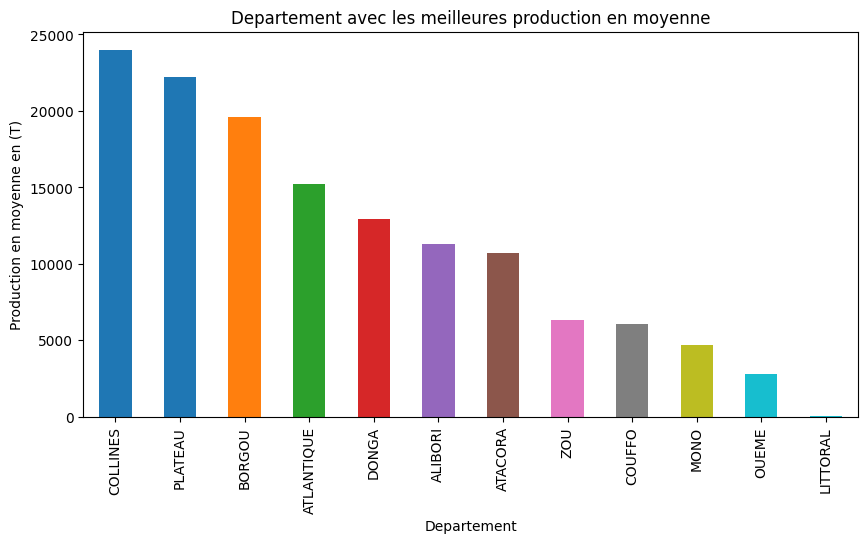

In [ ]:
import matplotlib.cm as cm
# Calcul du rendement moyen par commune
df_rendement_moyen = df_agroclimat.groupby('Departement')['Prod(T)'].mean().sort_values(ascending=False)

# Création du graphique
cmap = cm.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(df_rendement_moyen)))
df_rendement_moyen.plot(kind='bar', color=colors, figsize=(10, 5))

# Ajout des labels et du titre
plt.xlabel('Departement')
plt.ylabel('Production en moyenne en (T)')
plt.title('Departement avec les meilleures production en moyenne')

# Affichage du graphique
plt.show()

Production totale en moyenne de chaque communes par département

In [ ]:
# Regrouper les données par département et commune, puis calculer la somme de la production pour chaque commune
df_prod_par_commune = df_agroclimat.groupby(['Departement', 'Communes'])['Prod(T)'].mean().reset_index()

# Trier les données par département et production (décroissant)
df_prod_par_commune = df_prod_par_commune.sort_values(['Departement', 'Prod(T)'], ascending=[True, False])

# Créer un barplot pour chaque département
for departement in df_prod_par_commune['Departement'].unique():
    df_temp = df_prod_par_commune[df_prod_par_commune['Departement'] == departement]
    plt.figure(figsize=(10, 6))  # Ajuster la taille de la figure si nécessaire
    sns.barplot(x='Communes', y='Prod(T)', data=df_temp, palette='viridis')
    plt.title(f'Production totale en moyenne dans chaque commune dans le département de {departement}')
    plt.xlabel('Communes')
    plt.ylabel('Production totale (T)')
    plt.xticks(rotation=90)  # Faire pivoter les étiquettes de l'axe des x pour une meilleure lisibilité
    plt.tight_layout()  # Ajuster la disposition pour éviter le chevauchement
    plt.show()

In [ ]:
best_prod_communes = df_agroclimat.groupby('Departement')[['Prod(T)', 'Communes']].apply(lambda x: x.loc[x['Prod(T)'].idxmax()])

# Create the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=best_prod_communes['Communes'], y=best_prod_communes['Prod(T)'], hue=best_prod_communes.index)

# Set labels and title
plt.xlabel('Commune')
plt.ylabel('Production (T)')
plt.title('Commune with Highest Production in Each Department')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.legend(title='Departement')
plt.tight_layout()
plt.show()

In [ ]:
best_prod_communes = df_agroclimat.groupby('Departement')[['Rend(kg/ha)', 'Communes']].apply(lambda x: x.loc[x['Rend(kg/ha)'].idxmax()])

# Create the bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=best_prod_communes['Communes'], y=best_prod_communes['Rend(kg/ha)'], hue=best_prod_communes.index)

# Set labels and title
plt.xlabel('Commune')
plt.ylabel('Production (T)')
plt.title('Commune with Highest Rendement in Each Department')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.legend(title='Departement')
plt.tight_layout()
plt.show()

<ipython-input-24-e623390639fe>:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')


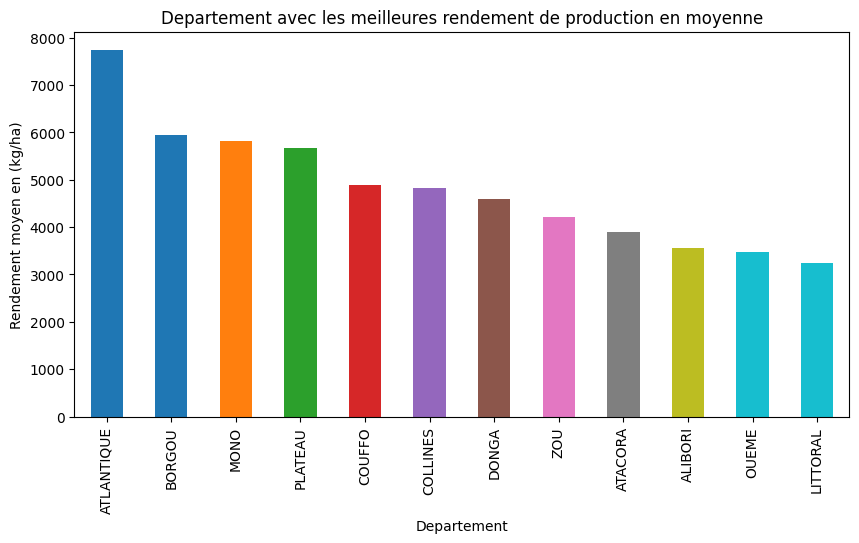

In [ ]:
import matplotlib.cm as cm
# Calcul du rendement moyen par commune
df_rendement_moyen = df_agroclimat.groupby('Departement')['Rend(kg/ha)'].mean().sort_values(ascending=False)

# Création du graphique
cmap = cm.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(df_rendement_moyen)))
df_rendement_moyen.plot(kind='bar', color=colors, figsize=(10, 5))

# Ajout des labels et du titre
plt.xlabel('Departement')
plt.ylabel('Rendement moyen en (kg/ha)')
plt.title('Departement avec les meilleures rendement de production en moyenne')

# Affichage du graphique
plt.show()

Rendement totale en moyenne de chaque commune dans chaque département

<ipython-input-25-810afa6db132>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-25-810afa6db132>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
<ipython-input-25-810afa6db132>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)


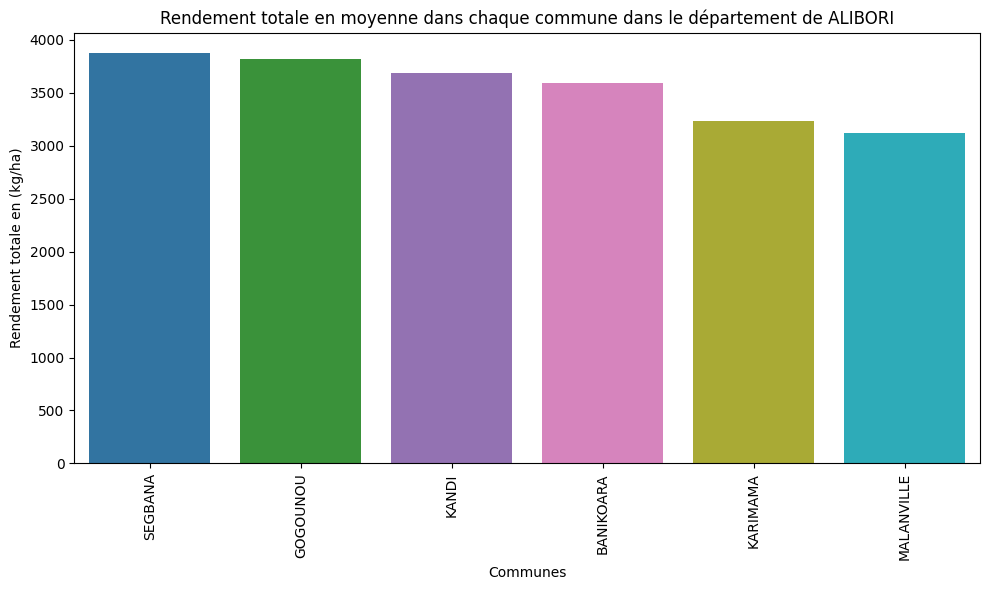

<ipython-input-25-810afa6db132>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-25-810afa6db132>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
<ipython-input-25-810afa6db132>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)


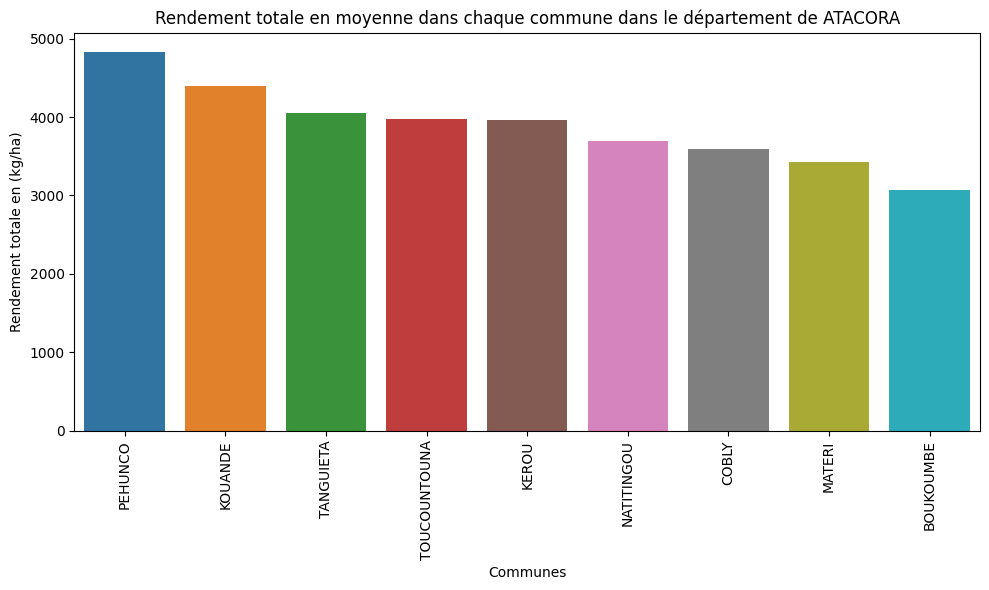

<ipython-input-25-810afa6db132>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-25-810afa6db132>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
<ipython-input-25-810afa6db132>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)


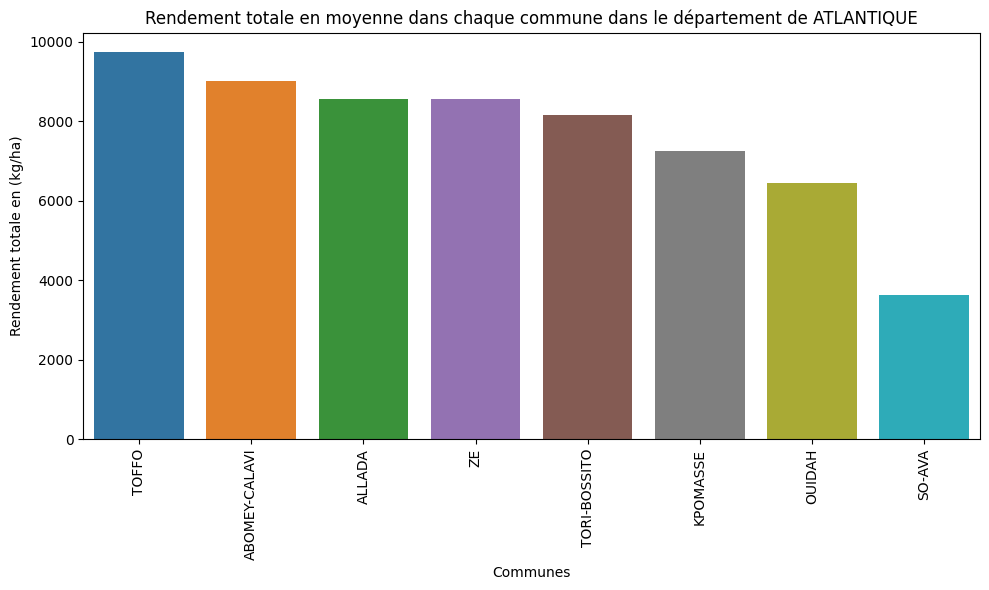

<ipython-input-25-810afa6db132>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-25-810afa6db132>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
<ipython-input-25-810afa6db132>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)


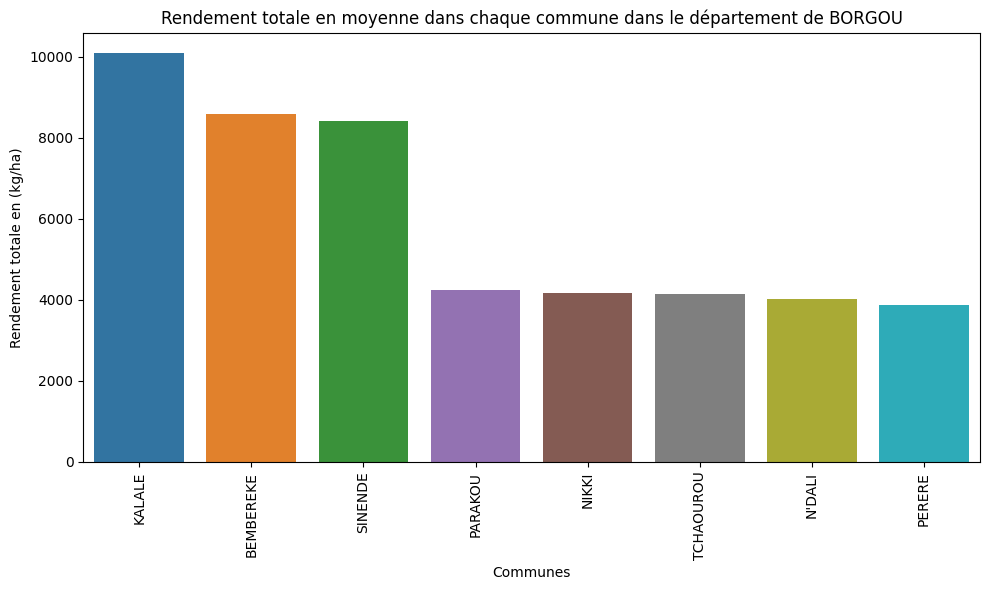

<ipython-input-25-810afa6db132>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-25-810afa6db132>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
<ipython-input-25-810afa6db132>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)


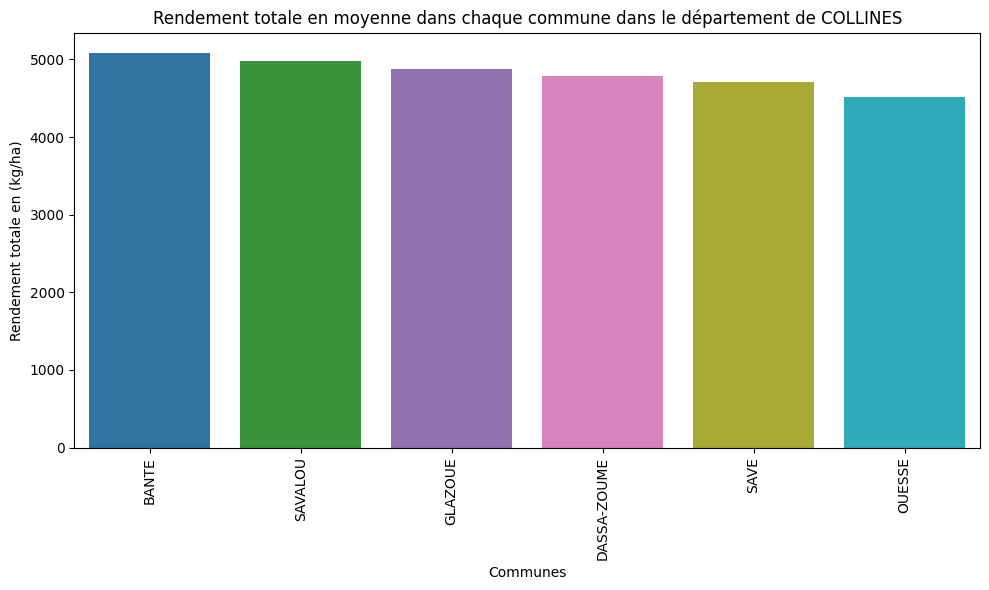

<ipython-input-25-810afa6db132>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-25-810afa6db132>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
<ipython-input-25-810afa6db132>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)


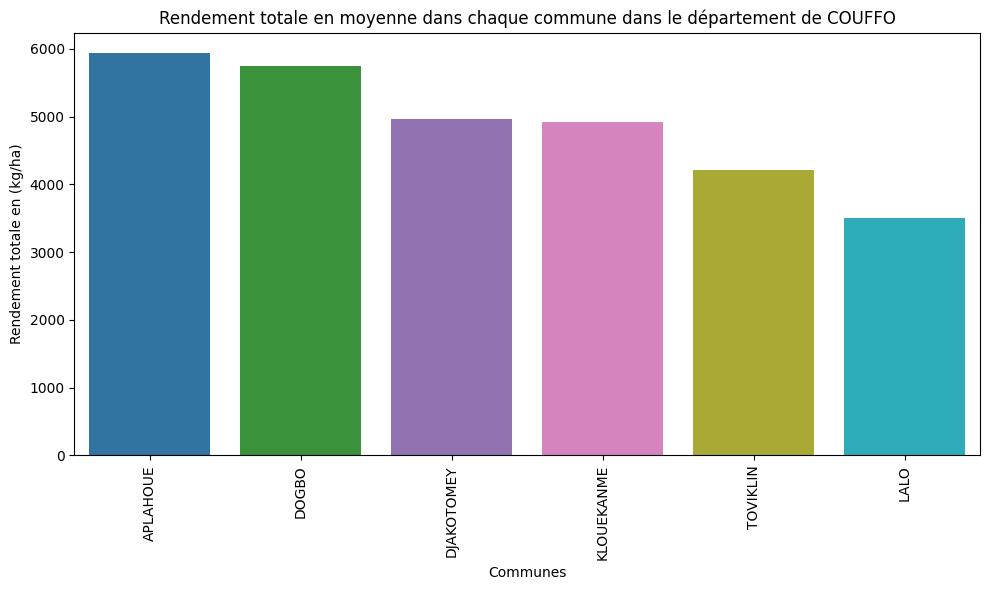

<ipython-input-25-810afa6db132>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-25-810afa6db132>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
<ipython-input-25-810afa6db132>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)


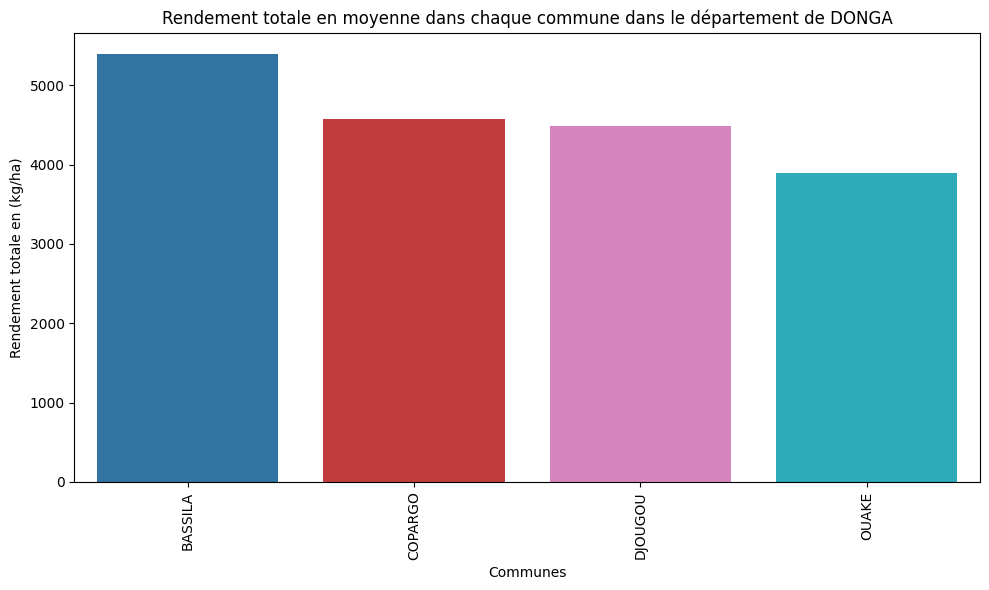

<ipython-input-25-810afa6db132>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-25-810afa6db132>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
<ipython-input-25-810afa6db132>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)


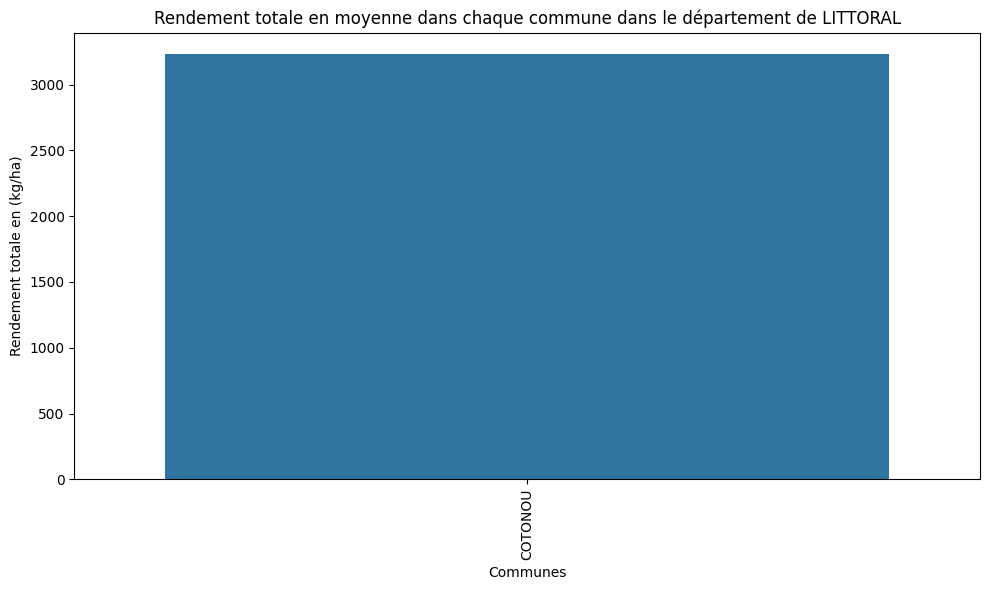

<ipython-input-25-810afa6db132>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-25-810afa6db132>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
<ipython-input-25-810afa6db132>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)


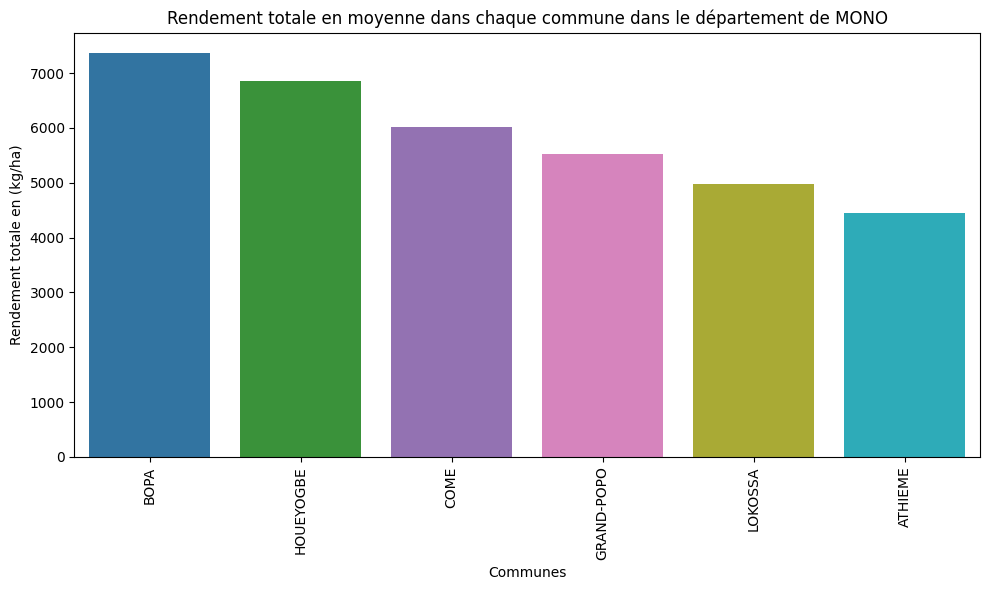

<ipython-input-25-810afa6db132>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-25-810afa6db132>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
<ipython-input-25-810afa6db132>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)


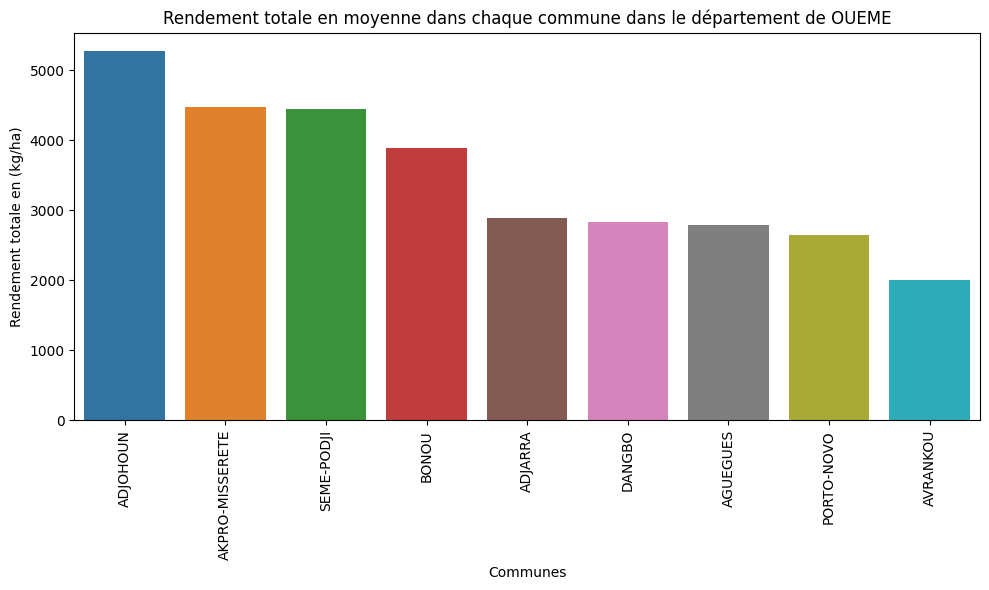

<ipython-input-25-810afa6db132>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-25-810afa6db132>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
<ipython-input-25-810afa6db132>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)


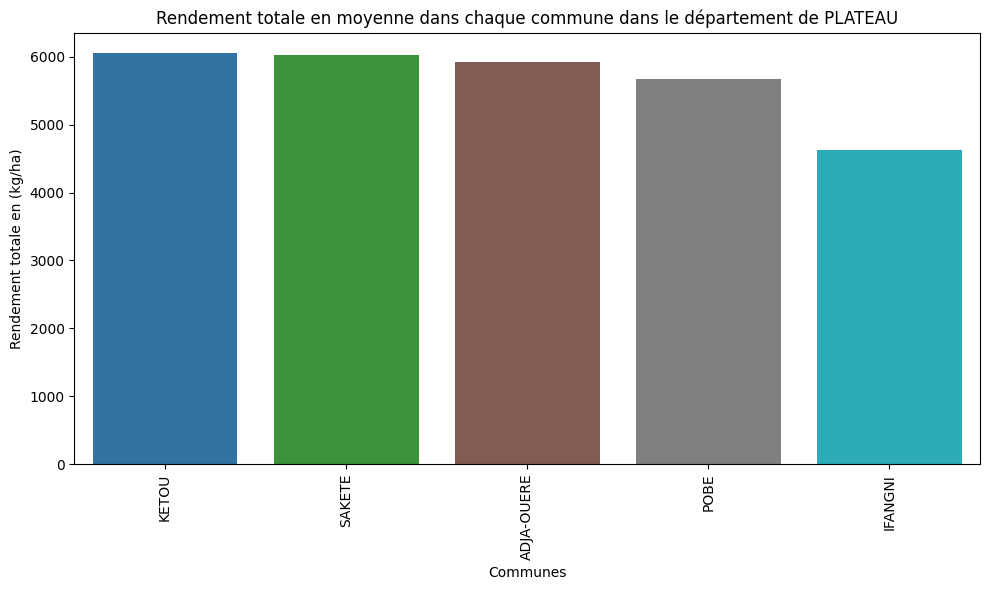

<ipython-input-25-810afa6db132>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-25-810afa6db132>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
<ipython-input-25-810afa6db132>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)


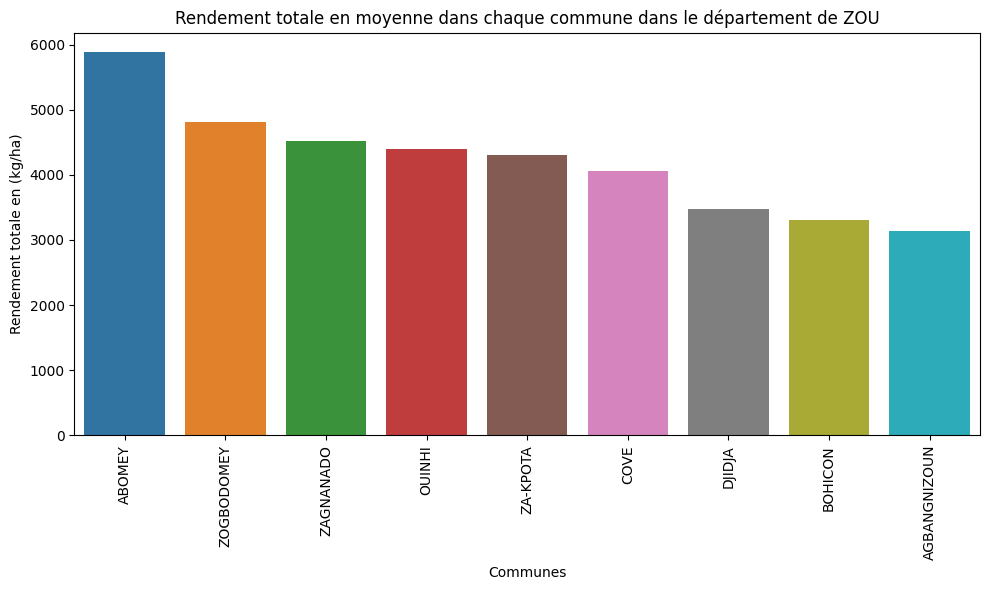

In [ ]:
# Regrouper les données par département et commune, puis calculer la somme de la production pour chaque commune
df_prod_par_commune = df_agroclimat.groupby(['Departement', 'Communes'])['Rend(kg/ha)'].mean().reset_index()

# Trier les données par département et production (décroissant)
df_prod_par_commune = df_prod_par_commune.sort_values(['Departement', 'Rend(kg/ha)'], ascending=[True, False])

# Créer un barplot pour chaque département
for departement in df_prod_par_commune['Departement'].unique():
    df_temp = df_prod_par_commune[df_prod_par_commune['Departement'] == departement]
    cmap = cm.get_cmap('tab10')
    colors = cmap(np.linspace(0, 1, len(df_temp))) # generate colors based on the number of communes in the current departement
    plt.figure(figsize=(10, 6))  # Ajuster la taille de la figure si nécessaire
    sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_temp, palette=colors)
    plt.title(f'Rendement totale en moyenne dans chaque commune dans le département de {departement}')
    plt.xlabel('Communes')
    plt.ylabel('Rendement totale en (kg/ha)')
    plt.xticks(rotation=90)  # Faire pivoter les étiquettes de l'axe des x pour une meilleure lisibilité
    plt.tight_layout()  # Ajuster la disposition pour éviter le chevauchement
    plt.show()

# # Calcul du rendement moyen par commune
# df_rendement_moyen = df_agroclimat.groupby('Communes')['Rend(kg/ha)'].mean().sort_values(ascending=False)

# # Sélection des 10 communes avec les meilleurs rendements
# communes = df_rendement_moyen

# # Création du graphique
# cmap = cm.get_cmap('tab10')
# colors = cmap(np.linspace(0, 1, len(df_rendement_moyen)))
# communes.plot(kind='bar', color=colors, figsize=(22, 12))

# # Ajout des labels et du titre
# plt.xlabel('Communes')
# plt.ylabel('Rendement moyen (g/kg)')
# plt.title('Communes avec un meilleure rendements de production en moyenne')

# # Affichage du graphique
# plt.show()

<ipython-input-26-1cedd48dede7>:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')


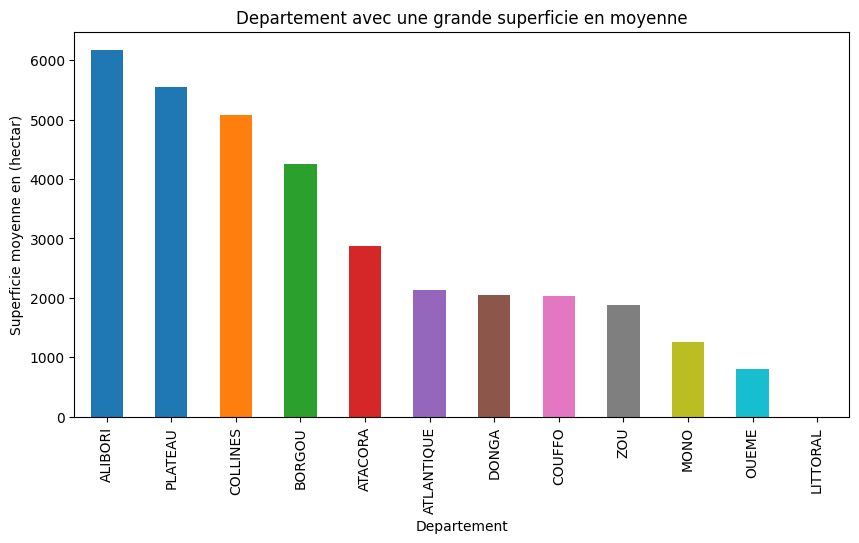

In [ ]:
import matplotlib.cm as cm
# Calcul du rendement moyen par commune
df_rendement_moyen = df_agroclimat.groupby('Departement')['Sup(ha)'].mean().sort_values(ascending=False)

# Création du graphique
cmap = cm.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(df_rendement_moyen)))
df_rendement_moyen.plot(kind='bar', color=colors, figsize=(10, 5))

# Ajout des labels et du titre
plt.xlabel('Departement')
plt.ylabel('Superficie moyenne en (hectar)')
plt.title('Departement avec une grande superficie en moyenne')

# Affichage du graphique
plt.show()

Superficie totale en moyenne de chaque commune par département.

<ipython-input-27-43ea7df26df9>:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')


Text(0, 0.5, 'Moyenne total des superficie en hectares')

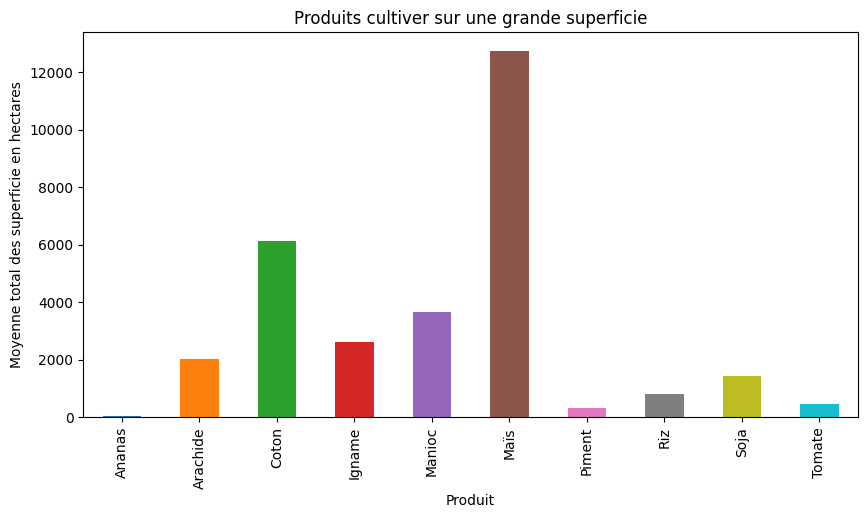

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

#La moyenne des précipitations par communes
superfici = df_agroclimat.groupby('Produit')['Sup(ha)'].mean()

# Création du histogramme
cmap = cm.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(superfici)))
superfici.plot(kind='bar', color=colors, figsize=(10, 5))

# Title et legend
plt.title('Produits cultiver sur une grande superficie')
plt.xlabel('Produit')
plt.ylabel('Moyenne total des superficie en hectares')

<ipython-input-28-ac655df0e45b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-28-ac655df0e45b>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
<ipython-input-28-ac655df0e45b>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)


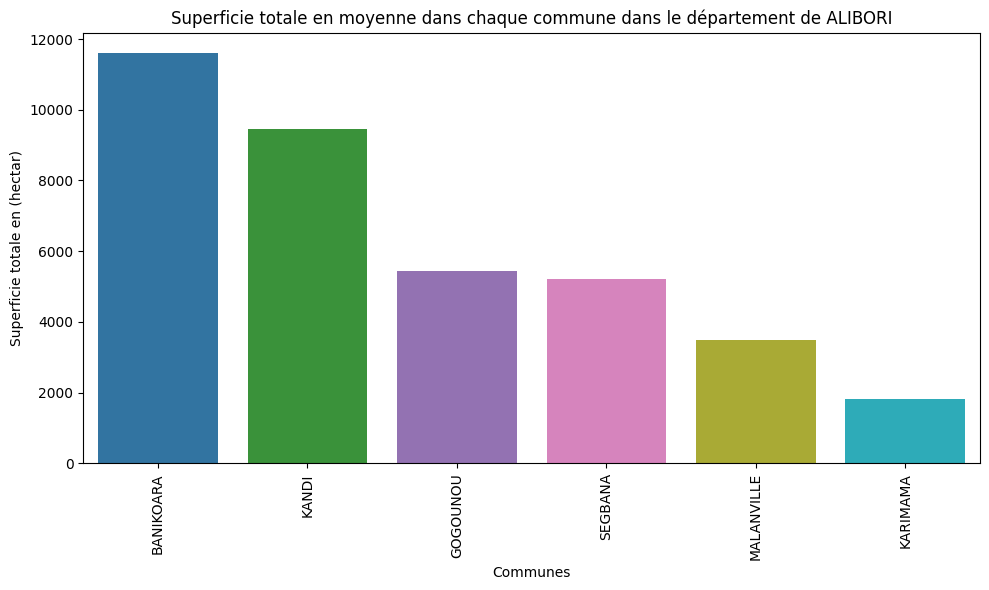

<ipython-input-28-ac655df0e45b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-28-ac655df0e45b>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
<ipython-input-28-ac655df0e45b>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)


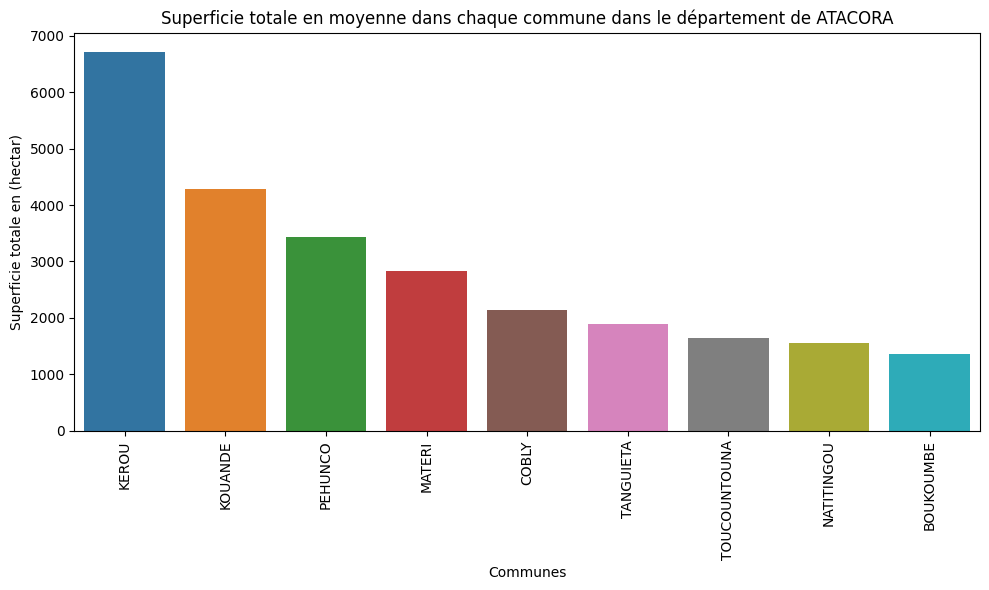

<ipython-input-28-ac655df0e45b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-28-ac655df0e45b>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
<ipython-input-28-ac655df0e45b>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)


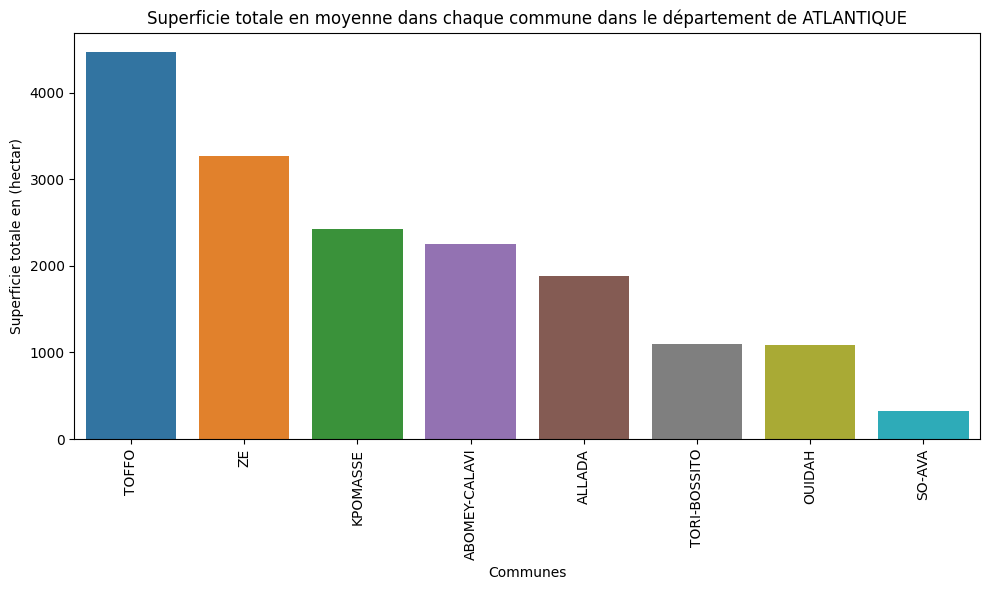

<ipython-input-28-ac655df0e45b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-28-ac655df0e45b>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
<ipython-input-28-ac655df0e45b>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)


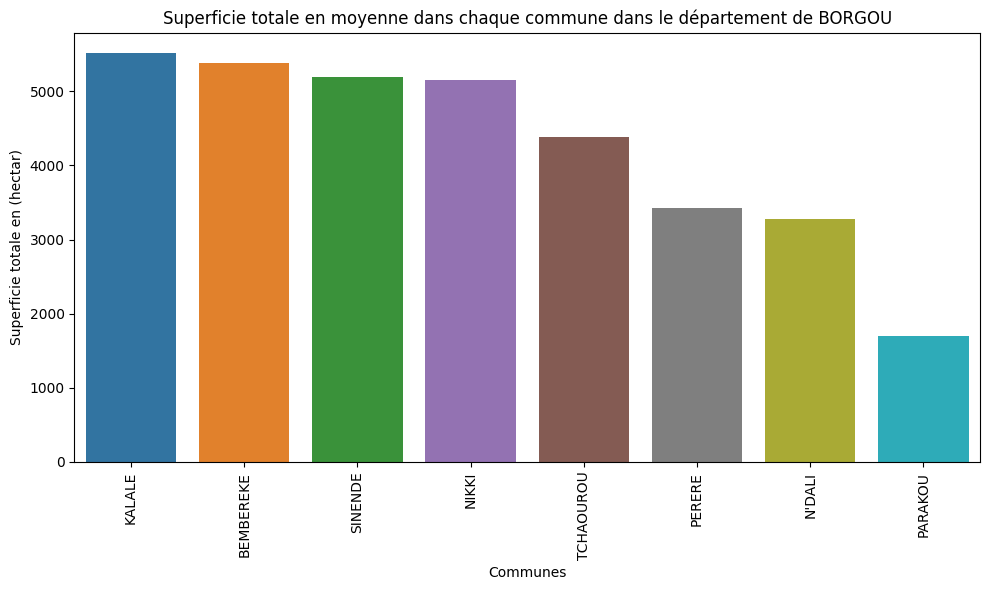

<ipython-input-28-ac655df0e45b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-28-ac655df0e45b>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
<ipython-input-28-ac655df0e45b>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)


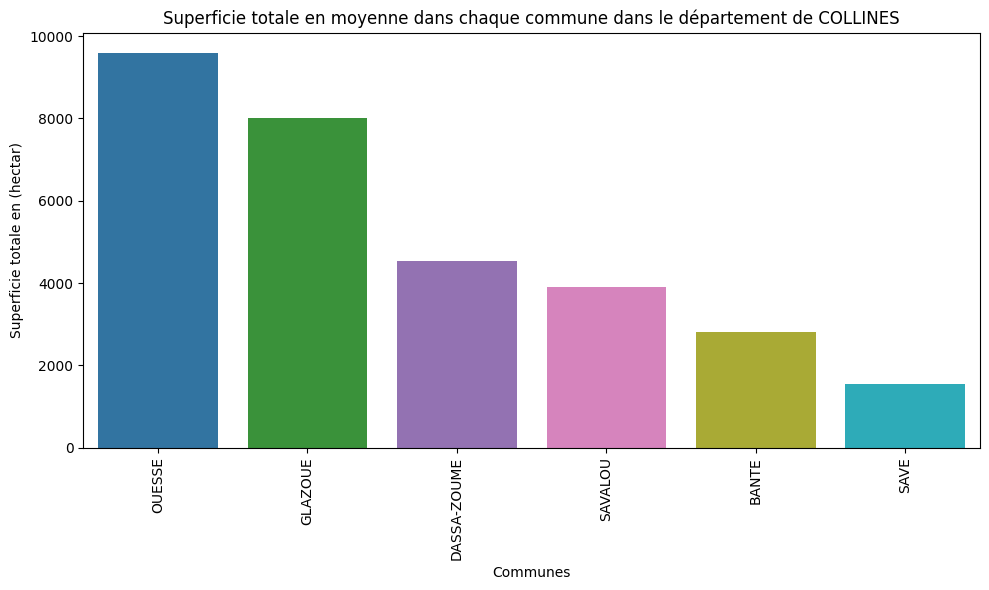

<ipython-input-28-ac655df0e45b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-28-ac655df0e45b>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
<ipython-input-28-ac655df0e45b>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)


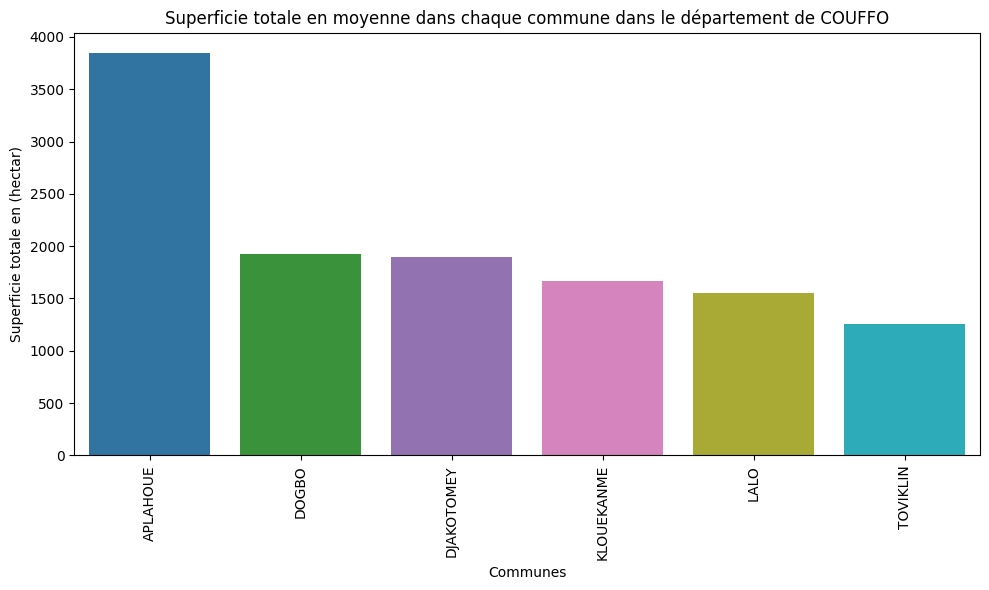

<ipython-input-28-ac655df0e45b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-28-ac655df0e45b>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
<ipython-input-28-ac655df0e45b>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)


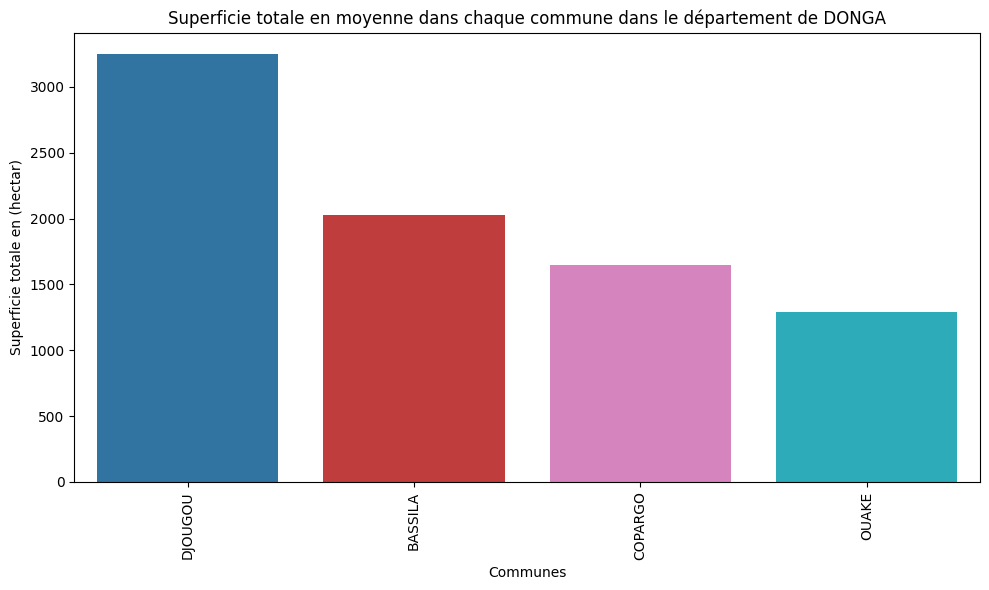

<ipython-input-28-ac655df0e45b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-28-ac655df0e45b>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
<ipython-input-28-ac655df0e45b>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)


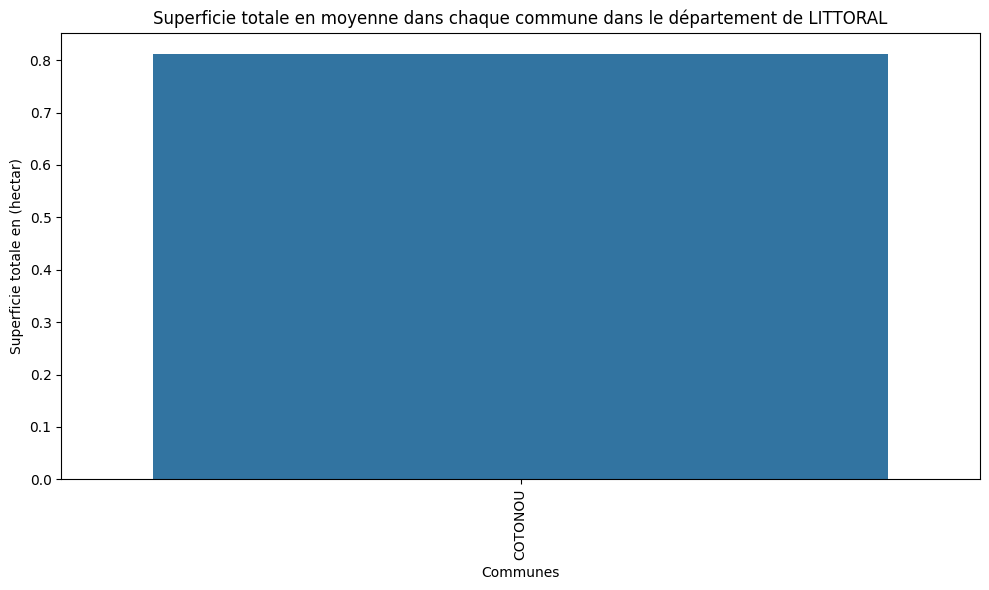

<ipython-input-28-ac655df0e45b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-28-ac655df0e45b>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
<ipython-input-28-ac655df0e45b>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)


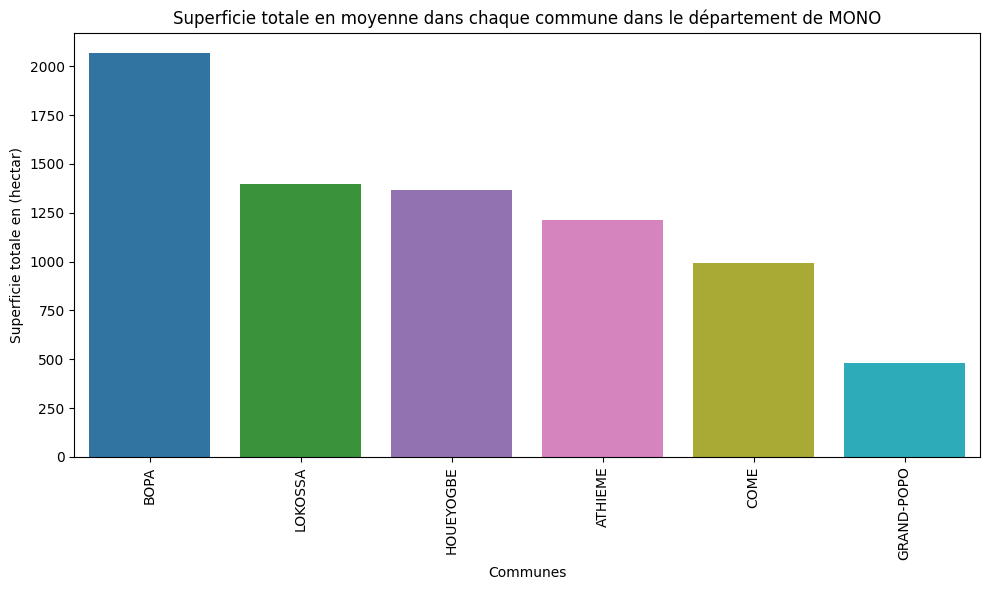

<ipython-input-28-ac655df0e45b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-28-ac655df0e45b>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
<ipython-input-28-ac655df0e45b>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)


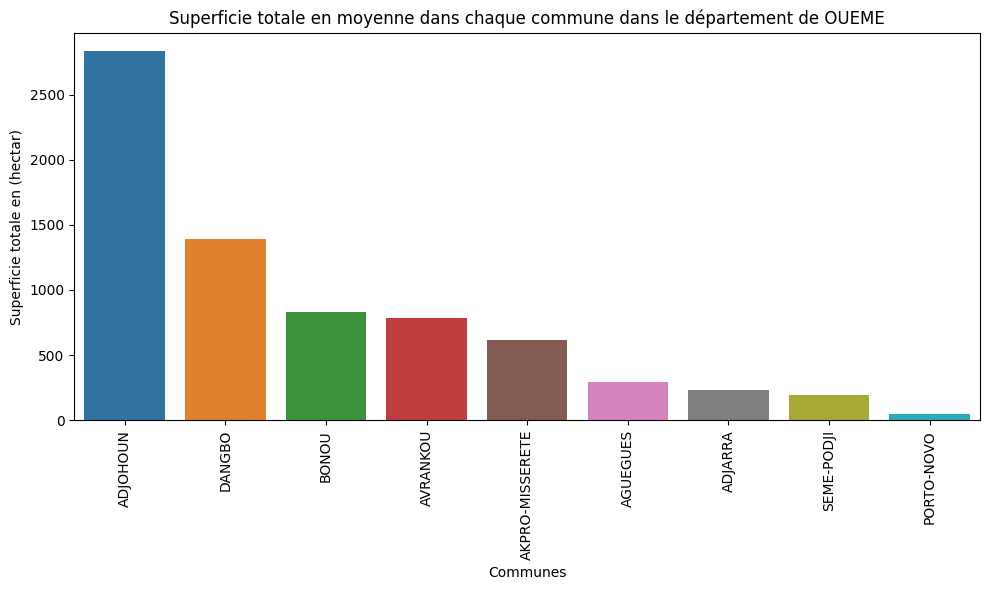

<ipython-input-28-ac655df0e45b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-28-ac655df0e45b>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
<ipython-input-28-ac655df0e45b>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)


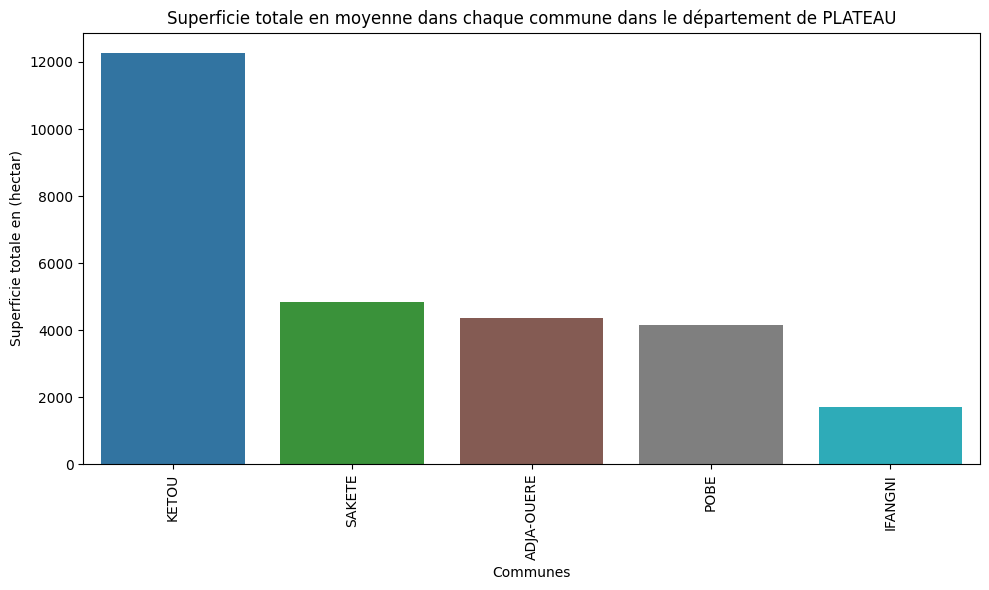

<ipython-input-28-ac655df0e45b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')
<ipython-input-28-ac655df0e45b>:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
<ipython-input-28-ac655df0e45b>:13: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)


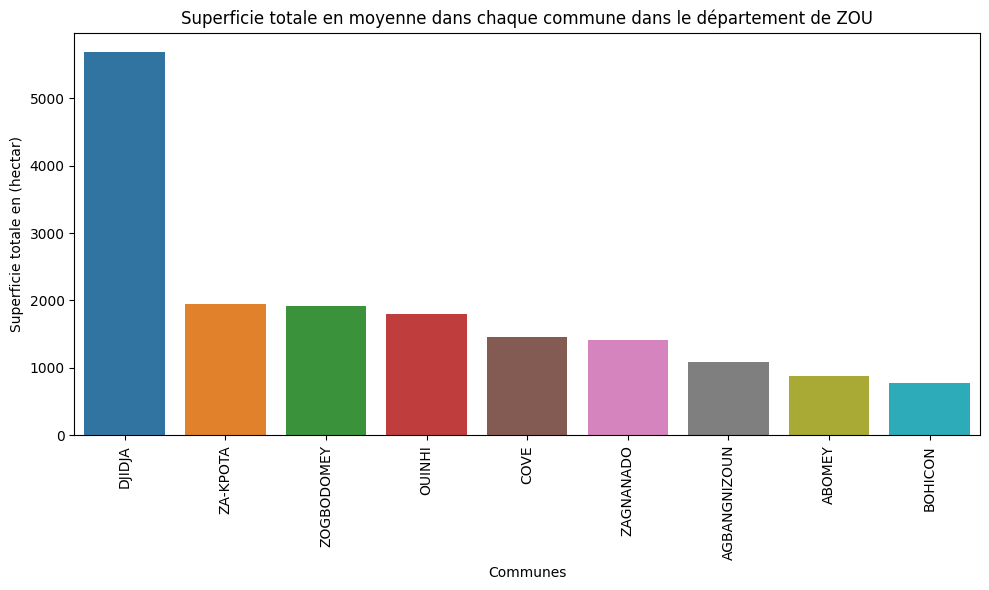

In [ ]:
# Regrouper les données par département et commune, puis calculer la somme de la production pour chaque commune
df_prod_par_commune = df_agroclimat.groupby(['Departement', 'Communes'])['Sup(ha)'].mean().reset_index()

# Trier les données par département et production (décroissant)
df_prod_par_commune = df_prod_par_commune.sort_values(['Departement', 'Sup(ha)'], ascending=[True, False])

# Créer un barplot pour chaque département
for departement in df_prod_par_commune['Departement'].unique():
    df_temp = df_prod_par_commune[df_prod_par_commune['Departement'] == departement]
    cmap = cm.get_cmap('tab10')
    colors = cmap(np.linspace(0, 1, len(df_temp))) # generate colors based on the number of communes in the current departement
    plt.figure(figsize=(10, 6))  # Ajuster la taille de la figure si nécessaire
    sns.barplot(x='Communes', y='Sup(ha)', data=df_temp, palette=colors)
    plt.title(f'Superficie totale en moyenne dans chaque commune dans le département de {departement}')
    plt.xlabel('Communes')
    plt.ylabel('Superficie totale en (hectar)')
    plt.xticks(rotation=90)  # Faire pivoter les étiquettes de l'axe des x pour une meilleure lisibilité
    plt.tight_layout()  # Ajuster la disposition pour éviter le chevauchement
    plt.show()

<ipython-input-29-f93ce045711d>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')


Text(0, 0.5, 'Moyenne total des produtions en tonnes')

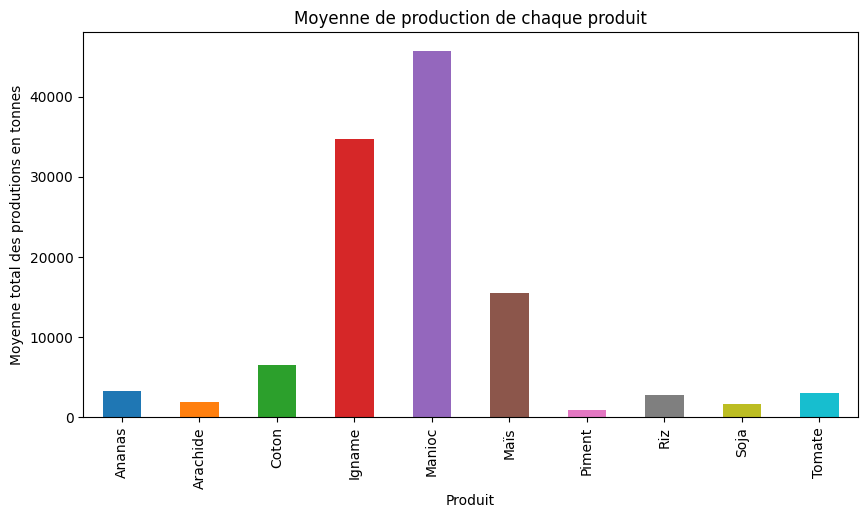

In [ ]:
production = df_agroclimat.groupby('Produit')['Prod(T)'].mean()

# Création du histogramme
cmap = cm.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(production)))
production.plot(kind='bar', color=colors, figsize=(10, 5))

# Title et legend
plt.title('Moyenne de production de chaque produit')
plt.xlabel('Produit')
plt.ylabel('Moyenne total des produtions en tonnes')

<ipython-input-30-f0f63622b9b9>:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab10')


Text(0, 0.5, 'Moyenne total des rendements en kg/ha')

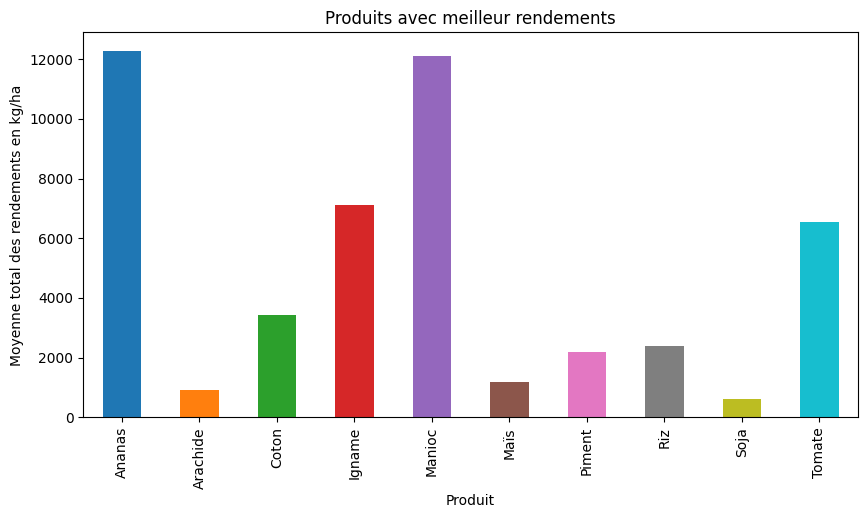

In [ ]:
# Création du histogramme
rendements = df_agroclimat.groupby('Produit')['Rend(kg/ha)'].mean()

# Création du histogramme
cmap = cm.get_cmap('tab10')
colors = cmap(np.linspace(0, 1, len(rendements)))
rendements.plot(kind='bar', color=colors, figsize=(10, 5))

# Title et legend
plt.title('Produits avec meilleur rendements')
plt.xlabel('Produit')
plt.ylabel('Moyenne total des rendements en kg/ha')

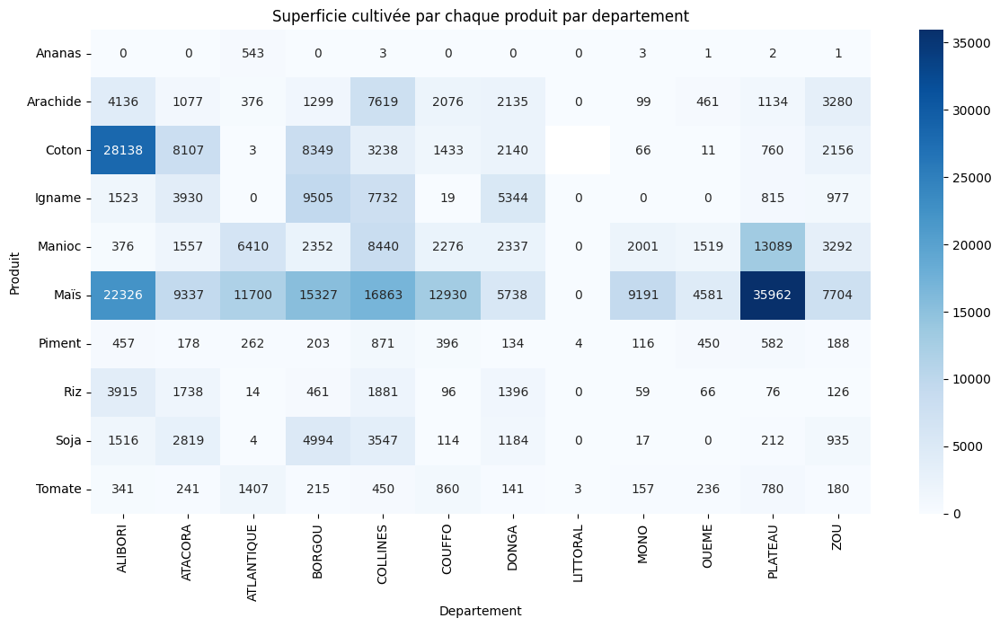

In [ ]:
# Group the data by product and department
grouped_data = df_agroclimat.groupby(['Produit', 'Departement'])['Sup(ha)'].mean().unstack()

# Plot the data as a heatmap
plt.figure(figsize=(14, 7))
sns.heatmap(grouped_data, cmap='Blues', annot=True, fmt=".0f")
plt.xlabel('Departement')
plt.ylabel('Produit')
plt.title('Superficie cultivée par chaque produit par departement')
plt.show()

# # Plot the data as a line chart
# grouped_data.plot(kind='line', figsize=(20, 10), marker='o')
# plt.xlabel('Produit')
# plt.ylabel('Production totale (tonnes)')
# plt.title('Rendement totale par produit et département')
# plt.show()

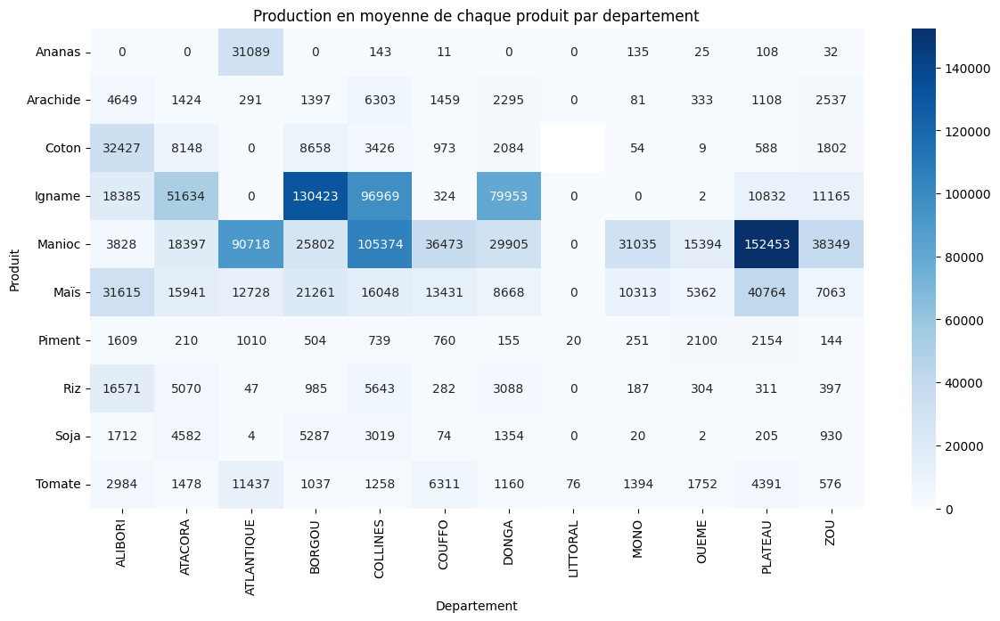

In [ ]:
# Group the data by product and department
grouped_data = df_agroclimat.groupby(['Produit', 'Departement'])['Prod(T)'].mean().unstack()

# Plot the data as a heatmap
plt.figure(figsize=(14, 7))
sns.heatmap(grouped_data, cmap='Blues', annot=True, fmt=".0f")
plt.xlabel('Departement')
plt.ylabel('Produit')
plt.title('Production en moyenne de chaque produit par departement')
plt.show()

# # Plot the data as a line chart
# grouped_data.plot(kind='line', figsize=(20, 10), marker='o')
# plt.xlabel('Produit')
# plt.ylabel('Production totale (tonnes)')
# plt.title('Rendement totale par produit et département')
# plt.show()

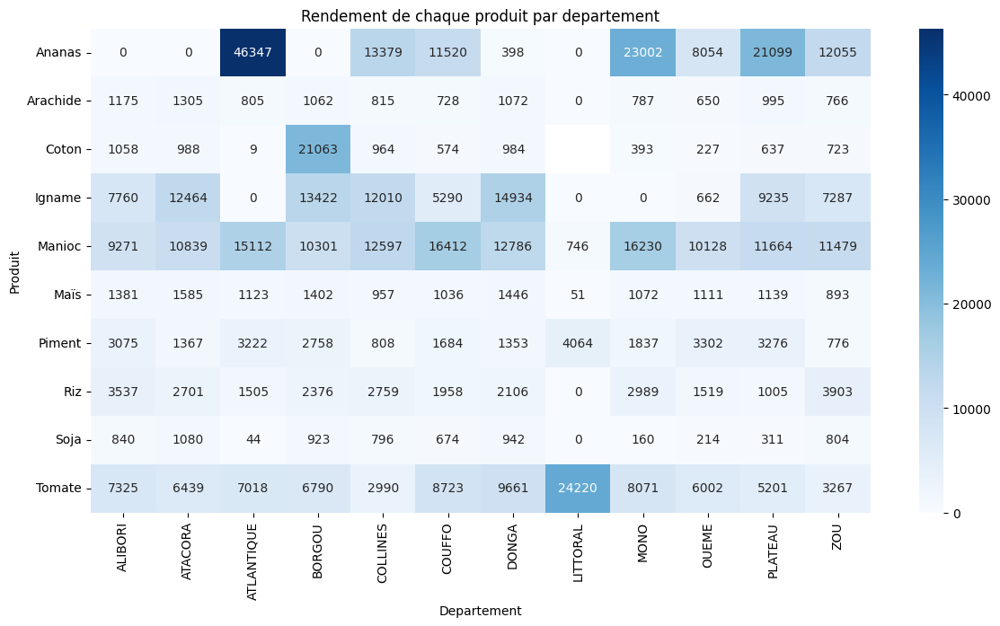

In [ ]:
# Group the data by product and department
grouped_data = df_agroclimat.groupby(['Produit', 'Departement'])['Rend(kg/ha)'].mean().unstack()

# Plot the data as a heatmap
plt.figure(figsize=(14, 7))
sns.heatmap(grouped_data, cmap='Blues', annot=True, fmt=".0f")
plt.xlabel('Departement')
plt.ylabel('Produit')
plt.title('Rendement de chaque produit par departement')
plt.show()

# # Plot the data as a line chart
# grouped_data.plot(kind='line', figsize=(20, 10), marker='o')
# plt.xlabel('Produit')
# plt.ylabel('Production totale (tonnes)')
# plt.title('Rendement totale par produit et département')
# plt.show()

In [ ]:
# Group the data by department, commune, and product, then calculate the total production for each combination
df_prod_par_commune_produit = df_agroclimat.groupby(['Departement', 'Communes', 'Produit'])['Prod(T)'].sum().reset_index()

# Iterate over each department and create a barplot for the top producing communes for each product
for departement in df_prod_par_commune_produit['Departement'].unique():
    df_temp = df_prod_par_commune_produit[df_prod_par_commune_produit['Departement'] == departement]

    # Get the unique products in the department
    produits = df_temp['Produit'].unique()

    # Create subplots for each product
    fig, axes = plt.subplots(nrows=len(produits), ncols=1, figsize=(10, 6 * len(produits)))

    for i, produit in enumerate(produits):
        df_produit = df_temp[df_temp['Produit'] == produit].sort_values('Prod(T)', ascending=False)
        sns.barplot(x='Communes', y='Prod(T)', data=df_produit, ax=axes[i], palette='magma')
        axes[i].set_title(f'Production de {produit} dans chaque commune dans le département de {departement}')
        axes[i].set_xlabel('Communes')
        axes[i].set_ylabel('Production totale (T)')
        axes[i].tick_params(axis='x', rotation=90)

    plt.tight_layout()
    plt.show()


In [ ]:
# Group the data by department, commune, and product, then calculate the total production for each combination
df_prod_par_commune_produit = df_agroclimat.groupby(['Departement', 'Communes', 'Produit'])['Sup(ha)'].mean().reset_index()

# Iterate over each department and create a barplot for the top producing communes for each product
for departement in df_prod_par_commune_produit['Departement'].unique():
    df_temp = df_prod_par_commune_produit[df_prod_par_commune_produit['Departement'] == departement]

    # Get the unique products in the department
    produits = df_temp['Produit'].unique()

    # Create subplots for each product
    fig, axes = plt.subplots(nrows=len(produits), ncols=1, figsize=(10, 6 * len(produits)))

    for i, produit in enumerate(produits):
        df_produit = df_temp[df_temp['Produit'] == produit].sort_values('Sup(ha)', ascending=False)
        sns.barplot(x='Communes', y='Sup(ha)', data=df_produit, ax=axes[i], palette='magma')
        axes[i].set_title(f'Superficie occupée par {produit} dans chaque commune dans le département de {departement}')
        axes[i].set_xlabel('Communes')
        axes[i].set_ylabel('Superficie totale en hectar')
        axes[i].tick_params(axis='x', rotation=90)

    plt.tight_layout()
    plt.show()


In [ ]:
# Group the data by department, commune, and product, then calculate the total production for each combination
df_prod_par_commune_produit = df_agroclimat.groupby(['Departement', 'Communes', 'Produit'])['Rend(kg/ha)'].mean().reset_index()

# Iterate over each department and create a barplot for the top producing communes for each product
for departement in df_prod_par_commune_produit['Departement'].unique():
    df_temp = df_prod_par_commune_produit[df_prod_par_commune_produit['Departement'] == departement]

    # Get the unique products in the department
    produits = df_temp['Produit'].unique()

    # Create subplots for each product
    fig, axes = plt.subplots(nrows=len(produits), ncols=1, figsize=(10, 6 * len(produits)))

    for i, produit in enumerate(produits):
        df_produit = df_temp[df_temp['Produit'] == produit].sort_values('Rend(kg/ha)', ascending=False)
        sns.barplot(x='Communes', y='Rend(kg/ha)', data=df_produit, ax=axes[i], palette='magma')
        axes[i].set_title(f'Rendement de {produit} dans chaque commune dans le département de {departement}')
        axes[i].set_xlabel('Communes')
        axes[i].set_ylabel('Rendement totale (kg/ha)')
        axes[i].tick_params(axis='x', rotation=90)

    plt.tight_layout()
    plt.show()


In [ ]:
# Pour chaque département, trouver les communes avec la meilleure production pour chaque produit
for departement in df_agroclimat['Departement'].unique():
    df_temp = df_agroclimat[df_agroclimat['Departement'] == departement]

    # Trouver la commune avec la meilleure production pour chaque produit
    # Use a list to select multiple columns
    best_communes = df_temp.groupby('Produit')[['Prod(T)', 'Communes']].apply(lambda x: x.loc[x['Prod(T)'].idxmax()])

    # Afficher les résultats
    print(f"Dans le département de {departement}, les communes avec la meilleure production par produit sont:")
    print(best_communes)
    print("\n")

Dans le département de BORGOU, les communes avec la meilleure production par produit sont:
                Prod(T)   Communes
Produit                           
Ananas         0.000000  BEMBEREKE
Arachide    6099.000000    SINENDE
Coton      47193.990000    SINENDE
Igname    592101.125000  TCHAOUROU
Manioc    172736.000000  TCHAOUROU
Maïs       60591.000000      NIKKI
Piment      7248.000000  TCHAOUROU
Riz         5746.479193  BEMBEREKE
Soja       41829.800000  BEMBEREKE
Tomate      7627.000000  TCHAOUROU


Dans le département de ALIBORI, les communes avec la meilleure production par produit sont:
                Prod(T)    Communes
Produit                            
Ananas         0.000000   BANIKOARA
Arachide   14765.000000       KANDI
Coton     188566.000000   BANIKOARA
Igname    165095.021826     SEGBANA
Manioc     27712.000000     SEGBANA
Maïs      121005.400000   BANIKOARA
Piment     15647.174559  MALANVILLE
Riz       149639.369884  MALANVILLE
Soja       37797.575105     SEGBANA

In [ ]:
import pandas as pd
# Pour chaque département, trouver les communes avec la meilleure production pour chaque produit
resultats = []
for departement in df_agroclimat['Departement'].unique():
    df_temp = df_agroclimat[df_agroclimat['Departement'] == departement]

    # Trouver la commune avec la meilleure production pour chaque produit
    best_communes = df_temp.groupby('Produit')[['Prod(T)', 'Communes']].apply(lambda x: x.loc[x['Prod(T)'].idxmax()])

    # Ajouter les résultats à la liste
    for produit, row in best_communes.iterrows():
        resultats.append({
            'Departement': departement,
            'Produit': produit,
            'Meilleure Commune': row['Communes'],
            'Production (T)': row['Prod(T)']
        })

# Créer un DataFrame à partir des résultats
df_resultats = pd.DataFrame(resultats)

# Afficher le tableau
df_resultats.head(40)


In [ ]:
import matplotlib.pyplot as plt
# Group the data by department, commune, and product, then calculate the total production for each combination
df_prod_par_commune_produit = df_agroclimat.groupby(['Departement', 'Communes', 'Produit'])['Prod(T)'].sum().reset_index()

# Calculate the total production for each department
df_total_prod_par_departement = df_prod_par_commune_produit.groupby(['Departement', 'Produit'])['Prod(T)'].sum().reset_index()

# Iterate over each department and create a pie chart for each commune showing the percentage of production for each product
for departement in df_prod_par_commune_produit['Departement'].unique():
    df_temp_dept = df_prod_par_commune_produit[df_prod_par_commune_produit['Departement'] == departement]

    for commune in df_temp_dept['Communes'].unique():
        df_temp_commune = df_temp_dept[df_temp_dept['Communes'] == commune]

        # Calculate the percentage of production for each product in the commune
        total_production_commune = df_temp_commune['Prod(T)'].sum()
        df_temp_commune['Percentage'] = (df_temp_commune['Prod(T)'] / total_production_commune) * 100

        # Create a pie chart
        plt.figure(figsize=(8, 6))
        plt.pie(df_temp_commune['Percentage'], labels=df_temp_commune['Produit'], autopct='%1.1f%%', startangle=180)
        plt.title(f"Pourcentage de production de chaque produit dans la commune {commune} département de ({departement})")
        plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
        plt.legend(loc="best")
        plt.show()


In [ ]:
import matplotlib.pyplot as plt
# Group the data by department, commune, and product, then calculate the total production for each combination
df_prod_par_commune_produit = df_agroclimat.groupby(['Departement', 'Communes', 'Produit'])['Sup(ha)'].sum().reset_index()

# Calculate the total production for each department
df_total_prod_par_departement = df_prod_par_commune_produit.groupby(['Departement', 'Produit'])['Sup(ha)'].sum().reset_index()

# Iterate over each department and create a pie chart for each commune showing the percentage of production for each product
for departement in df_prod_par_commune_produit['Departement'].unique():
    df_temp_dept = df_prod_par_commune_produit[df_prod_par_commune_produit['Departement'] == departement]

    for commune in df_temp_dept['Communes'].unique():
        df_temp_commune = df_temp_dept[df_temp_dept['Communes'] == commune]

        # Calculate the percentage of production for each product in the commune
        total_production_commune = df_temp_commune['Sup(ha)'].sum()
        df_temp_commune['Percentage'] = (df_temp_commune['Sup(ha)'] / total_production_commune) * 100

        # Create a pie chart
        plt.figure(figsize=(8, 6))
        plt.pie(df_temp_commune['Percentage'], labels=df_temp_commune['Produit'], autopct='%1.1f%%', startangle=180)
        plt.title(f"Pourcentage en superficie de chaque produit dans la commune {commune} département de ({departement})")
        plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
        plt.legend(loc="best")
        plt.show()

In [ ]:
import matplotlib.pyplot as plt
# Group the data by department, commune, and product, then calculate the total production for each combination
df_prod_par_commune_produit = df_agroclimat.groupby(['Departement', 'Communes', 'Produit'])['Rend(kg/ha)'].sum().reset_index()

# Calculate the total production for each department
df_total_prod_par_departement = df_prod_par_commune_produit.groupby(['Departement', 'Produit'])['Rend(kg/ha)'].sum().reset_index()

# Iterate over each department and create a pie chart for each commune showing the percentage of production for each product
for departement in df_prod_par_commune_produit['Departement'].unique():
    df_temp_dept = df_prod_par_commune_produit[df_prod_par_commune_produit['Departement'] == departement]

    for commune in df_temp_dept['Communes'].unique():
        df_temp_commune = df_temp_dept[df_temp_dept['Communes'] == commune]

        # Calculate the percentage of production for each product in the commune
        total_production_commune = df_temp_commune['Rend(kg/ha)'].sum()
        df_temp_commune['Percentage'] = (df_temp_commune['Rend(kg/ha)'] / total_production_commune) * 100

        # Create a pie chart
        plt.figure(figsize=(8, 6))
        plt.pie(df_temp_commune['Percentage'], labels=df_temp_commune['Produit'], autopct='%1.1f%%', startangle=180)
        plt.title(f"Pourcentage de rendement de chaque produit dans la commune {commune} département de ({departement})")
        plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
        plt.legend(loc="best")
        plt.show()

In [ ]:
# Group the data by product and department
grouped_data = df_agroclimat.groupby(['Departement', 'Produit'])['Prod(T)'].mean().unstack()

# Calculate the total rendement for each department
total_rendement_by_produit = grouped_data.mean(axis=0)

# Calculate the percentage of rendement for each product in each department
percentage_rendement = grouped_data.divide(total_rendement_by_produit, axis=1) * 100

# Fill NaN values with 0 - this assumes a missing value means no yield for that product in that department
percentage_rendement = percentage_rendement.fillna(0)

# Create a pie chart for each department
for produit in percentage_rendement.columns:
    plt.figure(figsize=(10, 7))
    plt.pie(percentage_rendement[produit], labels=percentage_rendement.index, autopct="%1.1f%%", center=(0, 0), radius=1.5)
    plt.title(f"Pourcentage de production de chaque produit obtenus par département")
    plt.axis("equal")
    plt.legend(loc="best")
    plt.show()

In [ ]:
# Group the data by product and department
grouped_data = df_agroclimat.groupby(['Departement', 'Produit'])['Rend(kg/ha)'].mean().unstack()

# Calculate the total rendement for each department
total_rendement_by_produit = grouped_data.mean(axis=0)

# Calculate the percentage of rendement for each product in each department
percentage_rendement = grouped_data.divide(total_rendement_by_produit, axis=1) * 100

# Fill NaN values with 0 - this assumes a missing value means no yield for that product in that department
percentage_rendement = percentage_rendement.fillna(0)

# Create a pie chart for each department
for produit in percentage_rendement.columns:
    plt.figure(figsize=(10, 7))
    plt.pie(percentage_rendement[produit], labels=percentage_rendement.index, autopct="%1.1f%%")
    plt.title(f"Pourcentage de rendement des produits obtenus par département")
    plt.axis("equal")
    plt.legend(loc="best")
    plt.show()

In [ ]:
# # Group the data by product and department
# grouped_data = df_agroclimat.groupby(['Departement', 'Produit'])['Sup(ha)'].mean().unstack()

# # Calculate the total rendement for each department
# total_rendement_by_produit = grouped_data.mean(axis=0)

# # Calculate the percentage of rendement for each product in each department
# percentage_rendement = grouped_data.divide(total_rendement_by_produit, axis=1) * 100

# # Fill NaN values with 0 - this assumes a missing value means no yield for that product in that department
# percentage_rendement = percentage_rendement.fillna(0)

# # Create a pie chart for each department
# for produit in percentage_rendement.columns:
#     plt.figure(figsize=(10, 7))
#     plt.pie(percentage_rendement[produit], labels=percentage_rendement.index, autopct="%1.1f%%", center=(0, 0), radius=1.5)
#     plt.title(f"Pourcentage de superficie occupé par chaque produits dans les départements")
#     plt.axis("equal")
#     plt.legend(loc="best")
#     plt.show()

In [ ]:
# Group the data by product
grouped_data = df_agroclimat.groupby('Produit')

# Loop through each product and plot the rendement moyen by department
for product, data in grouped_data:
  plt.figure(figsize=(15, 9))
  #Création du graphique
  df_production_par_departement = data.groupby(['Annees', 'Departement'])['Prod(T)'].mean().unstack()
  # Création du graphique
  cmap = cm.get_cmap('tab10')
  colors = cmap(np.linspace(0, 1, len(df_production_par_departement)))
  df_production_par_departement.plot(kind='line', color=colors, figsize=(15, 9), marker='o')
  plt.xlabel('Années')
  plt.ylabel('Prod(T)')
  plt.title(f'Evolution de  la production en moyenne de {product} par département et année')
  plt.show() # Add plt.show() to display each plot within the loop

In [ ]:
# Group the data by product
grouped_data = df_agroclimat.groupby('Produit')

# Loop through each product and plot the rendement moyen by department
for product, data in grouped_data:
  plt.figure(figsize=(15, 9))
  #Création du graphique
  df_production_par_departement = data.groupby(['Annees', 'Departement'])['Sup(ha)'].mean().unstack()
  # Création du graphique
  cmap = cm.get_cmap('tab10')
  colors = cmap(np.linspace(0, 1, len(df_production_par_departement)))
  df_production_par_departement.plot(kind='line', color=colors, figsize=(15, 9), marker='o')
  plt.xlabel('Années')
  plt.ylabel('Sup(ha)')
  plt.title(f'Evolution de la superficie en moyenne occupée par la culture de {product} par département et année')
  plt.show() # Add plt.show() to display each plot within the loop

In [ ]:
# Group the data by product
grouped_data = df_agroclimat.groupby('Produit')

# Loop through each product and plot the rendement moyen by department
for product, data in grouped_data:
  plt.figure(figsize=(15, 9))
  #Création du graphique
  df_production_par_departement = data.groupby(['Annees', 'Departement'])['Rend(kg/ha)'].mean().unstack()
  # Création du graphique
  cmap = cm.get_cmap('tab10')
  colors = cmap(np.linspace(0, 1, len(df_production_par_departement)))
  df_production_par_departement.plot(kind='line', color=colors, figsize=(15, 9), marker='o')
  plt.xlabel('Années')
  plt.ylabel('Rend(kg/ha)')
  plt.title(f'Evolution du Rendement de production en moyenne de {product} par département et année')
  plt.show() # Add plt.show() to display each plot within the loop

#Analyse et Visualisation des données Climatiques

In [ ]:
df_agroclimat.head()

,Produit,Departement,Communes,Sup(ha),Rend(kg/ha),Prod(T),Annees,PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1),PRECTOTCORR(mm/an)
0,Maïs,BORGOU,BEMBEREKE,9509.0,923.756441,8784.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
1,Maïs,BORGOU,KALALE,18300.0,1107.595628,20269.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
2,Maïs,BORGOU,N'DALI,7764.0,1467.284905,11392.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
3,Maïs,BORGOU,NIKKI,15089.0,1267.413347,19124.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
4,Maïs,BORGOU,PARAKOU,7495.0,1102.735157,8265.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175


<Figure size 2000x1200 with 0 Axes>

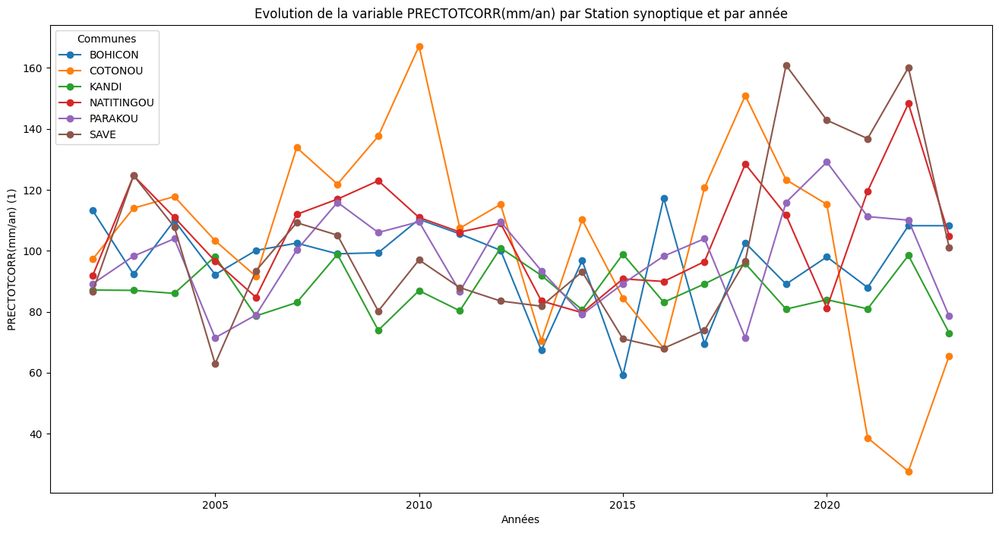

<Figure size 2000x1200 with 0 Axes>

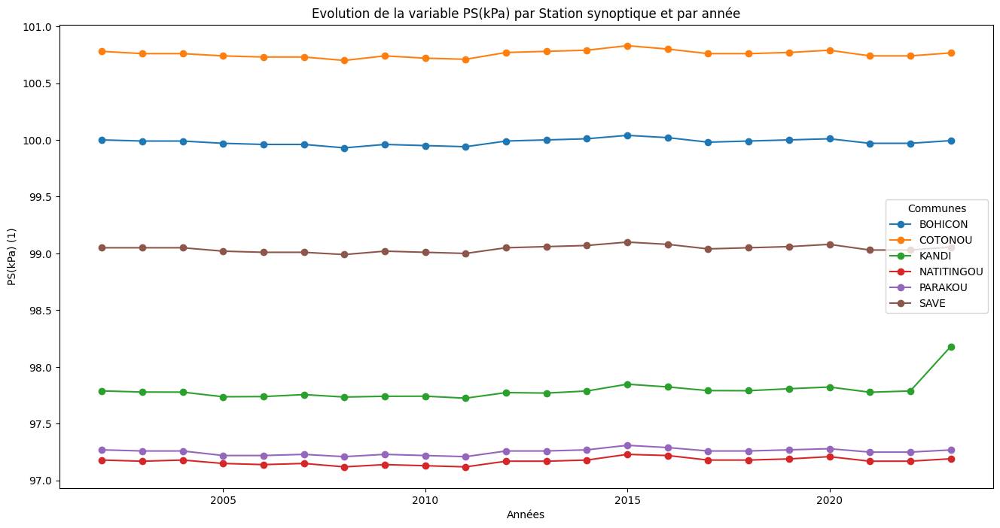

<Figure size 2000x1200 with 0 Axes>

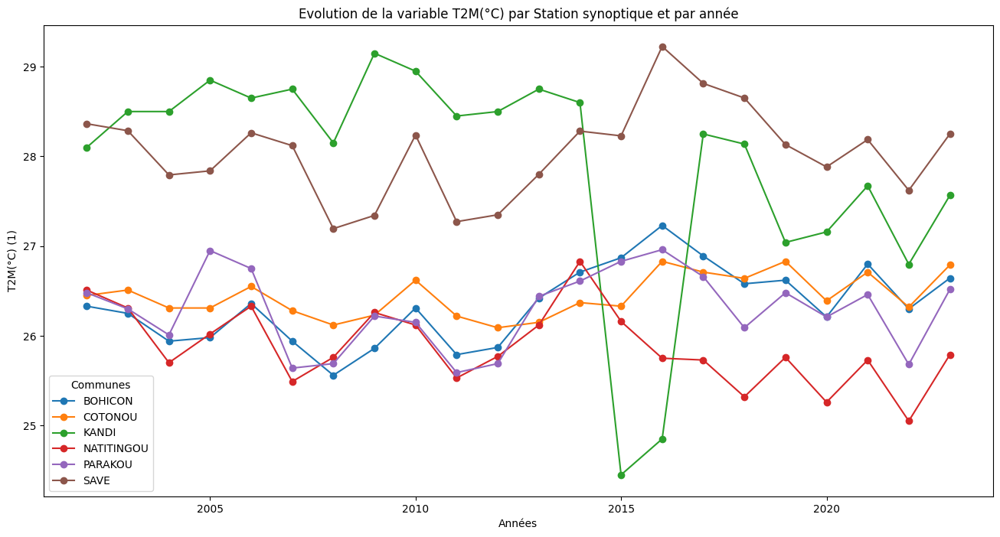

<Figure size 2000x1200 with 0 Axes>

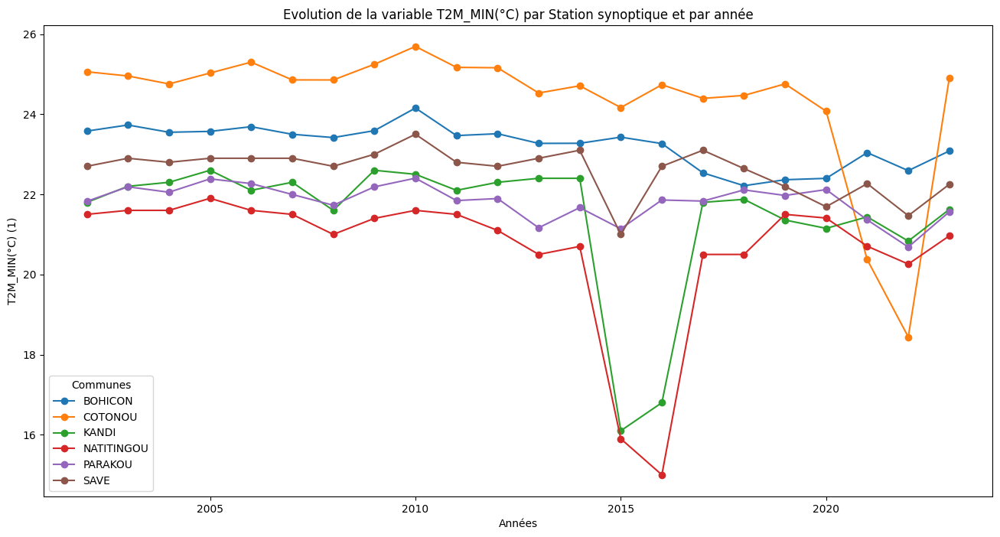

<Figure size 2000x1200 with 0 Axes>

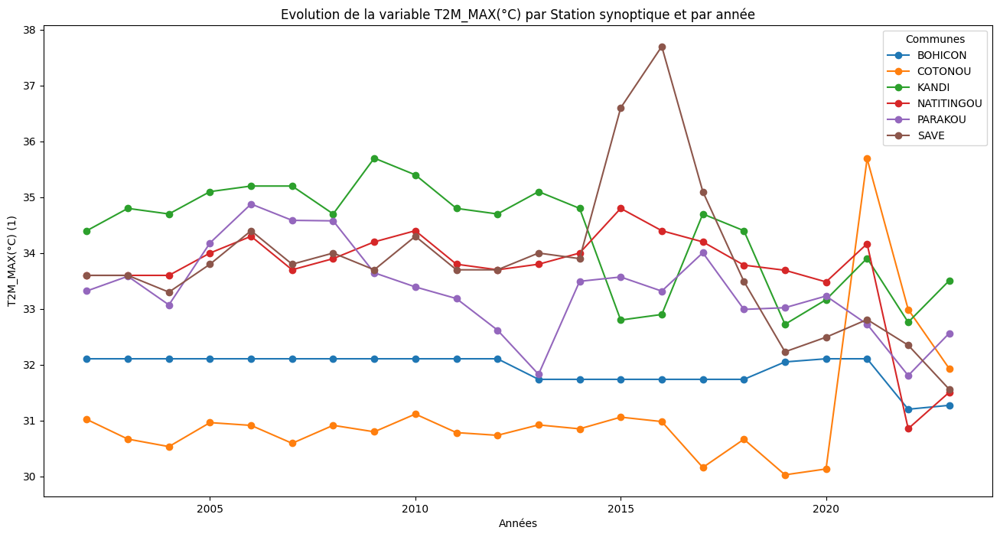

<Figure size 2000x1200 with 0 Axes>

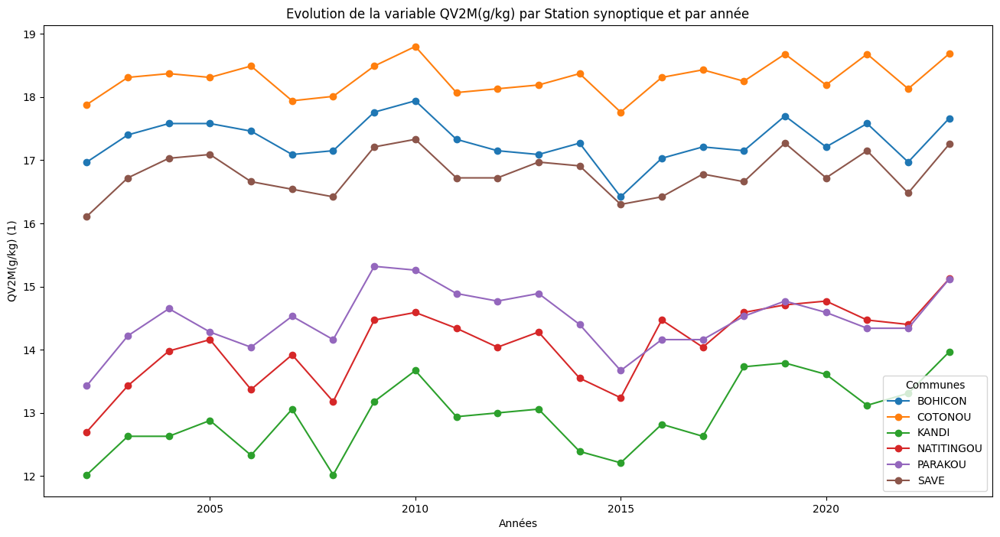

<Figure size 2000x1200 with 0 Axes>

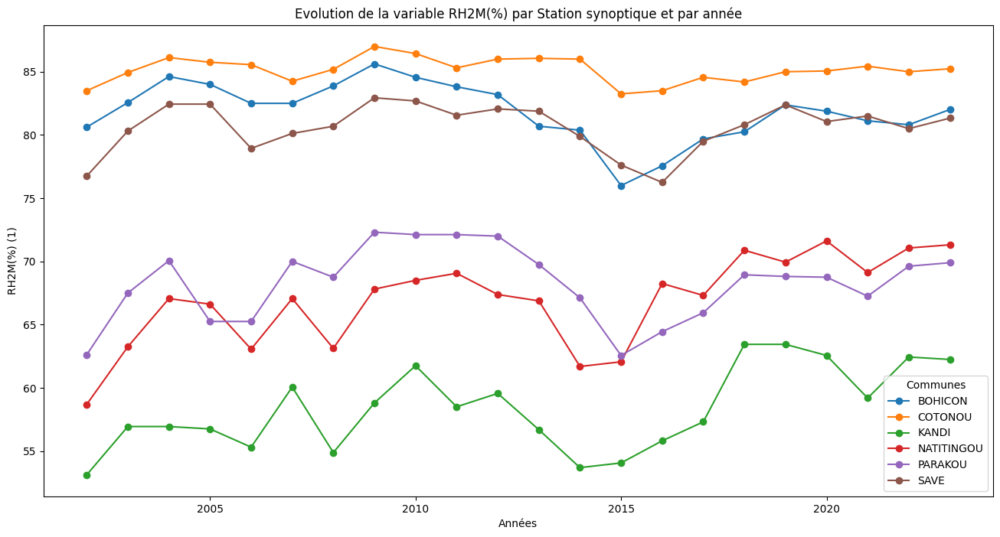

<Figure size 2000x1200 with 0 Axes>

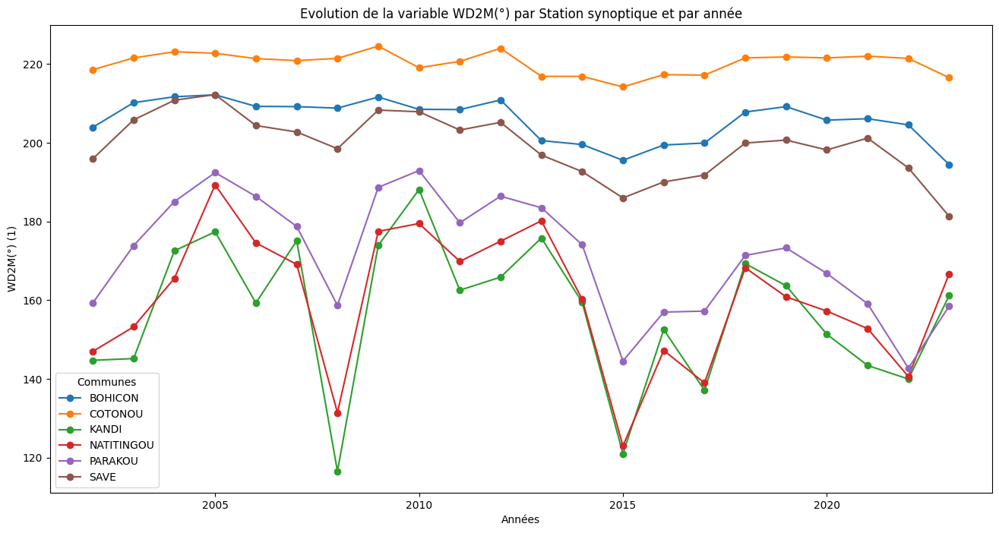

<Figure size 2000x1200 with 0 Axes>

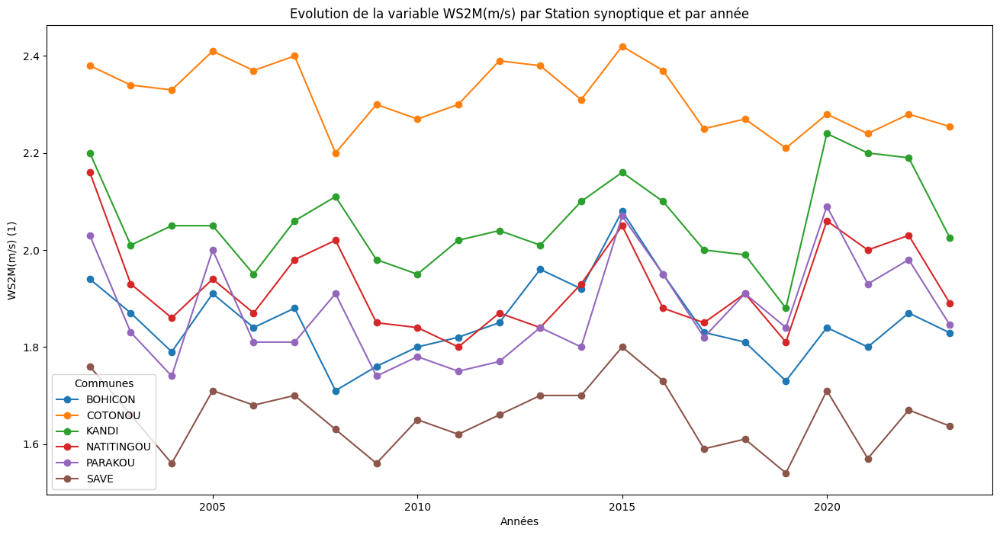

<Figure size 2000x1200 with 0 Axes>

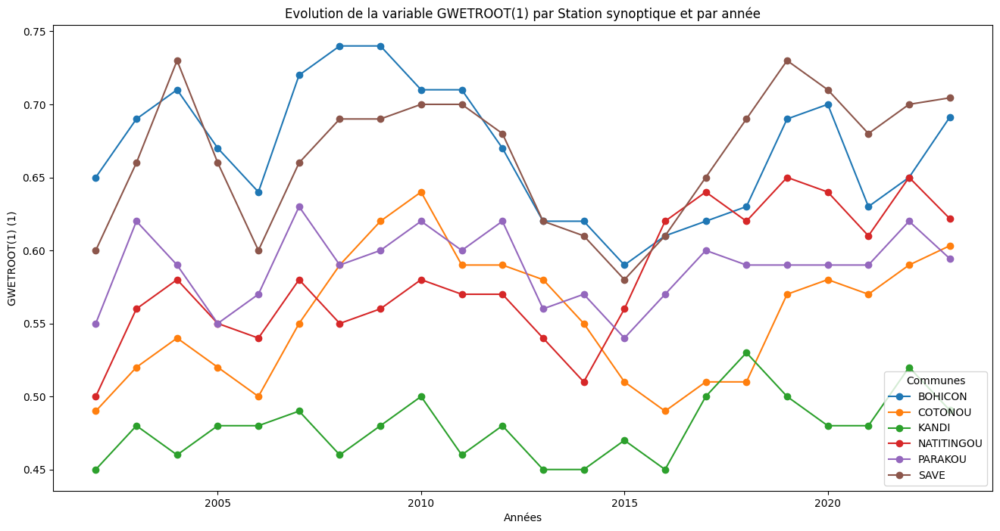

<Figure size 2000x1200 with 0 Axes>

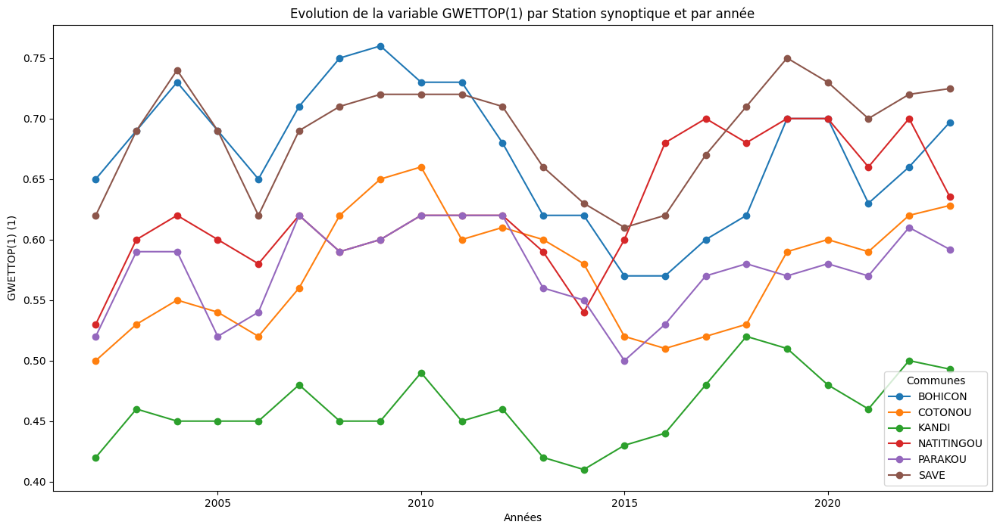

In [ ]:
# Group the data by department and year
grouped_data = df_agroclimat[df_agroclimat['Communes'].isin(['KANDI', 'NATITINGOU', 'PARAKOU', 'BOHICON', 'SAVE', 'COTONOU'])].groupby(['Annees', 'Communes'])[['PRECTOTCORR(mm/an)', 'PS(kPa)',	'T2M(°C)',	'T2M_MIN(°C)',	'T2M_MAX(°C)',	'QV2M(g/kg)',	'RH2M(%)',	'WD2M(°)',	'WS2M(m/s)',	'GWETROOT(1)',	'GWETTOP(1)']].mean()

# Unstack the data to create a line chart for each variable
for variable in ['PRECTOTCORR(mm/an)', 'PS(kPa)',	'T2M(°C)',	'T2M_MIN(°C)',	'T2M_MAX(°C)',	'QV2M(g/kg)',	'RH2M(%)',	'WD2M(°)',	'WS2M(m/s)',	'GWETROOT(1)',	'GWETTOP(1)']:
    plt.figure(figsize=(20, 12))
    grouped_data[variable].unstack().plot(kind='line', figsize=(16, 8), marker='o')
    plt.title(f'Evolution de la variable {variable} par Station synoptique et par année')
    plt.xlabel('Années')
    plt.ylabel(f'{variable} (1)')
    plt.show()

Précipitation


<Figure size 2000x1200 with 0 Axes>

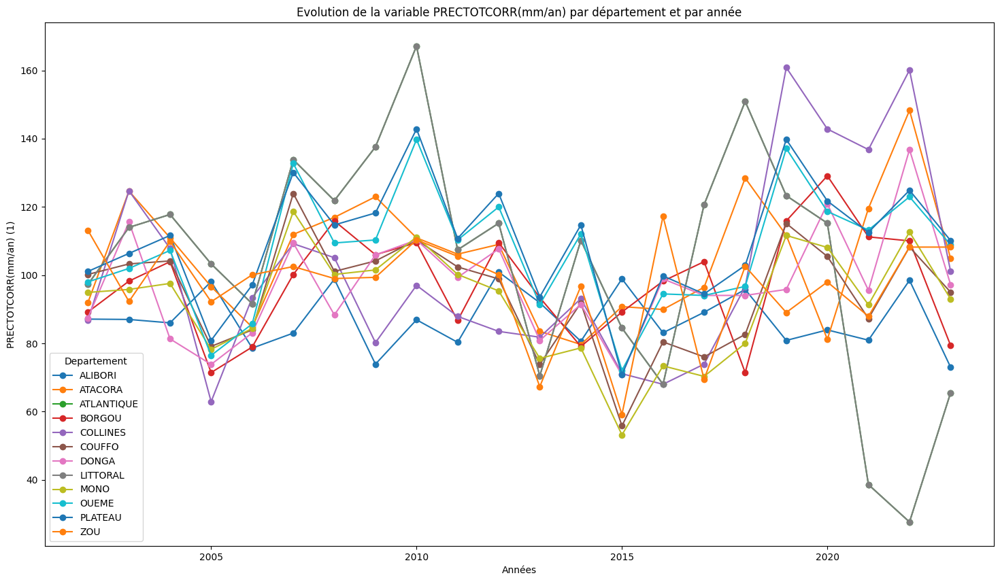

Humidité du sol


<Figure size 2000x1200 with 0 Axes>

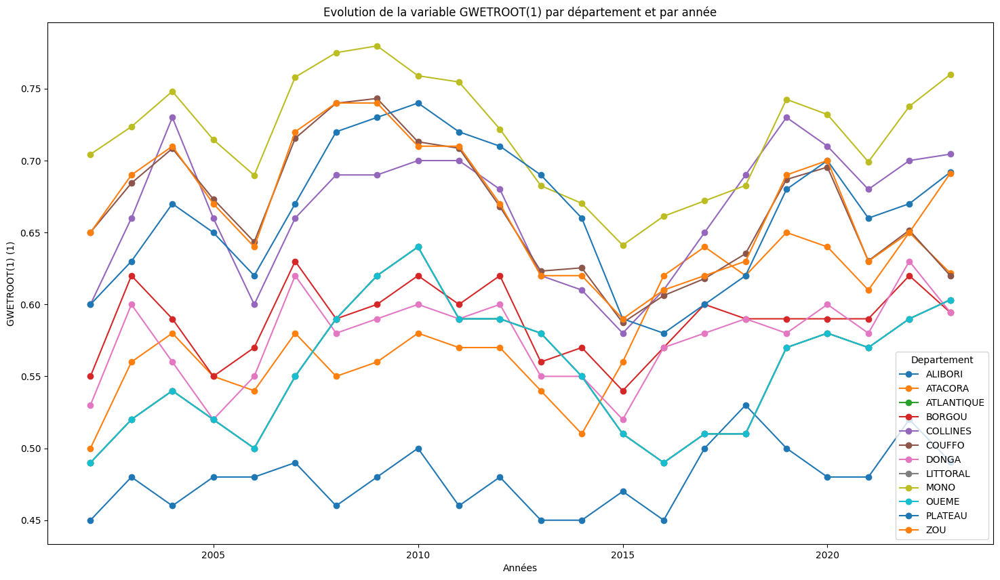

<Figure size 2000x1200 with 0 Axes>

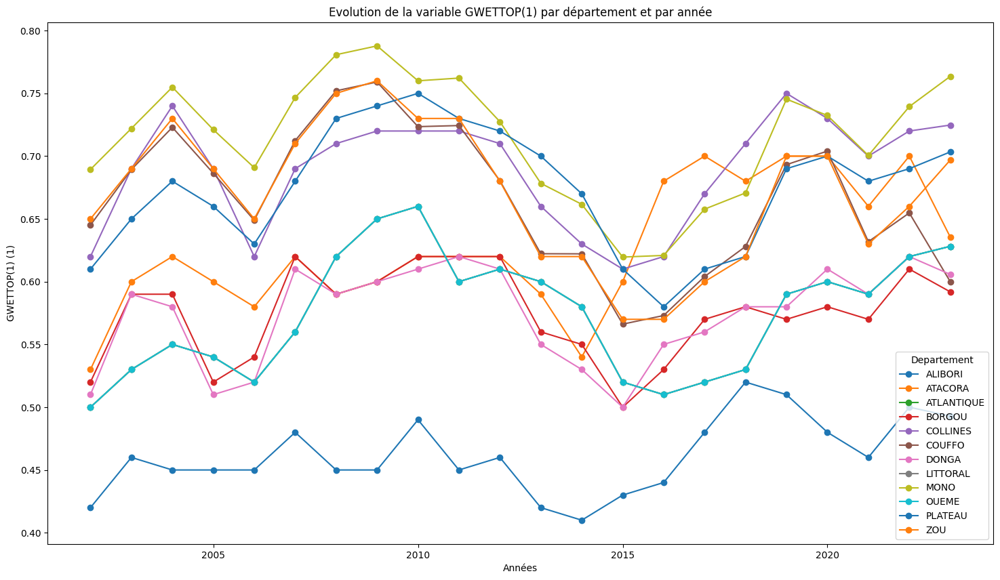

Humidité relative et Spécifique


<Figure size 2000x1200 with 0 Axes>

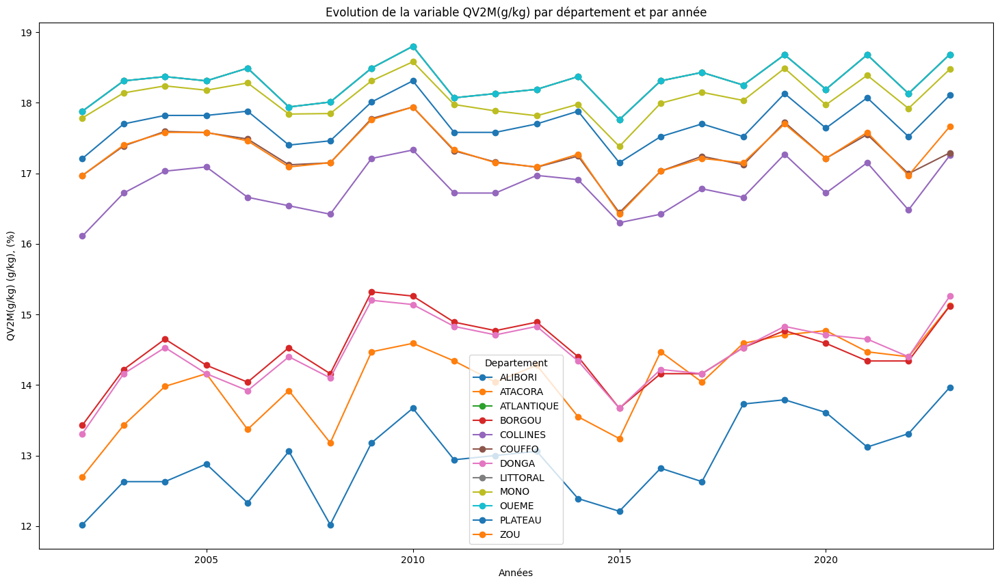

<Figure size 2000x1200 with 0 Axes>

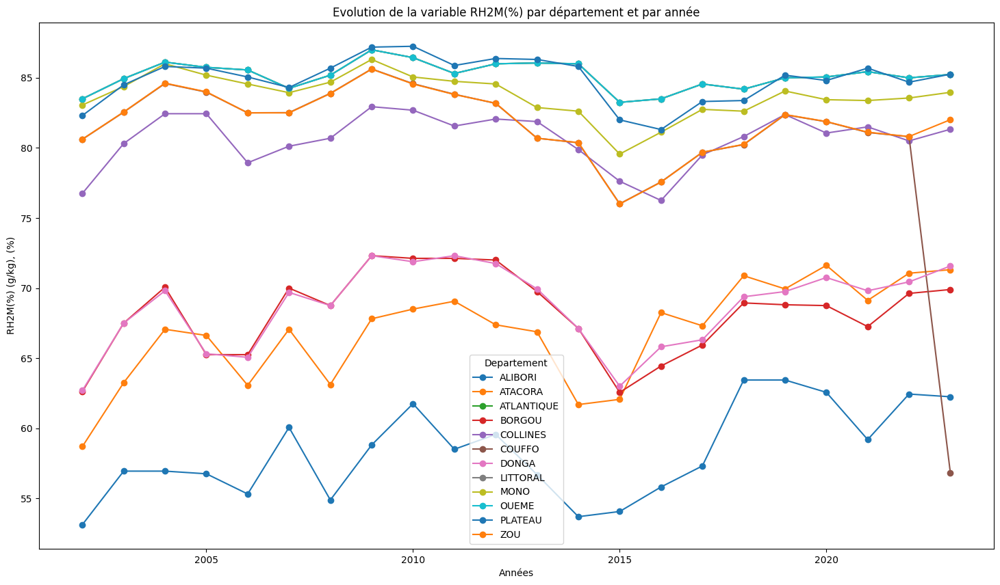

Vitesse du vent


<Figure size 2000x1200 with 0 Axes>

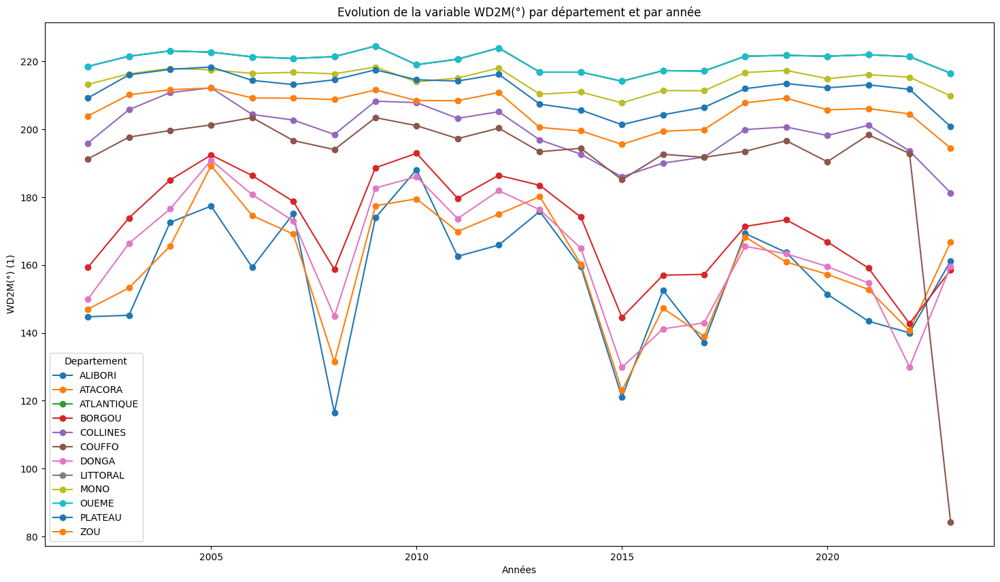

<Figure size 2000x1200 with 0 Axes>

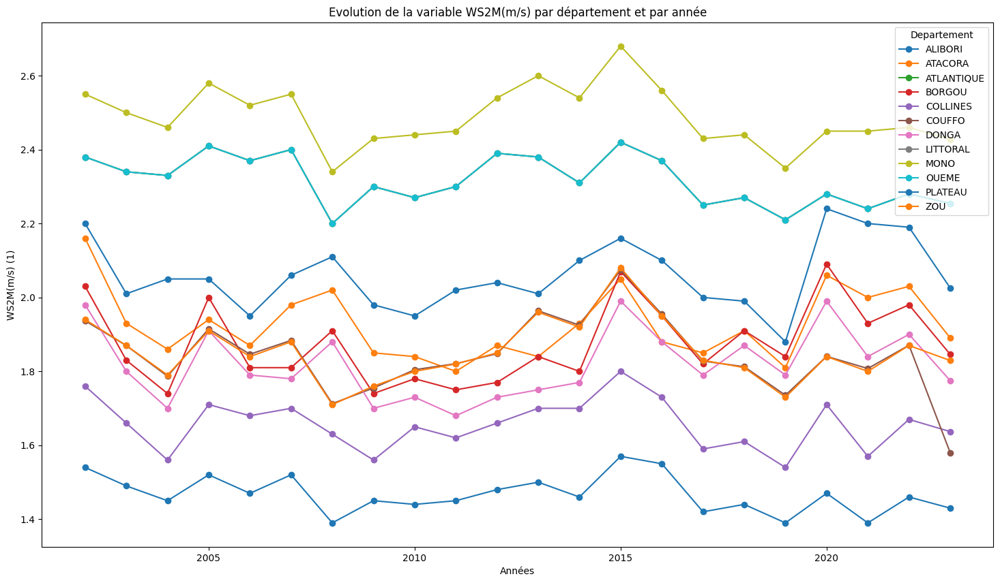

Les température Min et Max


<Figure size 2000x1200 with 0 Axes>

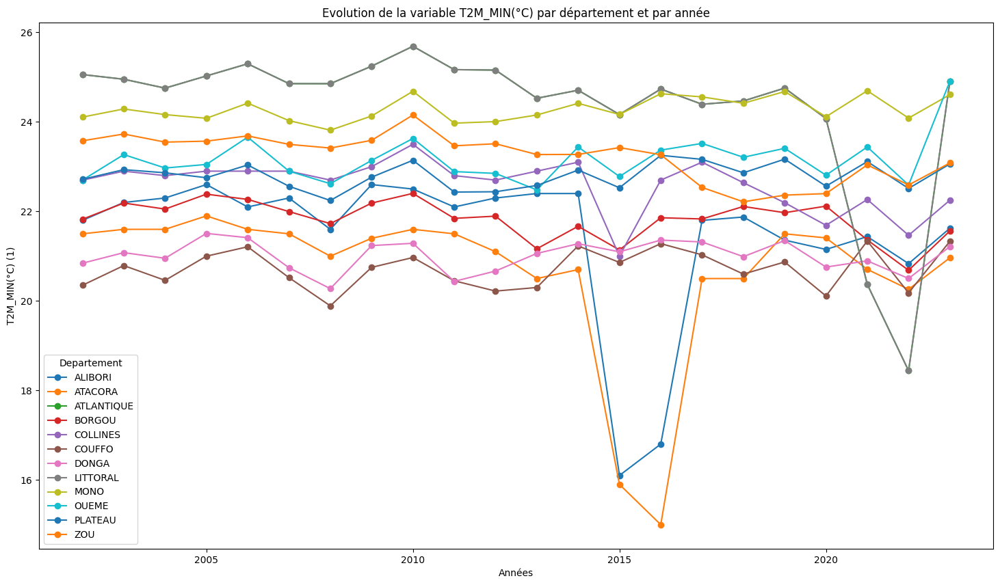

<Figure size 2000x1200 with 0 Axes>

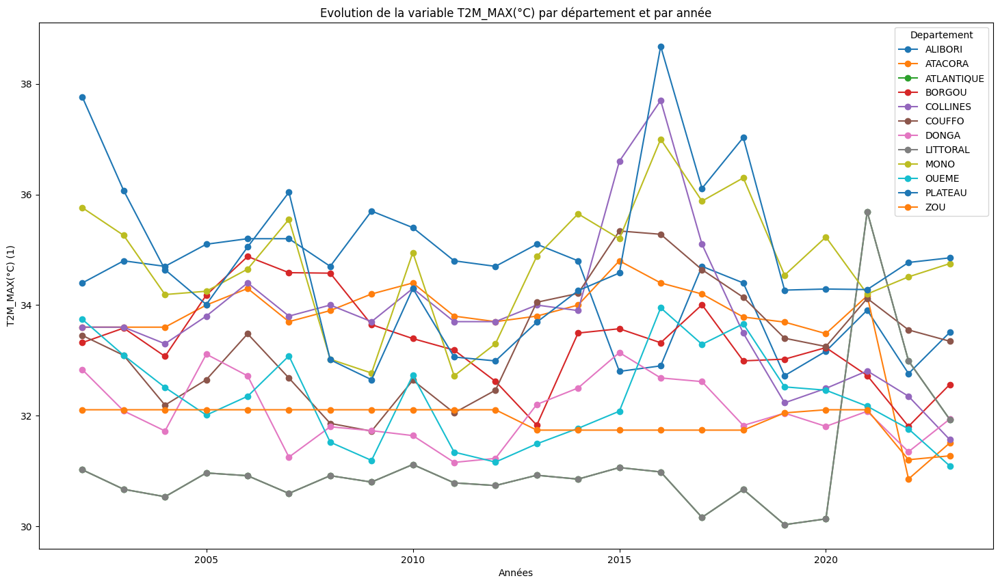

La température normale et Pression atmosphérique


<Figure size 2000x1200 with 0 Axes>

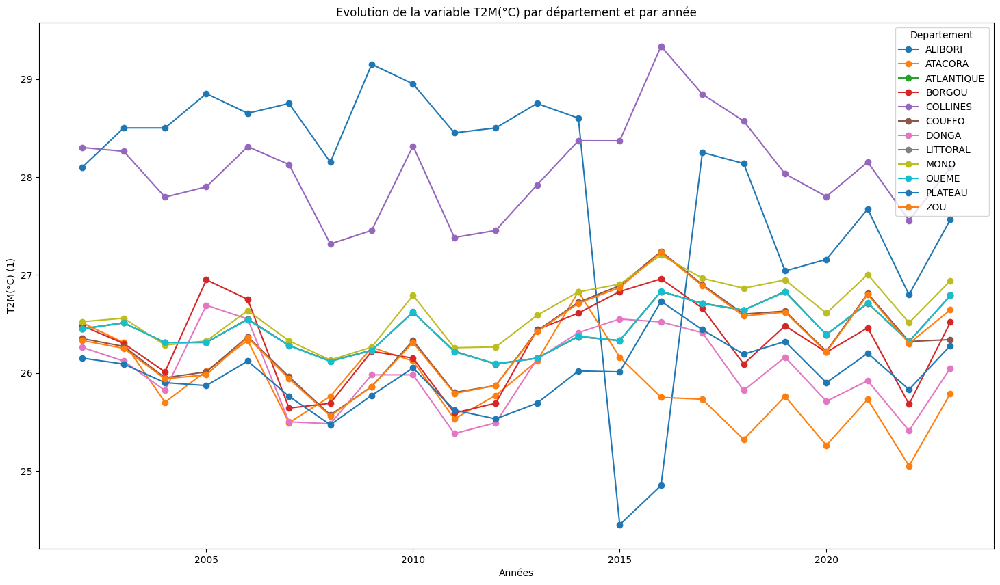

<Figure size 2000x1200 with 0 Axes>

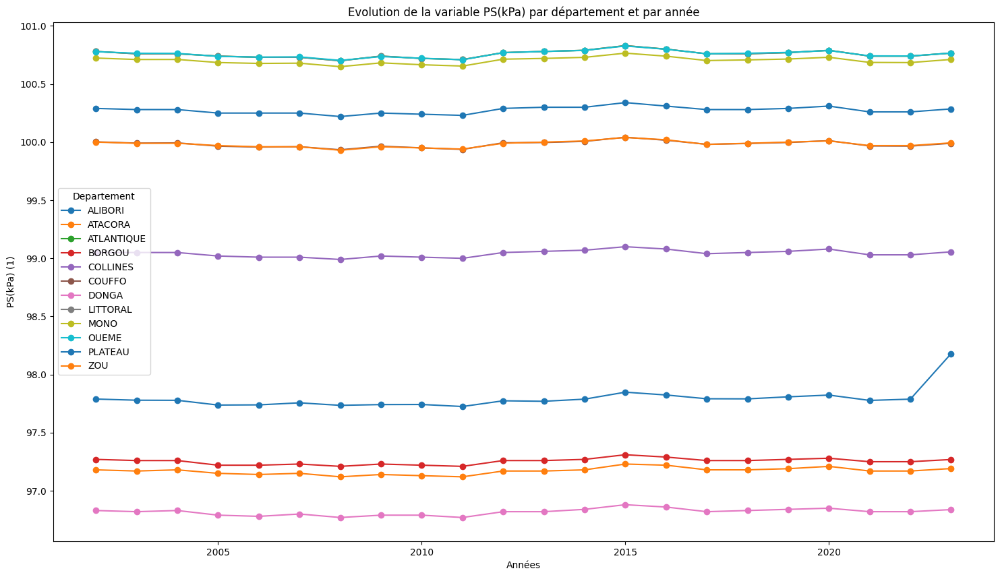

In [ ]:
print('Précipitation')
# Group the data by department and year
grouped_data = df_agroclimat.groupby(['Annees', 'Departement'])[['PRECTOTCORR(mm/an)']].mean()

# Unstack the data to create a line chart for each variable
for variable in ['PRECTOTCORR(mm/an)']:
    plt.figure(figsize=(20, 12))
    grouped_data[variable].unstack().plot(kind='line', figsize=(18, 10), marker='o')
    plt.title(f'Evolution de la variable {variable} par département et par année')
    plt.xlabel('Années')
    plt.ylabel(f'{variable} (1)')
    plt.show()

print('Humidité du sol')
# Group the data by department and year
grouped_data = df_agroclimat.groupby(['Annees', 'Departement'])[['GWETROOT(1)','GWETTOP(1)']].mean()

# Unstack the data to create a line chart for each variable
for variable in ['GWETROOT(1)','GWETTOP(1)']:
    plt.figure(figsize=(20, 12))
    grouped_data[variable].unstack().plot(kind='line', figsize=(18, 10), marker='o')
    plt.title(f'Evolution de la variable {variable} par département et par année')
    plt.xlabel('Années')
    plt.ylabel(f'{variable} (1)')
    plt.show()

print('Humidité relative et Spécifique')
# Group the data by department and year
grouped_data = df_agroclimat.groupby(['Annees', 'Departement'])[['QV2M(g/kg)','RH2M(%)']].mean()

# Unstack the data to create a line chart for each variable
for variable in ['QV2M(g/kg)','RH2M(%)']:
    plt.figure(figsize=(20, 12))
    grouped_data[variable].unstack().plot(kind='line', figsize=(18, 10), marker='o')
    plt.title(f'Evolution de la variable {variable} par département et par année')
    plt.xlabel('Années')
    plt.ylabel(f'{variable} (g/kg), (%)')
    plt.show()

print('Vitesse du vent')
# Group the data by department and year
grouped_data = df_agroclimat.groupby(['Annees', 'Departement'])[['WD2M(°)', 'WS2M(m/s)']].mean()

# Unstack the data to create a line chart for each variable
for variable in ['WD2M(°)', 'WS2M(m/s)']:
    plt.figure(figsize=(20, 12))
    grouped_data[variable].unstack().plot(kind='line', figsize=(18, 10), marker='o')
    plt.title(f'Evolution de la variable {variable} par département et par année')
    plt.xlabel('Années')
    plt.ylabel(f'{variable} (1)')
    plt.show()

print('Les température Min et Max')
# Group the data by department and year
grouped_data = df_agroclimat.groupby(['Annees', 'Departement'])[['T2M_MIN(°C)',	'T2M_MAX(°C)']].mean()

# Unstack the data to create a line chart for each variable
for variable in ['T2M_MIN(°C)',	'T2M_MAX(°C)']:
    plt.figure(figsize=(20, 12))
    grouped_data[variable].unstack().plot(kind='line', figsize=(18, 10), marker='o')
    plt.title(f'Evolution de la variable {variable} par département et par année')
    plt.xlabel('Années')
    plt.ylabel(f'{variable} (1)')
    plt.show()

print('La température normale et Pression atmosphérique')
# Group the data by department and year
grouped_data = df_agroclimat.groupby(['Annees', 'Departement'])[['T2M(°C)', 'PS(kPa)']].mean()

# Unstack the data to create a line chart for each variable
for variable in ['T2M(°C)', 'PS(kPa)']:
    plt.figure(figsize=(20, 12))
    grouped_data[variable].unstack().plot(kind='line', figsize=(18, 10), marker='o')
    plt.title(f'Evolution de la variable {variable} par département et par année')
    plt.xlabel('Années')
    plt.ylabel(f'{variable} (1)')
    plt.show()

In [ ]:
# Group the data by department and commune, then calculate the mean of climatic factors
df_climat_par_commune = df_agroclimat.groupby(['Departement', 'Communes'])[['PRECTOTCORR(mm/an)', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)']].mean().reset_index()

# Display the result
df_climat_par_commune

,Departement,Communes,PRECTOTCORR(mm/an),PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1)
0,ALIBORI,BANIKOARA,87.137100,97.794977,27.899374,21.461161,34.337586,12.955890,58.345377,157.198993,2.060079,0.479023,0.461412
1,ALIBORI,GOGOUNOU,87.137100,97.794977,27.899374,21.461161,34.337586,12.955890,58.345377,157.198993,2.060079,0.479023,0.461412
2,ALIBORI,KANDI,87.137100,97.794977,27.899374,21.461161,34.337586,12.955890,58.345377,157.198993,2.060079,0.479023,0.461412
3,ALIBORI,KARIMAMA,87.137100,97.794977,27.899374,21.461161,34.337586,12.955890,58.345377,157.198993,2.060079,0.479023,0.461412
4,ALIBORI,MALANVILLE,87.137100,97.794977,27.899374,21.461161,34.337586,12.955890,58.345377,157.198993,2.060079,0.479023,0.461412
...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,ZOU,DJIDJA,96.862253,99.982906,26.336707,23.240430,31.925164,17.305141,81.856718,205.829001,1.854168,0.668456,0.671090
73,ZOU,OUINHI,96.862253,99.982906,26.336707,23.240430,31.925164,17.305141,81.856718,205.829001,1.854168,0.668456,0.671090
74,ZOU,ZA-KPOTA,96.862253,99.982906,26.336707,23.240430,31.925164,17.305141,81.856718,205.829001,1.854168,0.668456,0.671090
75,ZOU,ZAGNANADO,96.862253,99.982906,26.336707,23.240430,31.925164,17.305141,81.856718,205.829001,1.854168,0.668456,0.671090


<ipython-input-52-43ec4176402e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)


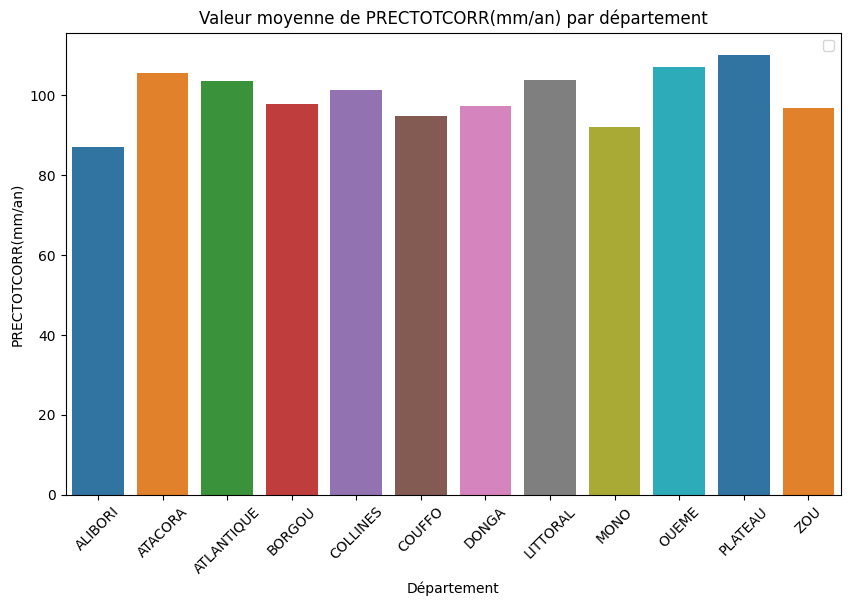

<ipython-input-52-43ec4176402e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)


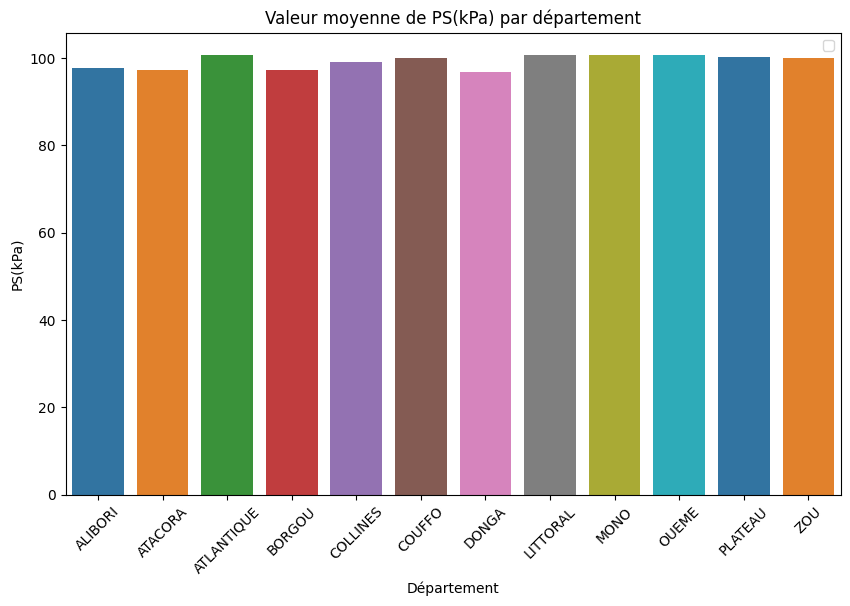

<ipython-input-52-43ec4176402e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)


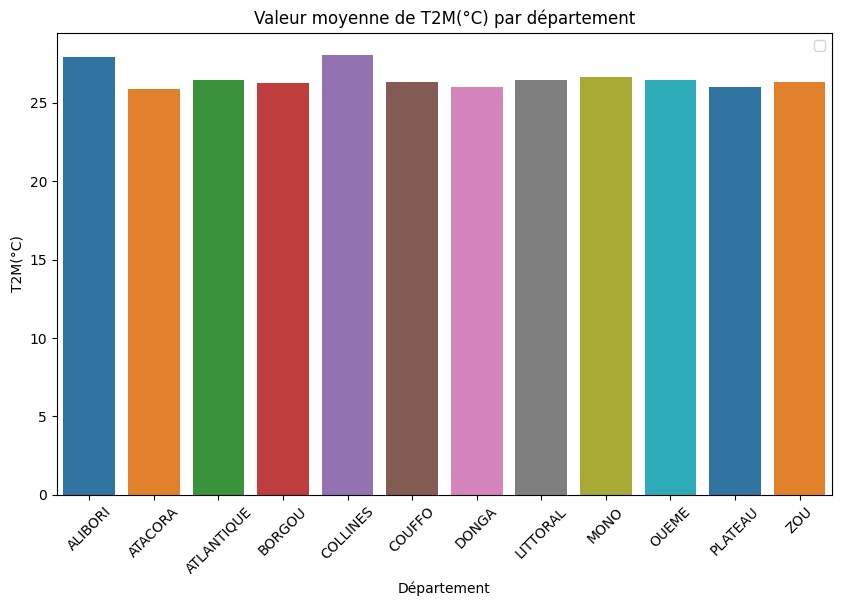

<ipython-input-52-43ec4176402e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)


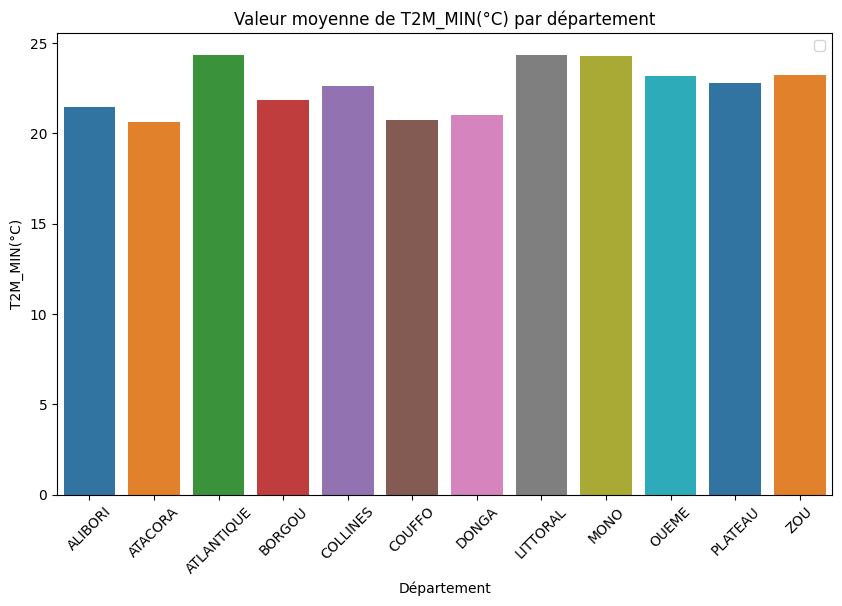

<ipython-input-52-43ec4176402e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)


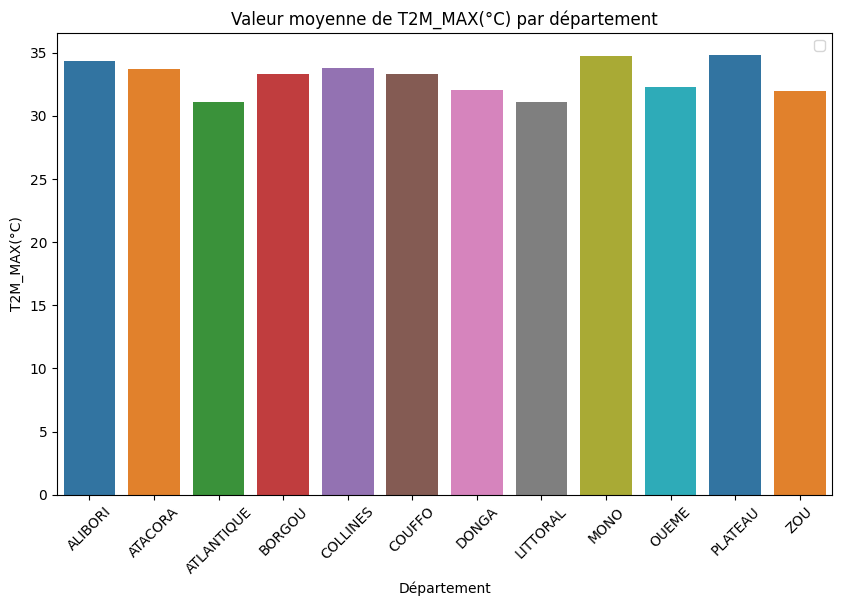

<ipython-input-52-43ec4176402e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)


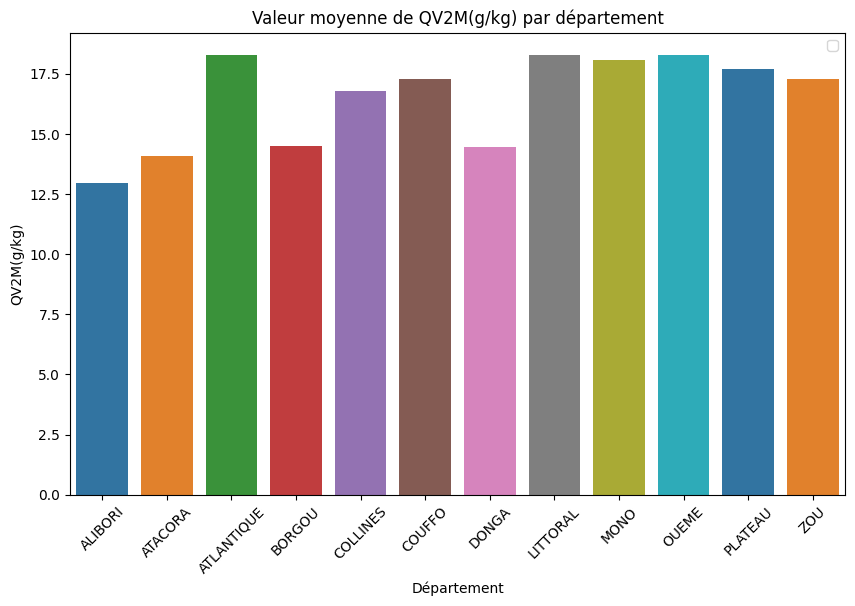

<ipython-input-52-43ec4176402e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)


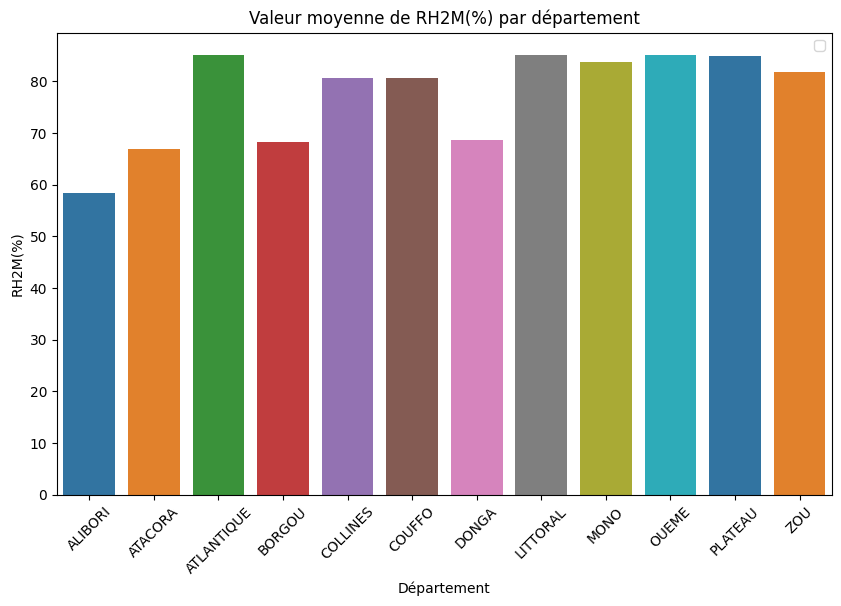

<ipython-input-52-43ec4176402e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)


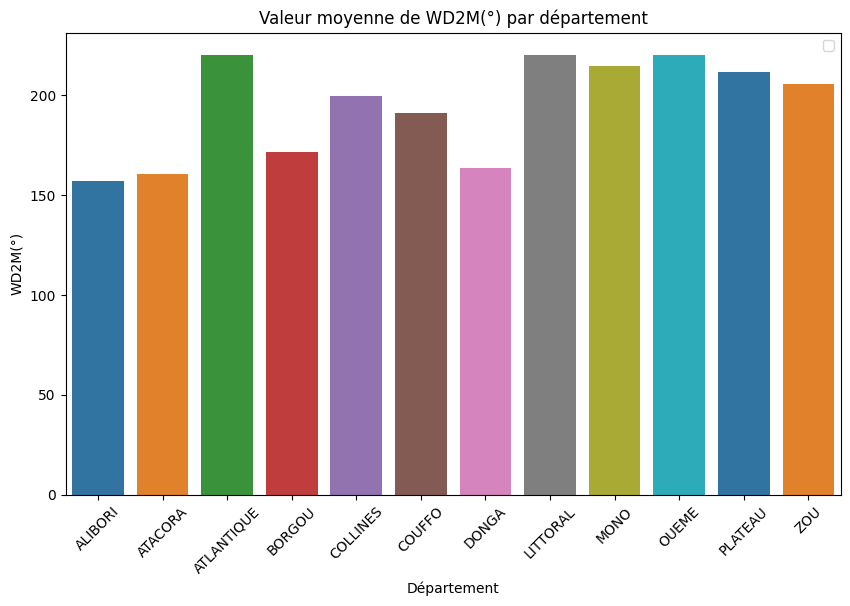

<ipython-input-52-43ec4176402e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)


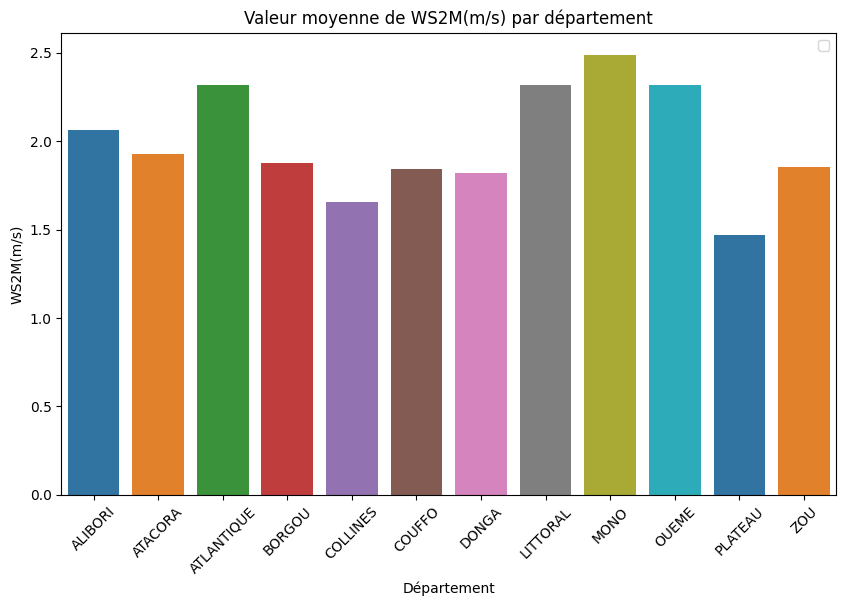

<ipython-input-52-43ec4176402e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)


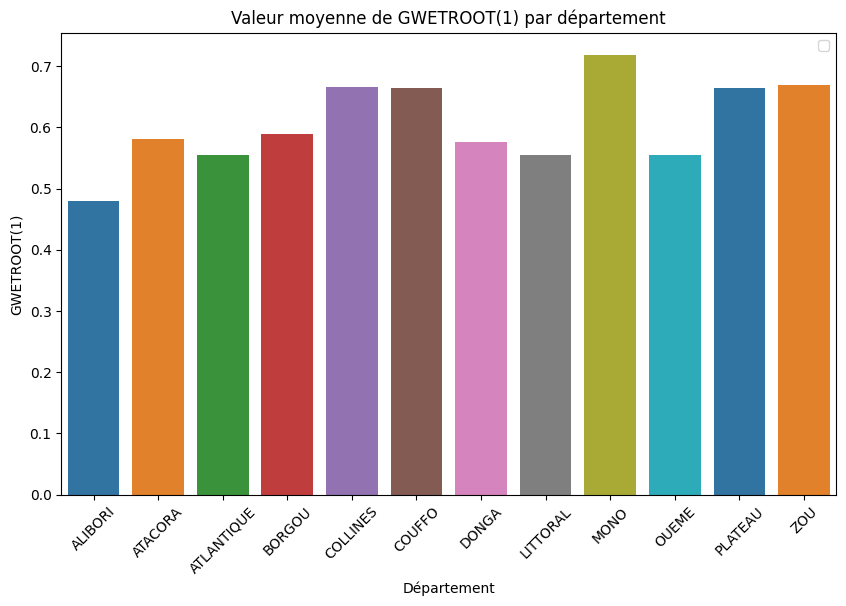

<ipython-input-52-43ec4176402e>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
<ipython-input-52-43ec4176402e>:8: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)


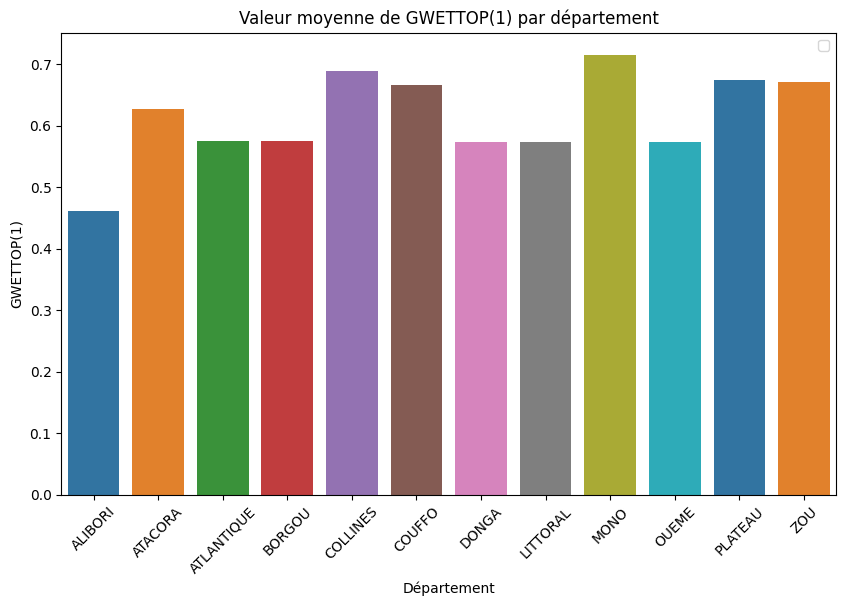

In [ ]:
import matplotlib.pyplot as plt
# Group the data by department and calculate the mean of climatic factors
df_climat_par_departement = df_agroclimat.groupby('Departement')[['PRECTOTCORR(mm/an)', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)']].mean().reset_index()

# Create a bar plot for each climatic factor
for column in ['PRECTOTCORR(mm/an)', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)']:
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Departement', y=column, data=df_climat_par_departement, palette=colors)
    plt.title(f'Valeur moyenne de {column} par département')
    plt.xlabel('Département')
    plt.ylabel(column)
    plt.legend()
    plt.xticks(rotation=45)
    plt.show()

<ipython-input-53-7dbc295ca224>:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)
<ipython-input-53-7dbc295ca224>:10: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)


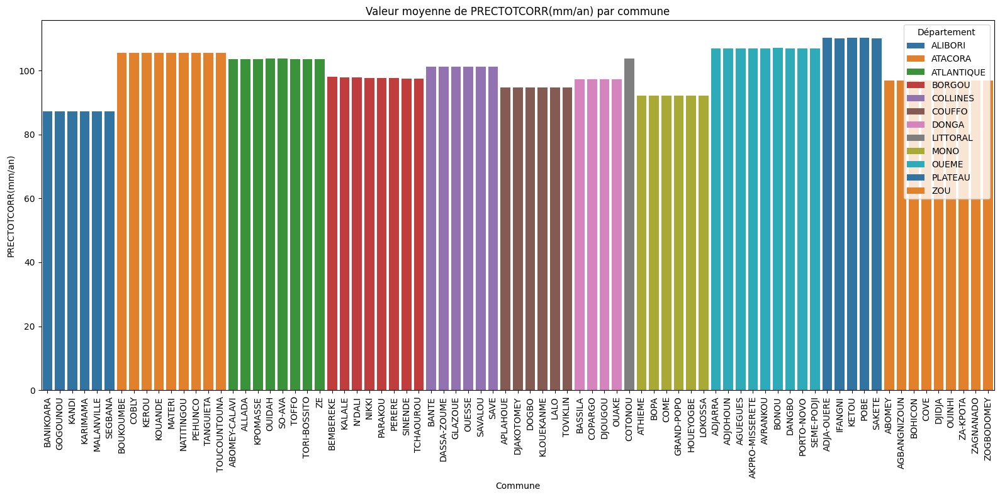

<ipython-input-53-7dbc295ca224>:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)
<ipython-input-53-7dbc295ca224>:10: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)


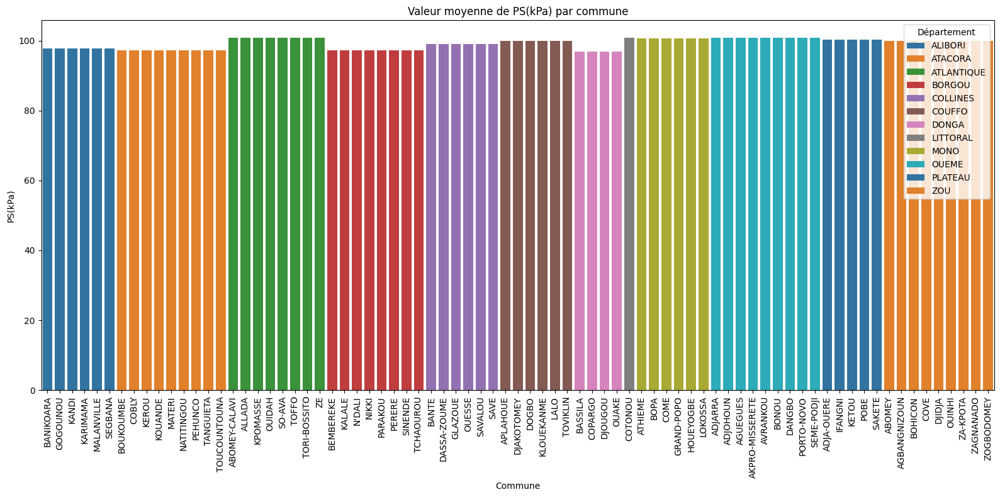

<ipython-input-53-7dbc295ca224>:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)
<ipython-input-53-7dbc295ca224>:10: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)


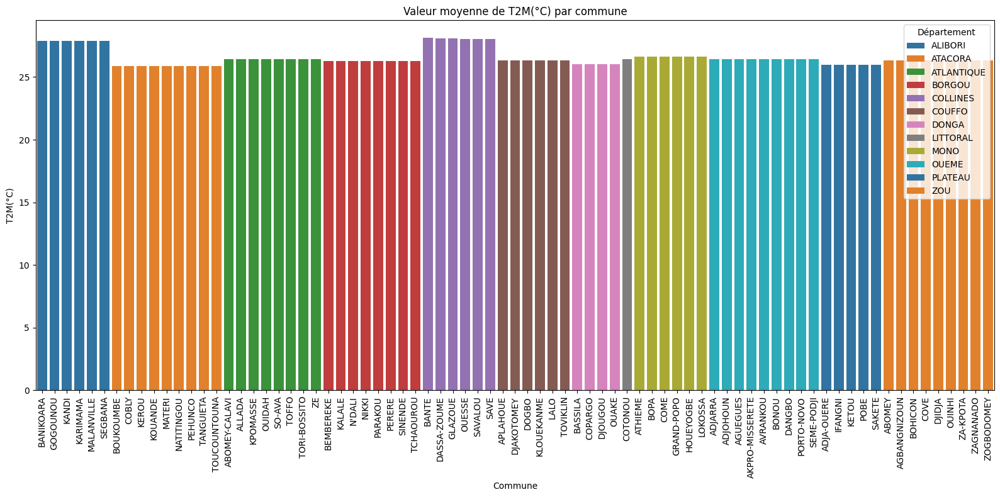

<ipython-input-53-7dbc295ca224>:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)
<ipython-input-53-7dbc295ca224>:10: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)


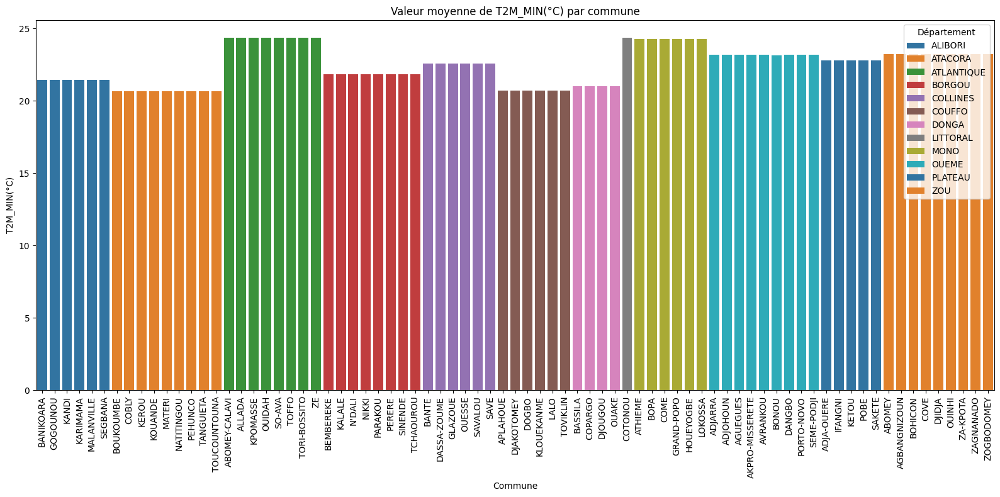

<ipython-input-53-7dbc295ca224>:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)
<ipython-input-53-7dbc295ca224>:10: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)


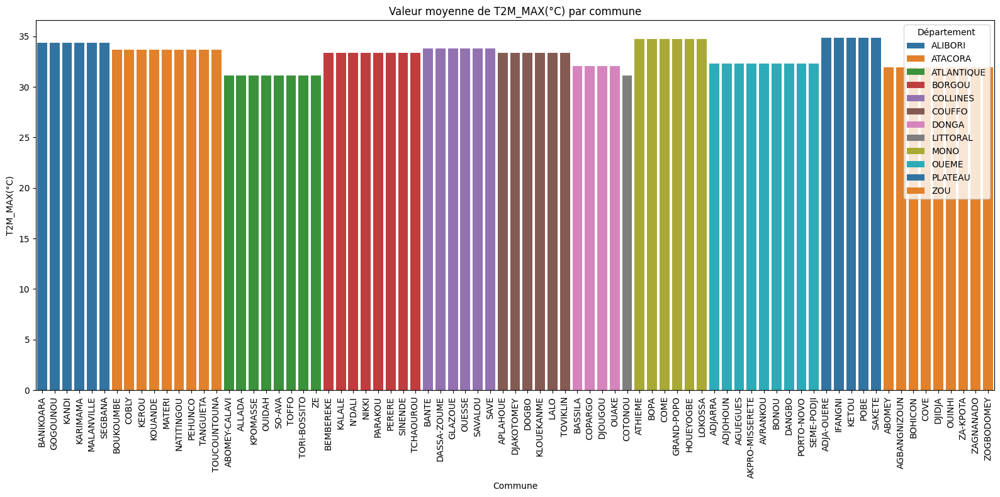

<ipython-input-53-7dbc295ca224>:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)
<ipython-input-53-7dbc295ca224>:10: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)


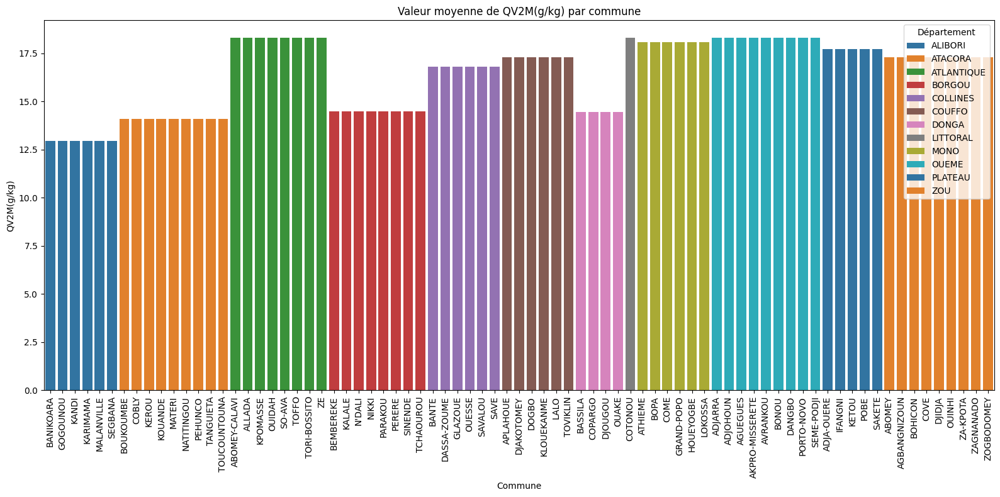

<ipython-input-53-7dbc295ca224>:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)
<ipython-input-53-7dbc295ca224>:10: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)


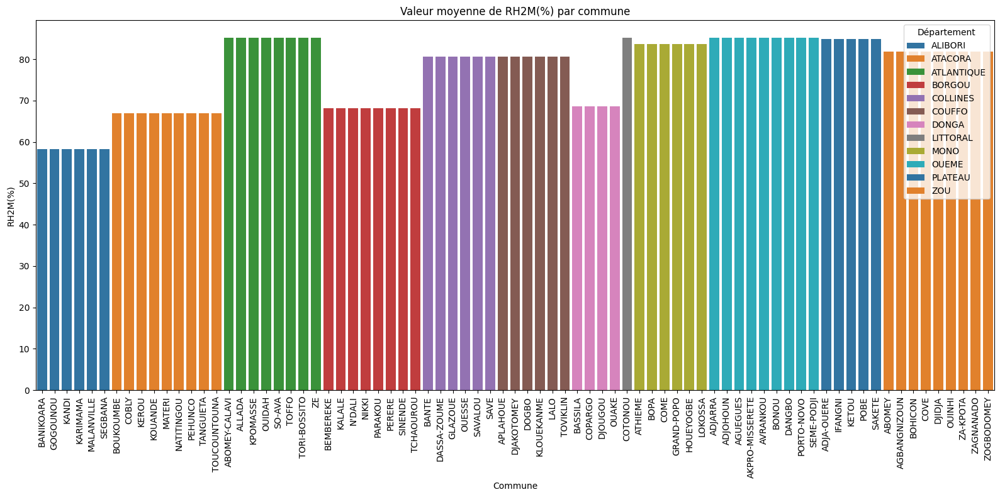

<ipython-input-53-7dbc295ca224>:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)
<ipython-input-53-7dbc295ca224>:10: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)


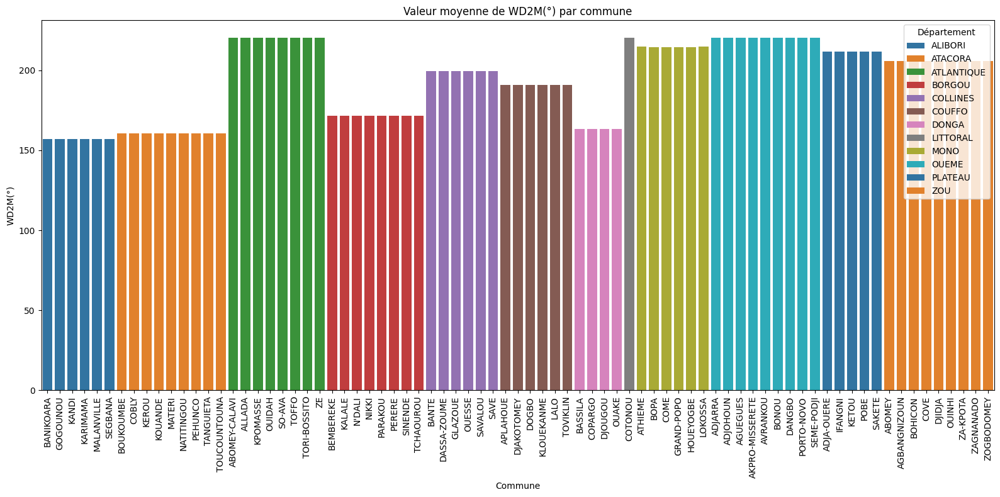

<ipython-input-53-7dbc295ca224>:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)
<ipython-input-53-7dbc295ca224>:10: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)


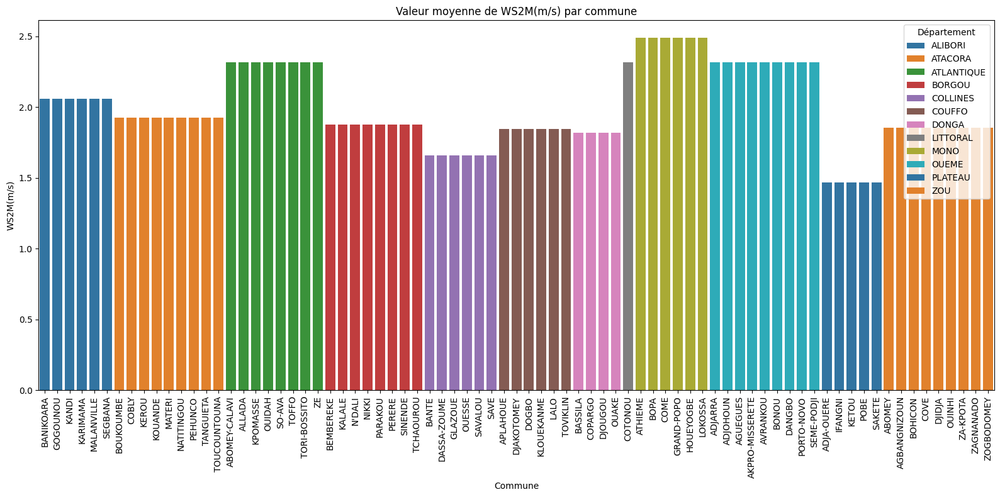

<ipython-input-53-7dbc295ca224>:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)
<ipython-input-53-7dbc295ca224>:10: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)


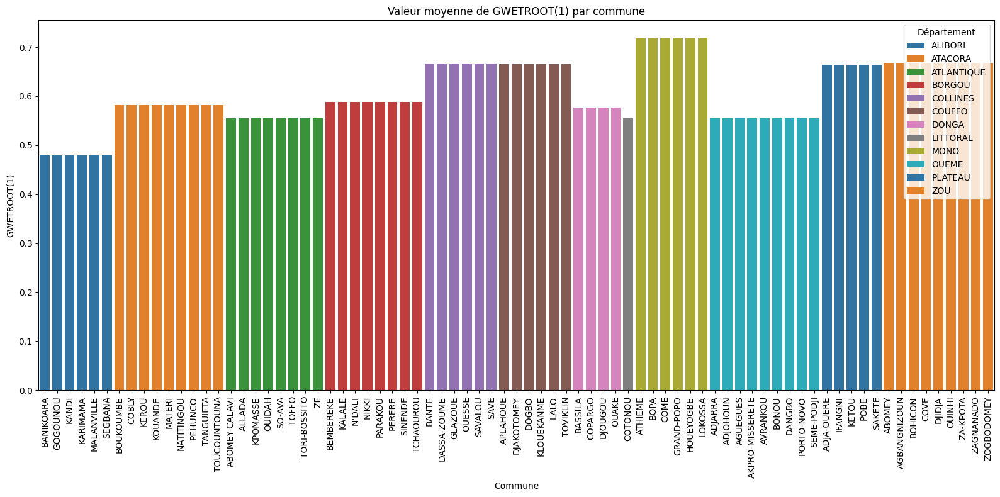

<ipython-input-53-7dbc295ca224>:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)
<ipython-input-53-7dbc295ca224>:10: UserWarning: 
The palette list has fewer values (10) than needed (12) and will cycle, which may produce an uninterpretable plot.
  sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)


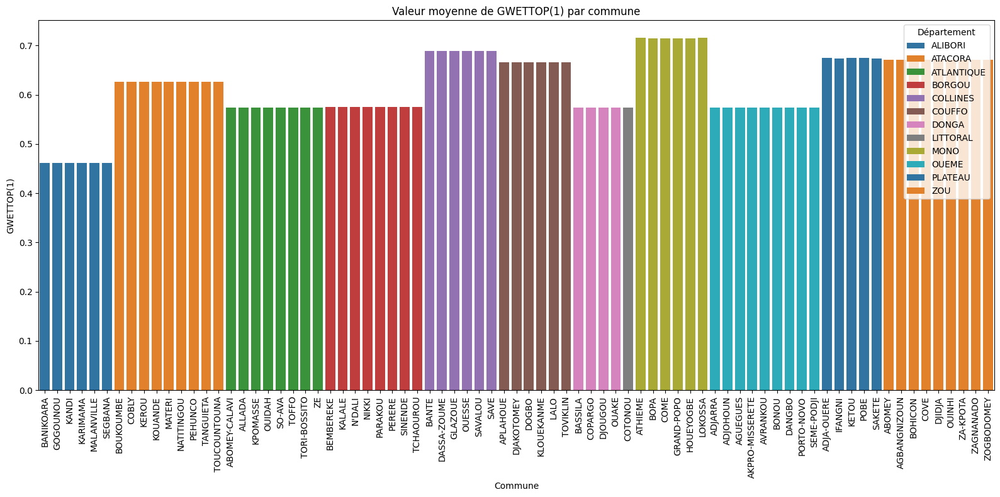

In [ ]:
##Visualiser la répartition des facteurs climatiques par communes

import matplotlib.pyplot as plt
# Group the data by department and commune, then calculate the mean of climatic factors
df_climat_par_commune = df_agroclimat.groupby(['Departement', 'Communes'])[['PRECTOTCORR(mm/an)', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)']].mean().reset_index()

# Create a bar plot for each climatic factor, grouped by commune
for column in ['PRECTOTCORR(mm/an)', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)']:
    plt.figure(figsize=(16, 8))  # Adjust figure size as needed
    sns.barplot(x='Communes', y=column, hue='Departement', data=df_climat_par_commune, palette=colors)
    plt.title(f'Valeur moyenne de {column} par commune')
    plt.xlabel('Commune')
    plt.ylabel(column)
    plt.xticks(rotation=90)  # Rotate x-axis labels for readability
    plt.legend(title='Département', loc='upper right')
    plt.tight_layout()  # Adjust layout to prevent overlapping
    plt.show()

In [ ]:
# Group the data by department and year
grouped_data = df_agroclimat.groupby(['Annees', 'Communes'])[['PRECTOTCORR(mm/an)']].mean()

# Unstack the data to create a line chart for each variable
for variable in ['PRECTOTCORR(mm/an)']:
    plt.figure(figsize=(20, 12))
    grouped_data[variable].unstack().plot(kind='line', figsize=(18, 10), marker='o')
    plt.title(f'Evolution de la variable {variable} par département et par année')
    plt.xlabel('Années')
    plt.ylabel(f'{variable} (1)')
    plt.show()

# Impact, Relation, Evolution ou/et Influence de la production agricole en fonction des facteurs climatiques

In [ ]:
df_agroclimat.head()

,Produit,Departement,Communes,Sup(ha),Rend(kg/ha),Prod(T),Annees,PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1),PRECTOTCORR(mm/an)
0,Maïs,BORGOU,BEMBEREKE,9509.0,923.756441,8784.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
1,Maïs,BORGOU,KALALE,18300.0,1107.595628,20269.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
2,Maïs,BORGOU,N'DALI,7764.0,1467.284905,11392.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
3,Maïs,BORGOU,NIKKI,15089.0,1267.413347,19124.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
4,Maïs,BORGOU,PARAKOU,7495.0,1102.735157,8265.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175


Le cotonnier demande de la chaleur, de 25 °C à 35 °C pendant 150 jours, beaucoup de soleil et de l'eau surtout pendant la floraison.

In [ ]:
# Group the data by product
grouped_data = df_agroclimat.groupby('Produit')

print('Pession atmosphérique vs Production')
# Loop through each product and create a scatter plot of temperature vs production
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  plt.scatter(data['PS(kPa)'], data['Prod(T)'], alpha=0.5, color='purple')
  plt.xlabel('PS(kPa) Pression atmosphérique')
  plt.ylabel('Production (T)')
  plt.title(f'Relation entre la Pession atmosphérique et la production de {product}')
  plt.grid(True)
  plt.show()

In [ ]:
# Group the data by product
grouped_data = df_agroclimat.groupby('Produit')


print('Temperature normale T2M(°C) vs Production')
# Loop through each product and create a scatter plot of temperature vs production
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  plt.scatter(data['T2M(°C)'], data['Prod(T)'], alpha=0.5, cmap='coolwarm')
  plt.xlabel('Température (°C)')
  plt.ylabel('Production (T)')
  plt.title(f'Relation entre la température et la production de {product}')
  plt.grid(True)
  plt.show()

print('Temperature minimale T2M_MIN(°C) vs Production')
# Loop through each product and create a scatter plot of temperature vs production
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  plt.scatter(data['T2M_MIN(°C)'], data['Prod(T)'], alpha=0.5, color='teal')
  plt.xlabel('Température MIN (°C)')
  plt.ylabel('Production (T)')
  plt.title(f'Relation entre la température et la production de {product}')
  plt.grid(True)
  plt.show()

print('Temperature miximale T2M_MAX(°C) vs Production')
# Loop through each product and create a scatter plot of temperature vs production
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  plt.scatter(data['T2M_MAX(°C)'], data['Prod(T)'], alpha=0.5, color='orange')
  plt.xlabel('Température MAX (°C)')
  plt.ylabel('Production (T)')
  plt.title(f'Relation entre la température et la production de {product}')
  plt.grid(True)
  plt.show()

In [ ]:
# Group the data by product
grouped_data = df_agroclimat.groupby('Produit')


print('Humidité Spécifiques QV2M(g/kg) vs Production')
# Loop through each product and create a scatter plot of temperature vs production
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  plt.scatter(data['QV2M(g/kg)'], data['Prod(T)'], alpha=0.5, color='green')
  plt.xlabel('Humidité Spécifiques QV2M(g/kg)')
  plt.ylabel('Production (T)')
  plt.title(f'Relation entre Humidité Spécifiques et la production de {product}')
  plt.grid(True)
  plt.show()

print('Humidité Relative RH2M(%) vs Production')
# Loop through each product and create a scatter plot of temperature vs production
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  plt.scatter(data['RH2M(%)'], data['Prod(T)'], alpha=0.5, color='red')
  plt.xlabel('Humidité Relative RH2M(%)')
  plt.ylabel('Production (T)')
  plt.title(f'Relation entre Humidité Relative et la production de {product}')
  plt.grid(True)
  plt.show()

In [ ]:
# Group the data by product
grouped_data = df_agroclimat.groupby('Produit')


print('Direction du vent WD2M(°) vs Production')
# Loop through each product and create a scatter plot of temperature vs production
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  plt.scatter(data['WD2M(°)'], data['Prod(T)'], alpha=0.5, color='magenta')
  plt.xlabel('Direction du vent WD2M(°)')
  plt.ylabel('Production (T)')
  plt.title(f'Relation entre Direction du vent et la production de {product}')
  plt.grid(True)
  plt.show()

print('Vitesse du vent WS2M(m/s) vs Production')
# Loop through each product and create a scatter plot of temperature vs production
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  plt.scatter(data['WS2M(m/s)'], data['Prod(T)'], alpha=0.5, color='teal')
  plt.xlabel('Vitesse du vent WS2M(m/s)')
  plt.ylabel('Production (T)')
  plt.title(f'Relation entre Vitesse du vent et la production de {product}')
  plt.grid(True)
  plt.show()

In [ ]:
# Group the data by product
grouped_data = df_agroclimat.groupby('Produit')


print('Humidité du sous-sol dans la zone racinaire GWETROOT(1) vs Production')
# Loop through each product and create a scatter plot of temperature vs production
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  plt.scatter(data['GWETROOT(1)'], data['Prod(T)'], alpha=0.5, color='Fuchsia')
  plt.xlabel('Humidité du sous-sol ou dans la zone racinaire GWETROOT(1)')
  plt.ylabel('Production (T)')
  plt.title(f'Relation entre Humidité du sous-sol dans la zone racinaire et la production de {product}')
  plt.grid(True)
  plt.show()

print('Humidité du sous-sol en surface GWETTOP(1) vs Production')
# Loop through each product and create a scatter plot of temperature vs production
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  plt.scatter(data['GWETTOP(1)'], data['Prod(T)'], alpha=0.5, color='Lime')
  plt.xlabel('Humidité du sous-sol en surface GWETTOP(1)')
  plt.ylabel('Production (T)')
  plt.title(f'Relation entre Vitesse du vent et la production de {product}')
  plt.grid(True)
  plt.show()

In [ ]:
# Group the data by product
grouped_data = df_agroclimat.groupby('Produit')


print('Précipitation moyenne par an PRECTOTCORR(mm/an) vs Production')
# Loop through each product and create a scatter plot of temperature vs production
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  plt.scatter(data['PRECTOTCORR(mm/an)'], data['Prod(T)'], alpha=0.5, color='orangered')
  plt.xlabel('Précipitation PRECTOTCORR(mm/an)')
  plt.ylabel('Production (T)')
  plt.title(f'Relation entre la Précipitation et la production de {product}')
  plt.grid(True)
  plt.show()

In [ ]:
# Liste des facteurs climatiques
facteurs_climatiques = ['T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'PRECTOTCORR(mm/an)', 'PS(kPa)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)']

# Group the data by product
grouped_data = df_agroclimat.groupby('Produit')

# Loop through each product and create a histogram for each climatic factor
for product, data in grouped_data:
  for facteur in facteurs_climatiques:
    plt.figure(figsize=(10, 6))
    plt.hist(data[facteur], bins=10, edgecolor='black')  # Adjust the number of bins as needed
    plt.xlabel(facteur)
    plt.ylabel('Production (T)')
    plt.title(f'Evolution de la production de {product} en fonction de {facteur}')
    plt.grid(True)
    plt.show()


Les températures optimales pour la croissance de l'ananas se situent entre 20 et 30 °C (68 à 86 °F) . Les dommages causés par le froid causés par des températures basses, proches de zéro degré ou par de légères gelées peuvent entraîner l'apparition de taches rouges/blanches et de brûlures sur la surface supérieure des feuilles, ainsi que la pourriture de la pulpe du fruit.

In [ ]:
grouped_data = df_agroclimat.groupby('Produit')

# Create a line chart for each product
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  # Pass x and y data as positional arguments
  y = data['Rend(kg/ha)']
  x = data['T2M(°C)']
  plt.hist2d(x, y, label='data(x,y)')

  plt.title(f'Evolution du rendement de la production de {product} en fonction de la Température °C')
  plt.xlabel('Température °C')
  plt.ylabel('Rendement (kg/ha)')
  plt.show()

In [ ]:
grouped_data = df_agroclimat.groupby('Produit')

# Create a line chart for each product
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  sns.barplot(x='PRECTOTCORR(mm/an)', y='Rend(kg/ha)', data=data)
  plt.title(f'Evolution du rendement de production de {product} en fonction de la Précipitation')
  plt.xlabel('PRECTOTCORR(mm/an)')
  plt.ylabel('Rendement (kg/ha)')
  plt.show()

# Create a line chart for each product
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  sns.lineplot(x='RH2M(%)', y='Rend(kg/ha)', data=data)
  plt.title(f'Evolution du rendement de production de {product} en fonction de la Humidité relative')
  plt.xlabel('Humidité relative')
  plt.ylabel('Rendement (kg/ha)')
  plt.show()

# Create a line chart for each product
for product, data in grouped_data:
  plt.figure(figsize=(10, 6))
  sns.lineplot(x='QV2M(g/kg)', y='Rend(kg/ha)', data=data)
  plt.title(f'Evolution du rendement de production de {product} en fonction de la Humidité spécifique')
  plt.xlabel('Humidité spécifique')
  plt.ylabel('Rendement (kg/ha)')
  plt.show()

# Matrix de corrélation : Influence de chaque facteur climatique avec chaque produit agricole

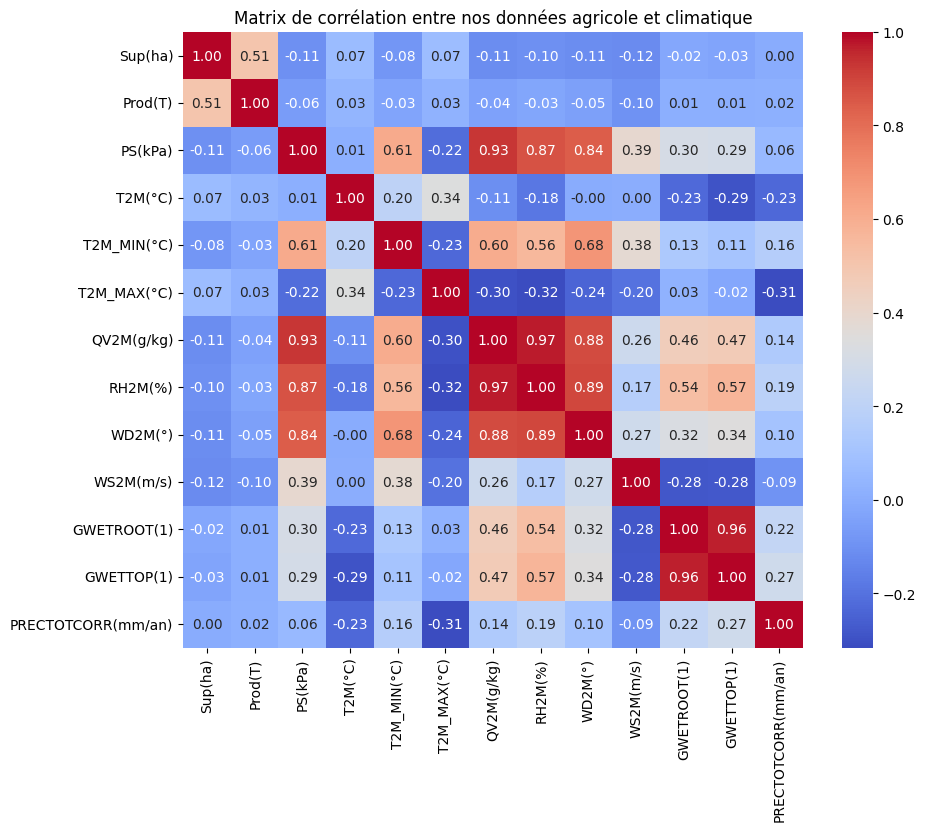

In [ ]:
# Corrélation entre données climatique
df_agroclimat_selected = df_agroclimat[['Sup(ha)', 'Prod(T)', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']]

# Calculate the correlation matrix
matrix_agroclimat = df_agroclimat_selected.corr()

# Print the correlation matrix
matrix_agroclimat

#Matrice de corrélation
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(matrix_agroclimat, annot=True, fmt=".2f", ax=ax, cmap="coolwarm")

# Set the title and show the plot
plt.title("Matrix de corrélation entre nos données agricole et climatique")
plt.show()

In [ ]:
# Group the data by product
grouped_data = df_agroclimat.groupby("Produit")

# Loop through each product and create a correlation matrix
for product, data in grouped_data:
    df_product = data[['Prod(T)', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']]

    # Calculate the correlation matrix
    matrix_product = df_product.corr()

    # Create a heatmap of the correlation matrix
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(matrix_product, annot=True, fmt=".2f", ax=ax, cmap="coolwarm")

    # Set the title and show the plot
    plt.title(f"Matrix de corrélation entre les données climatique avec le produit {product}")
    plt.show()


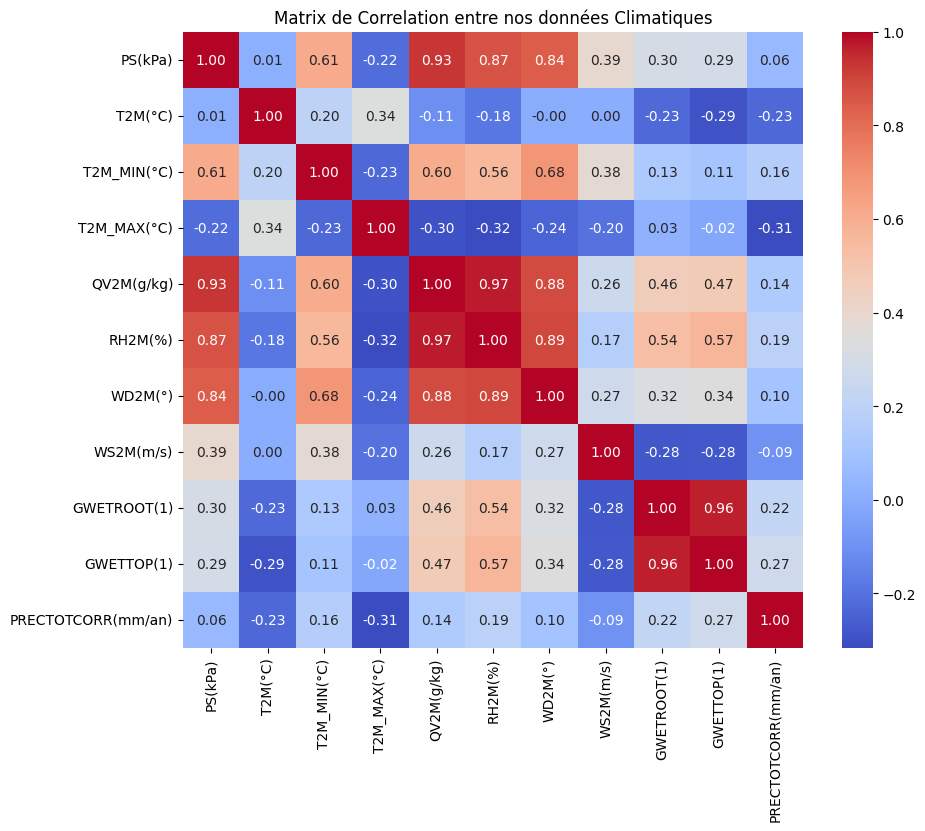

In [ ]:
df_agroclimat_selected = df_agroclimat[['PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']]

# Calculate the correlation matrix
matrix_climat = df_agroclimat_selected.corr()

fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(matrix_climat, annot=True, fmt=".2f", ax=ax, cmap="coolwarm")

# Set the title and show the plot
plt.title("Matrix de Correlation entre nos données Climatiques")
plt.show()

In [ ]:
import matplotlib.pyplot as plt
# Group the data by department and product
grouped_data = df_agroclimat.groupby(['Departement', 'Produit'])

# Iterate through each department and product combination
for (departement, product), data in grouped_data:
    # Select relevant columns for correlation analysis
    df_product = data[['Prod(T)', 'PS(kPa)', 'T2M(°C)',
                       'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)',
                       'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)',
                       'GWETTOP(1)', 'PRECTOTCORR(mm/an)']]

    # Calculate the correlation matrix
    matrix_product = df_product.corr()

    # Create a heatmap of the correlation matrix
    fig, ax = plt.subplots(figsize=(12, 10))
    sns.heatmap(matrix_product, annot=True, fmt=".2f", ax=ax, cmap="coolwarm")

    # Set the title and show the plot
    plt.title(f"Matrice de corrélation pour {product} dans le département de {departement}")
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
# Group the data by department, commune, and product
grouped_data = df_agroclimat.groupby(['Departement', 'Produit'])

# Iterate through each department, commune, and product combination
for (commune, product), data in grouped_data:
    # Select relevant columns for correlation analysis
    df_product = data[['Prod(T)', 'PS(kPa)', 'T2M(°C)',
                       'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)',
                       'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)',
                       'GWETTOP(1)', 'PRECTOTCORR(mm/an)']]

    # Calculate the correlation matrix
    matrix_product = df_product.corr()

    # Create a heatmap of the correlation matrix
    fig, ax = plt.subplots(figsize=(12, 10))
    sns.heatmap(matrix_product, annot=True, fmt=".2f", ax=ax, cmap="coolwarm")

    # Set the title and show the plot
    plt.title(f"Matrice de corrélation pour {product} dans la commune de {commune}")
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
# Group the data by department, commune, and product
grouped_data = df_agroclimat.groupby(['Departement', 'Communes', 'Produit'])

# Iterate through each department, commune, and product combination
for (departement, commune, product), data in grouped_data:
    # Select relevant columns for correlation analysis
    df_product = data[['Prod(T)', 'PS(kPa)', 'T2M(°C)',
                       'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)',
                       'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)',
                       'GWETTOP(1)', 'PRECTOTCORR(mm/an)']]

    # Calculate the correlation matrix
    correlation_matrix = df_product.corr()

    # Find factors with strong positive correlation to production
    favorable_factors = correlation_matrix['Prod(T)'][correlation_matrix['Prod(T)'] > 0.15].index.tolist()

    # Check if 'Prod(T)' is in the list before removing it
    if 'Prod(T)' in favorable_factors:
        favorable_factors.remove('Prod(T)')  # Remove 'Prod(T)' itself

    if favorable_factors:
        print(f"Dans la commune de {commune} du département de ({departement}), les facteurs climatiques suivants favorisent la production de {product}:")
        for factor in favorable_factors:
            print(f"- {factor}")
    else:
        print(f"Dans la commune de {commune} ({departement}), aucun facteur climatique n'a une forte corrélation positive avec la production de {product}.")

    print("-" * 30)  # Separator between communes

In [ ]:
# Group the data by commune and product, then sum the production
commune_product_production = df_agroclimat.groupby(['Departement', 'Produit'])['Prod(T)'].mean().reset_index()

# For each commune, find the top 5 products
top_products_by_commune = commune_product_production.groupby('Departement').apply(lambda x: x.nlargest(6, 'Prod(T)'))

# Print the results
top_products_by_commune.head(45)

<ipython-input-71-14b14114c23d>:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_products_by_commune = commune_product_production.groupby('Departement').apply(lambda x: x.nlargest(6, 'Prod(T)'))


Departement   Produit        Prod(T)
Departement                                        
ALIBORI     2      ALIBORI     Coton   32427.053628
            5      ALIBORI      Maïs   31614.561022
            3      ALIBORI    Igname   18384.890446
            7      ALIBORI       Riz   16571.138739
            1      ALIBORI  Arachide    4649.097245
            4      ALIBORI    Manioc    3827.565900
ATACORA     13     ATACORA    Igname   51633.655379
            14     ATACORA    Manioc   18396.525946
            15     ATACORA      Maïs   15940.765680
            12     ATACORA     Coton    8148.231091
            17     ATACORA       Riz    5070.241827
            18     ATACORA      Soja    4581.673622
ATLANTIQUE  24  ATLANTIQUE    Manioc   90717.641214
            20  ATLANTIQUE    Ananas   31089.398848
            25  ATLANTIQUE      Maïs   12728.450327
            29  ATLANTIQUE    Tomate   11437.323026
            26  ATLANTIQUE    Piment    1010.487744
            21  ATLANTIQUE  Arachide     291.154178
BORGOU      33      BORGOU    Igname  130423.287537
            34      BORGOU    Manioc   25801.943624
            35      BORGOU      Maïs   21261.052038
            32      BORGOU     Coton    8658.242306
            38      BORGOU      Soja    5286.809968
            31      BORGOU  Arachide    1396.664754
COLLINES    44    COLLINES    Manioc  105373.873054
            43    COLLINES    Igname   96969.170891
            45    COLLINES      Maïs   16047.877035
            41    COLLINES  Arachide    6303.431430
            47    COLLINES       Riz    5642.603393
            42    COLLINES     Coton    3425.739720
COUFFO      54      COUFFO    Manioc   36473.305821
            55      COUFFO      Maïs   13430.531662
            59      COUFFO    Tomate    6310.820940
            51      COUFFO  Arachide    1459.378430
            52      COUFFO     Coton     973.195694
            56      COUFFO    Piment     759.772446
DONGA       63       DONGA    Igname   79953.051898
            64       DONGA    Manioc   29904.785180
            65       DONGA      Maïs    8667.565516
            67       DONGA       Riz    3088.063320
            61       DONGA  Arachide    2294.748574
            62       DONGA     Coton    2084.361906
LITTORAL    78    LITTORAL    Tomate      76.251048
            75    LITTORAL    Piment      19.582099
            73    LITTORAL    Manioc       0.398182

#Encodage des données catégorielles

In [ ]:
agrocleaned = df_agroclimat.copy()

In [ ]:
agrocleaned

,Produit,Departement,Communes,Sup(ha),Rend(kg/ha),Prod(T),Annees,PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1),PRECTOTCORR(mm/an)
0,Maïs,BORGOU,BEMBEREKE,9509.0,923.756441,8784.0,2002,97.270000,26.480000,21.825583,33.320667,13.430000,62.620000,159.310000,2.030000,0.550000,0.520000,89.175
1,Maïs,BORGOU,KALALE,18300.0,1107.595628,20269.0,2002,97.270000,26.480000,21.825583,33.320667,13.430000,62.620000,159.310000,2.030000,0.550000,0.520000,89.175
2,Maïs,BORGOU,N'DALI,7764.0,1467.284905,11392.0,2002,97.270000,26.480000,21.825583,33.320667,13.430000,62.620000,159.310000,2.030000,0.550000,0.520000,89.175
3,Maïs,BORGOU,NIKKI,15089.0,1267.413347,19124.0,2002,97.270000,26.480000,21.825583,33.320667,13.430000,62.620000,159.310000,2.030000,0.550000,0.520000,89.175
4,Maïs,BORGOU,PARAKOU,7495.0,1102.735157,8265.0,2002,97.270000,26.480000,21.825583,33.320667,13.430000,62.620000,159.310000,2.030000,0.550000,0.520000,89.175
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16501,Coton,ATLANTIQUE,ALLADA,0.0,0.000000,0.0,2023,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490
16502,Coton,ATLANTIQUE,KPOMASSE,0.0,0.000000,0.0,2023,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490
16503,Coton,ATLANTIQUE,TORI-BOSSITO,0.0,0.000000,0.0,2023,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490
16504,Coton,ATLANTIQUE,TOFFO,0.0,0.000000,0.0,2023,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490


In [ ]:
# def labelisation(agrocleaned):
#     agrocleaned['Produit'] = Produit_categories.cat.codes
#     agrocleaned['Departement'] = Departement_categories.cat.codes
#     agrocleaned['Communes'] = Communes_categories.cat.codes
#     return agrocleaned

# def inverse_labelisation(code):
#     return Produit_categories.cat.categories[code], Departement_categories.cat.categories[code], Communes_categories.cat.categories[code]

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Création d'un LabelEncoder distinct pour chaque variable
le_produit = LabelEncoder()
le_departement = LabelEncoder()
le_communes = LabelEncoder()

# Encodage des variables catégorielles
Produit_categories = le_produit.fit_transform(agrocleaned['Produit'])
Departement_categories = le_departement.fit_transform(agrocleaned['Departement'])
Communes_categories = le_communes.fit_transform(agrocleaned['Communes'])

# Fonction pour encoder les données
def labelisation(agrocleaned):
    agrocleaned['Produit'] = Produit_categories
    agrocleaned['Departement'] = Departement_categories
    agrocleaned['Communes'] = Communes_categories
    return agrocleaned

# Fonction pour décoder les données (inverser l'encodage)
def inverse_labelisation(agrocleaned):
    agrocleaned['Produit'] = le_produit.inverse_transform(agrocleaned['Produit'])
    agrocleaned['Departement'] = le_departement.inverse_transform(agrocleaned['Departement'])
    agrocleaned['Communes'] = le_communes.inverse_transform(agrocleaned['Communes'])
    return agrocleaned


In [ ]:
# Encodage des variables catégorielles
agrocleaned = labelisation(agrocleaned)

In [ ]:
agrocleaned.head()

,Produit,Departement,Communes,Sup(ha),Rend(kg/ha),Prod(T),Annees,PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1),PRECTOTCORR(mm/an)
0,5,3,15,9509.0,923.756441,8784.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
1,5,3,36,18300.0,1107.595628,20269.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
2,5,3,48,7764.0,1467.284905,11392.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
3,5,3,50,15089.0,1267.413347,19124.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
4,5,3,55,7495.0,1102.735157,8265.0,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175


In [ ]:
# Sélection des données agricoles
df_agro = agrocleaned[['Departement', 'Communes', 'Sup(ha)', 'Rend(kg/ha)', 'Annees', 'Prod(T)', 'Produit']]

# Sélection des données climatiques
df_clim = agrocleaned[['Departement', 'Communes', 'Annees', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']]

#Visualisation de la distribution de toutes les variables






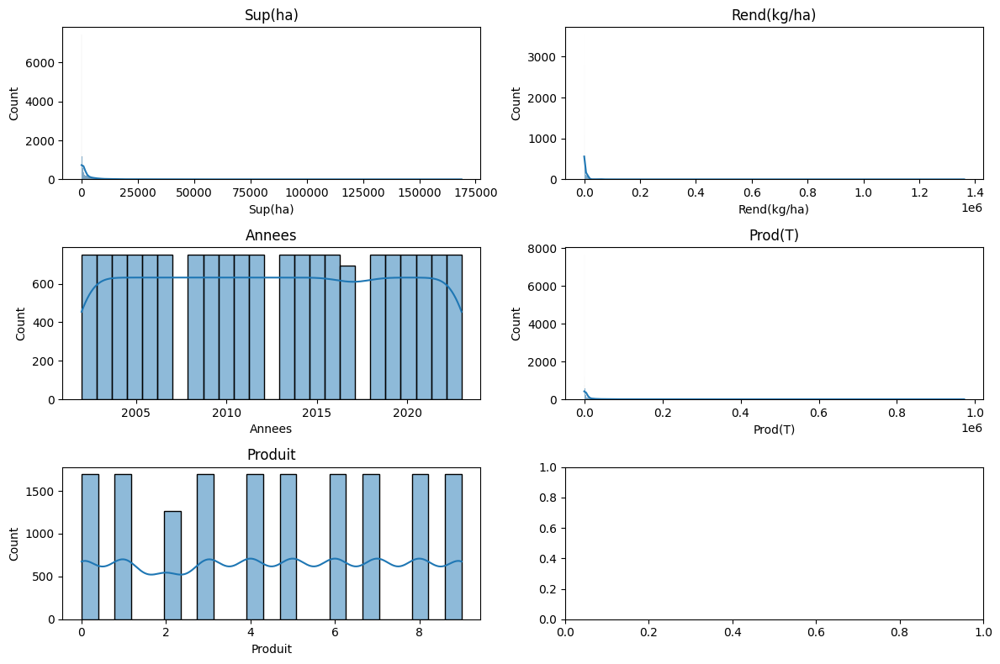

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 8)) # Changed nrows to 3 to accommodate all the plots

# Iterate through each variable and plot its distribution
for i, col in enumerate(df_agro.iloc[:, 2:]):
    sns.histplot(data=df_agro.iloc[:, 2:] , x=col, kde=True, ax=axes[i // 2, i % 2])
    axes[i // 2, i % 2].set_title(col)

# Adjust spacing and show the plot
plt.tight_layout()
plt.show()

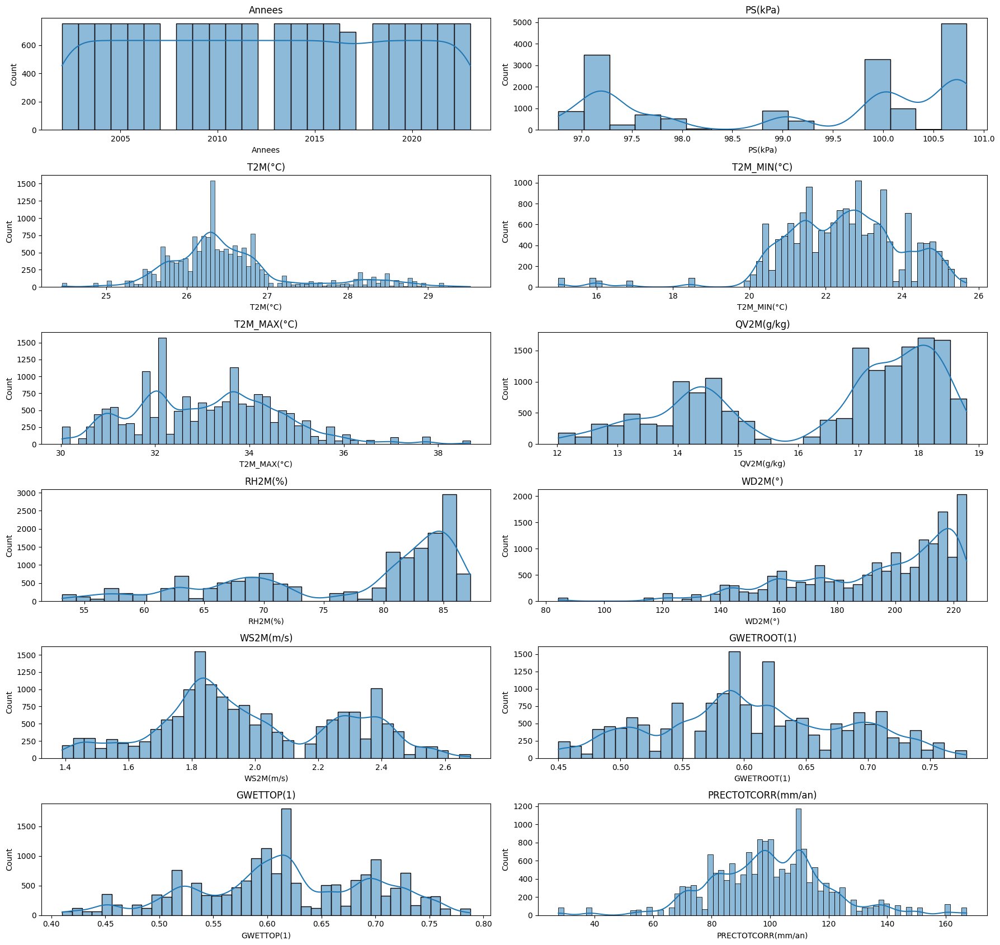

In [ ]:
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(18, 17))

# Iterate through each variable and plot its distribution
for i, col in enumerate(df_clim.iloc[:, 2:]):
    sns.histplot(data=df_clim.iloc[:, 2:], x=col, kde=True, ax=axes[i // 2, i % 2])
    axes[i // 2, i % 2].set_title(col)

# Adjust spacing and show the plot
plt.tight_layout()
plt.show()

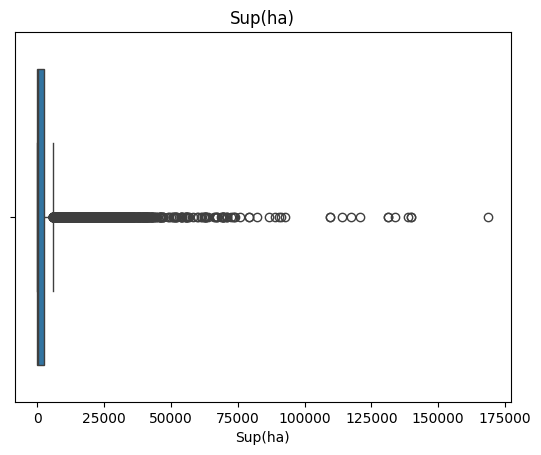

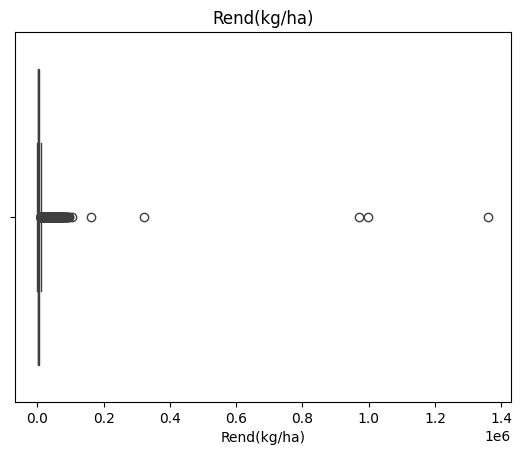

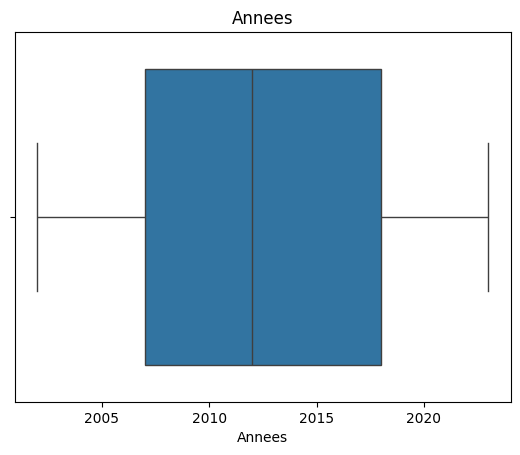

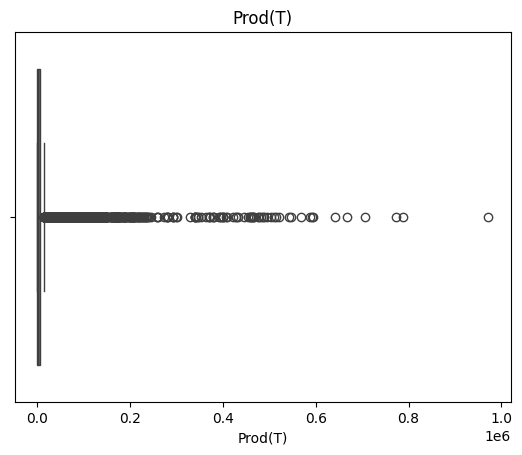

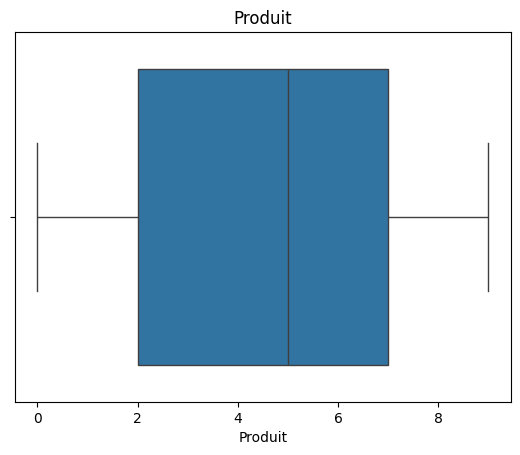

In [ ]:
for col in (df_agro.iloc[:, 2:]).columns:
    sns.boxplot(x= (df_agro.iloc[:, 2:])[col])
    plt.title(col)
    plt.show()

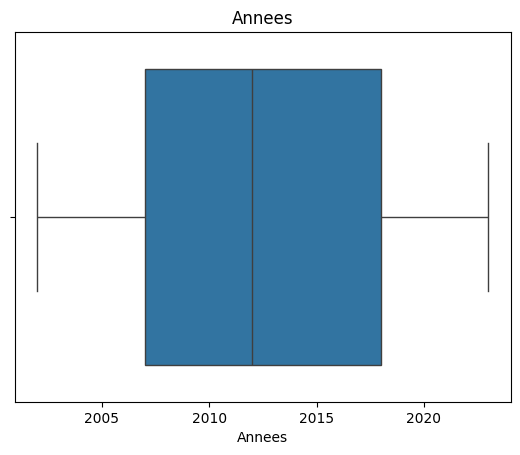

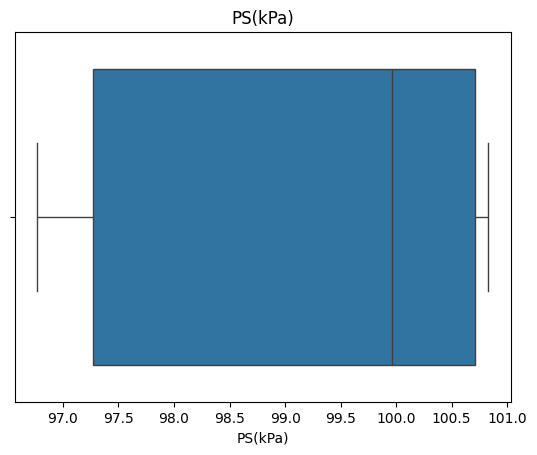

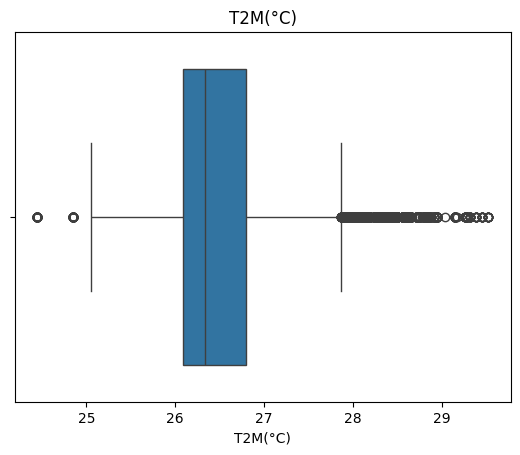

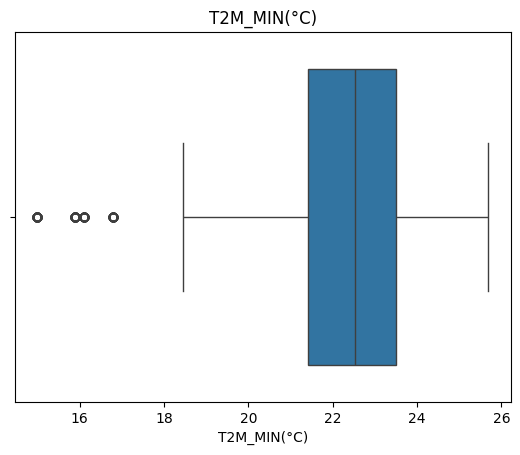

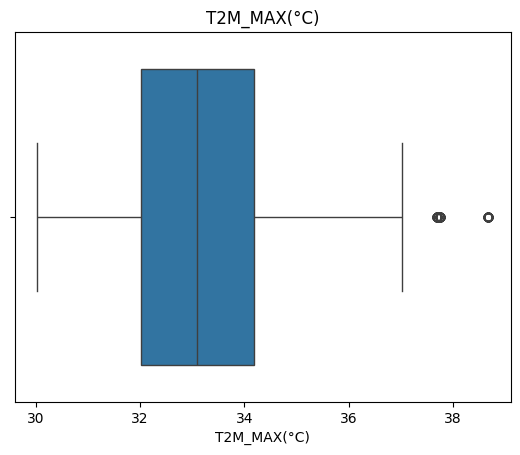

...

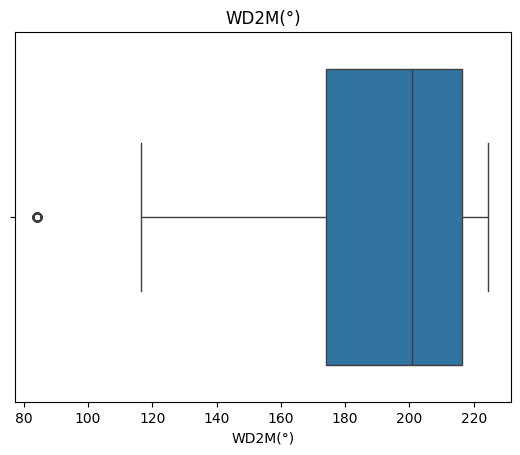

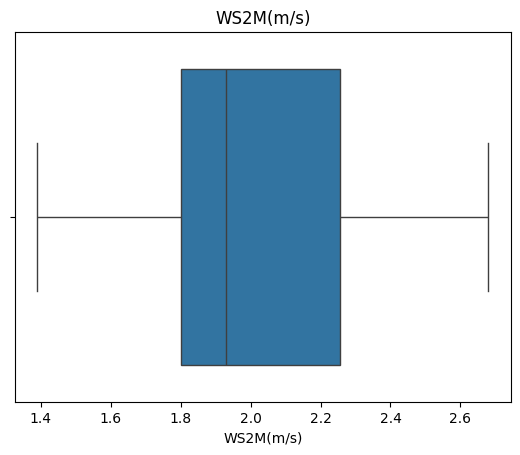

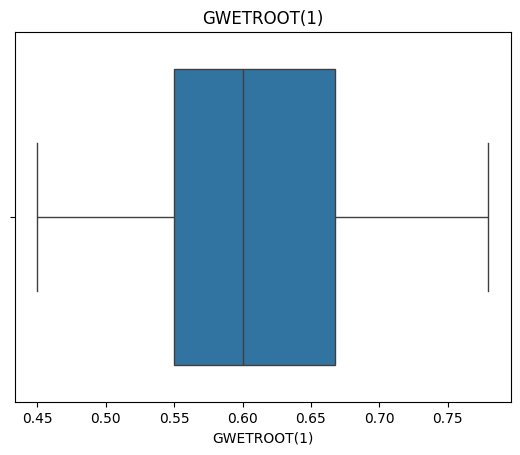

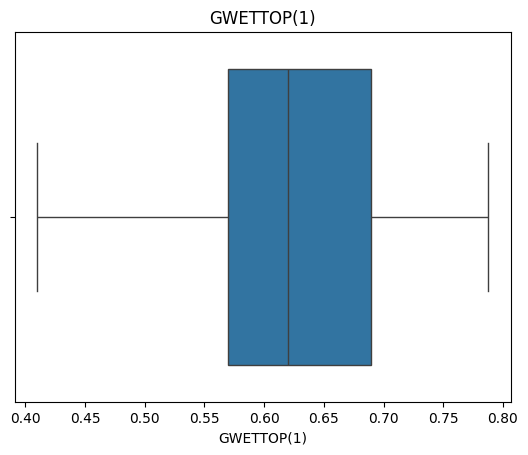

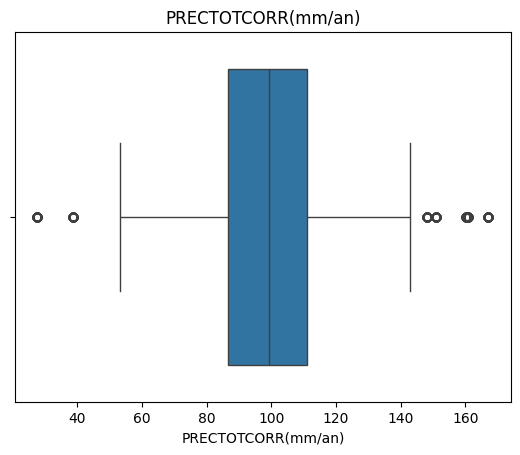

In [ ]:
for col in  (df_clim.iloc[:, 2:]).columns:
    sns.boxplot(x= (df_clim.iloc[:, 2:])[col])
    plt.title(col)
    plt.show()

# Normalisation Sélection des caractéristiques /Analyse en composantes principales (PCA)

In [ ]:
from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.cluster import KMeans

In [ ]:
df_clim.head()

,Departement,Communes,Annees,PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1),PRECTOTCORR(mm/an)
0,3,15,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
1,3,36,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
2,3,48,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
3,3,50,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175
4,3,55,2002,97.27,26.48,21.825583,33.320667,13.43,62.62,159.31,2.03,0.55,0.52,89.175


In [ ]:
# Standardize the data (excluding the first two columns)
data = preprocessing.StandardScaler().fit_transform((df_clim.iloc[:, 2:]))

# Create a PCA object and fit it to the standardized data
pca = PCA().fit(data)

# Calculate the cumulative explained variance
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

# Determine the number of components to explain 95% of the variance
n_components = np.argmax(cumulative_explained_variance >= 0.95) + 1

# Create a PCA object with the selected number of components
pca = PCA(n_components=n_components).fit(data)

# Transform the data using the fitted PCA
pca_data = pca.transform(data)

print(f'Number of components selected: {n_components}')

Number of components selected: 7


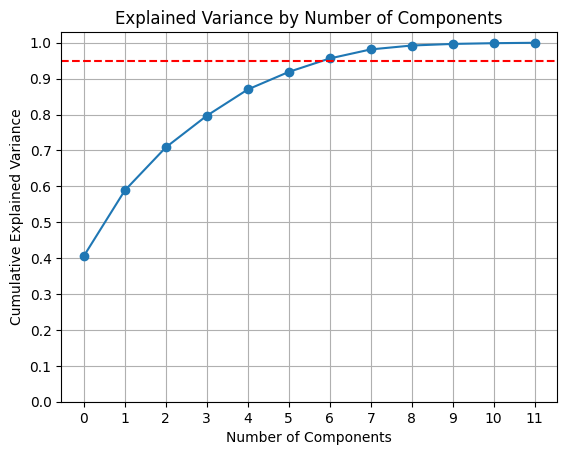

In [ ]:
# Plot the cumulative explained variance
plt.figure()
plt.plot(cumulative_explained_variance, marker='o')
plt.axhline(y=0.95, color='r', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of Components')
plt.xticks(range(len(cumulative_explained_variance))) # Add this line for x-axis ticks
plt.yticks(np.arange(0, 1.1, 0.1)) # Add this line for y-axis ticks
plt.grid(True) # Add this line to show grid
plt.show()

In [ ]:
data

array([[-1.65096866, -1.27340305, -0.0797701 , ..., -0.75369826,
        -1.18463264, -0.51812117],
       [-1.65096866, -1.27340305, -0.0797701 , ..., -0.75369826,
        -1.18463264, -0.51812117],
       [-1.65096866, -1.27340305, -0.0797701 , ..., -0.75369826,
        -1.18463264, -0.51812117],
       ...,
       [ 1.65612069,  1.04954738,  0.2960988 , ..., -0.05327147,
         0.14506441, -1.67298811],
       [ 1.65612069,  1.04954738,  0.2960988 , ..., -0.05327147,
         0.14506441, -1.67298811],
       [ 1.65612069,  1.04954738,  0.2960988 , ..., -0.05327147,
         0.14506441, -1.67298811]])

In [ ]:
df_clim.shape

(16506, 14)

In [ ]:
# Affichage des explained variance ratios
pca.explained_variance_ratio_.cumsum()

# Affichage des composantes principales
pca.components_

# Affichage des valeurs propres
pca.explained_variance_

array([4.8699234 , 2.19428337, 1.43990447, 1.05780089, 0.87818431,
       0.5871451 , 0.44982968])

Affichage la courbe de la variance expliquée de chaque axe.

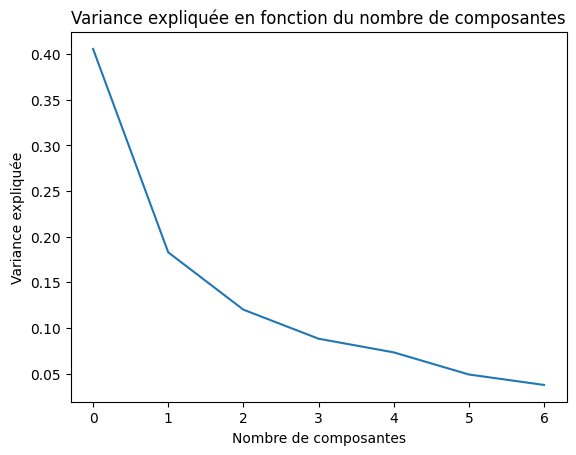

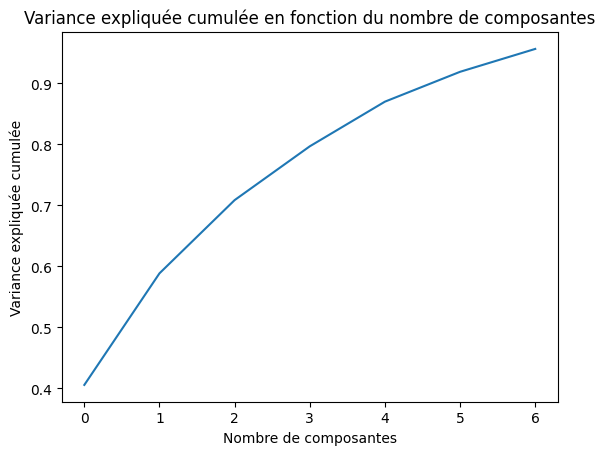

In [ ]:
plt.plot(pca.explained_variance_ratio_)
plt.xlabel('Nombre de composantes')
plt.ylabel('Variance expliquée')
plt.title('Variance expliquée en fonction du nombre de composantes')
plt.show()

plt.plot(pca.explained_variance_ratio_.cumsum())
plt.xlabel('Nombre de composantes')
plt.ylabel('Variance expliquée cumulée')
plt.title('Variance expliquée cumulée en fonction du nombre de composantes')
plt.show()

Calcule les coordonnées des exemples sur les nouveaux axes. Affichez les et représenter aussi les anciennes dimensions sur le même graphique (la fonction plt.arrow permet de dessiner des flèches

In [ ]:
#Coordonnées des noveaux axes en fonction des anciens
pca.components_
# Récupère les noms de colonnes du DataFrame utilisé pour s'adapter à la PCA
pca_coords = pd.DataFrame(pca.components_, columns=(df_clim.iloc[:, 2:]).columns[:pca.components_.shape[1]])
pca_coords.plot.bar(figsize=(15, 9))
plt.show()

# Cercle des corrélations

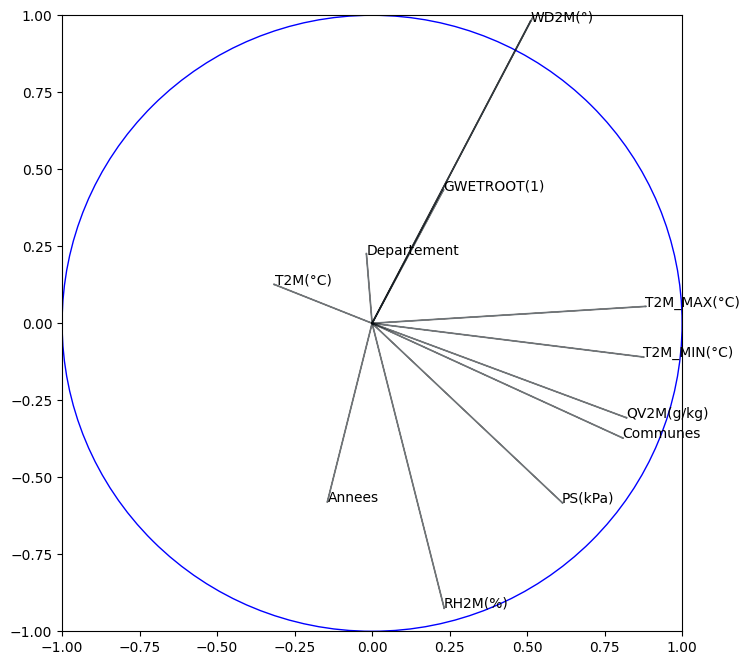

In [ ]:
cols = (df_clim.columns.tolist())
fig, axes = plt.subplots(figsize=(8,8))
axes.set_xlim(-1,1)
axes.set_ylim(-1,1)
cercle = plt.Circle((0,0),1,color='blue',fill=False)
axes.add_artist(cercle)
#affichage
for j in range(data.shape[1]):
    plt.arrow(0,0,pca.components_[0,j]*2,pca.components_[1,j]*2,alpha=0.5)
    plt.annotate(cols[j],(pca.components_[0,j]*2,pca.components_[1,j]*2))
plt.show()

#Clustering
Choix du meilleure K

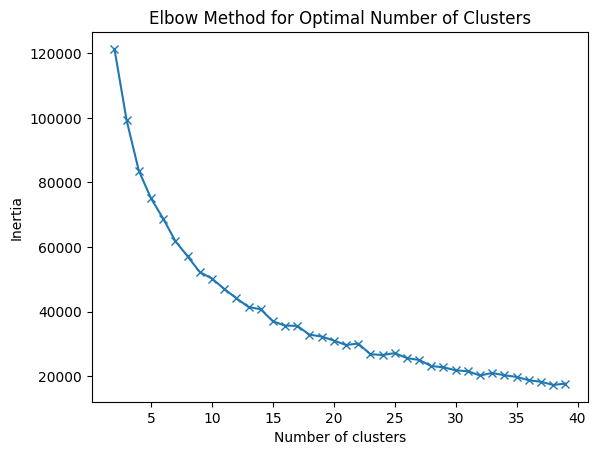

In [ ]:
elbow = []
for i in range(2, 40):
    km = KMeans(n_clusters=i)
    km.fit_predict(pca_data)
    elbow.append(km.inertia_)

plt.figure()
plt.plot(range(2, 40), elbow, "x-")
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.show()

In [ ]:
# tab20 = plt.get_cmap('tab20')

# km.n_clusters = 24
# pred = km.fit_predict(pca_data)

# real_centers = pca.inverse_transform(km.cluster_centers_)
# fig, axs = plt.subplots(km.n_clusters//2, 2, sharey=True,sharex=True,figsize=(10,10))
# for i,k in enumerate(real_centers):
#     axs.flatten()[i].bar(range(len(k)),k,color=tab20.colors[i])
#     axs.flatten()[i].set_xticks(range(len(k)))
#     # Make sure the number of labels matches the number of ticks
#     axs.flatten()[i].set_xticklabels(cols[:len(k)],rotation="vertical")
#     axs.flatten()[i].set_title(f'Cluster {i+1}')

# plt.tight_layout()
# plt.show()

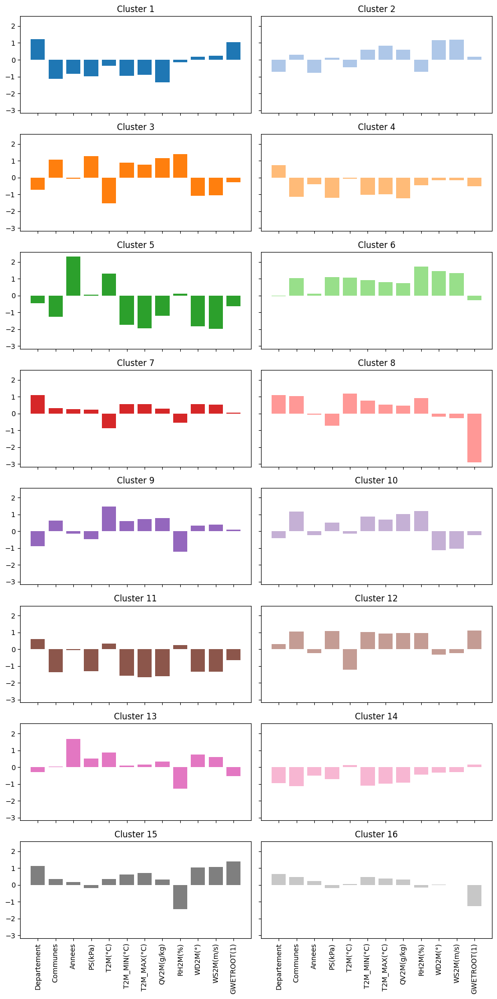

In [ ]:
tab20 = plt.get_cmap('tab20')

km.n_clusters = 16
pred = km.fit_predict(pca_data)

real_centers = pca.inverse_transform(km.cluster_centers_)
# Increased the figsize to accommodate more subplots
fig, axs = plt.subplots(km.n_clusters//2, 2, sharey=True,sharex=True,figsize=(10,20))
for i,k in enumerate(real_centers):
    # Use modulo operator to cycle through the colors
    axs.flatten()[i].bar(range(len(k)),k,color=tab20.colors[i%len(tab20.colors)])
    axs.flatten()[i].set_xticks(range(len(k)))
    axs.flatten()[i].set_xticklabels(cols[:len(k)],rotation="vertical")
    axs.flatten()[i].set_title(f'Cluster {i+1}')

plt.tight_layout()
plt.show()

In [ ]:
df_agroclimat['color'] = pred
df_agroclimat.columns

Index(['Produit', 'Departement', 'Communes', 'Sup(ha)', 'Rend(kg/ha)',
       'Prod(T)', 'Annees', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)',
       'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)',
       'GWETTOP(1)', 'PRECTOTCORR(mm/an)', 'color'],
      dtype='object')

In [ ]:
set(pred)

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15}

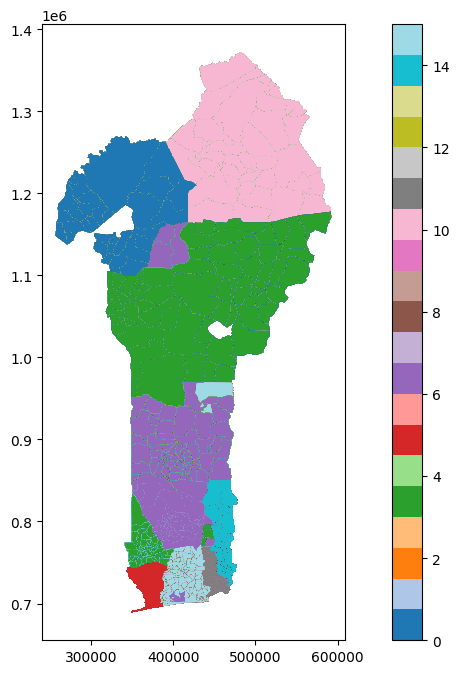

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))
geo.merge(df_agroclimat, left_on='NOM_COM', right_on='Communes').plot(column='color', cmap=tab20, legend=True, ax=ax)
plt.show()

In [ ]:
#Ce que représente chaque couleur sur la carte

# Affiche les caractéristiques moyennes de chaque cluster
for i in range(km.n_clusters):
    cluster_data = df_agroclimat[df_agroclimat['color'] == i]
    print(f"Caractéristiques du cluster {i+1}:")
    print(cluster_data[['PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']].mean())
    print("-" * 30)


Caractéristiques du cluster 1:
PS(kPa)                97.178730
T2M(°C)                25.787862
T2M_MIN(°C)            21.052916
T2M_MAX(°C)            32.645727
QV2M(g/kg)             14.592933
RH2M(%)                69.776536
WD2M(°)               157.618856
WS2M(m/s)               1.941720
GWETROOT(1)             0.616544
GWETTOP(1)              0.634586
PRECTOTCORR(mm/an)    120.892443
dtype: float64
------------------------------
Caractéristiques du cluster 2:
PS(kPa)               100.006192
T2M(°C)                25.944712
T2M_MIN(°C)            22.530452
T2M_MAX(°C)            32.319089
QV2M(g/kg)             17.450732
RH2M(%)                83.956190
WD2M(°)               206.940657
WS2M(m/s)               1.778546
GWETROOT(1)             0.701189
GWETTOP(1)              0.711908
PRECTOTCORR(mm/an)    103.822621
dtype: float64
------------------------------
Caractéristiques du cluster 3:
PS(kPa)               100.772500
T2M(°C)                26.430000
T2M_MIN(°C)            

In [ ]:
# Group the data by commune and product, then sum the production
commune_product_production = df_agroclimat.groupby(['Communes', 'Produit'])['Prod(T)'].mean().reset_index()

# For each commune, find the top 5 products
top_products_by_commune = commune_product_production.groupby('Communes').apply(lambda x: x.nlargest(5, 'Prod(T)')).reset_index(drop=True)

# Merge with the original dataframe to get climatic factors
top_products_with_climate = top_products_by_commune.merge(df_agroclimat, on=['Communes', 'Produit'])

# Group by commune and product, then calculate mean climatic factors
commune_product_climate = top_products_with_climate.groupby(['Communes', 'Produit'])[['PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']].mean().reset_index()

# Print the results
for commune, data in commune_product_climate.groupby('Communes'):
    print(f"Commune: {commune}")
    for _, row in data.iterrows():
        print(f"  Produit: {row['Produit']}")
        print(f"    Facteurs climatiques moyens:")
        for factor in ['PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']:
            print(f"      {factor}: {row[factor]:.2f}")
    print("*" * 30)


<ipython-input-100-4fb42042bb45>:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_products_by_commune = commune_product_production.groupby('Communes').apply(lambda x: x.nlargest(5, 'Prod(T)')).reset_index(drop=True)


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
      GWETTOP(1): 0.67
      PRECTOTCORR(mm/an): 110.12
  Produit: Maïs
    Facteurs climatiques moyens:
      PS(kPa): 100.27
      T2M(°C): 26.00
      T2M_MIN(°C): 22.80
      T2M_MAX(°C): 34.84
      QV2M(g/kg): 17.71
      RH2M(%): 84.90
      WD2M(°): 211.60
      WS2M(m/s): 1.47
      GWETROOT(1): 0.66
      GWETTOP(1): 0.67
      PRECTOTCORR(mm/an): 110.12
  Produit: Piment
    Facteurs climatiques moyens:
      PS(kPa): 100.27
      T2M(°C): 26.00
      T2M_MIN(°C): 22.80
      T2M_MAX(°C): 34.84
      QV2M(g/kg): 17.71
      RH2M(%): 84.90
      WD2M(°): 211.60
      WS2M(m/s): 1.47
      GWETROOT(1): 0.66
      GWETTOP(1): 0.67
      PRECTOTCORR(mm/an): 110.12
  Produit: Tomate
    Facteurs climatiques moyens:
      PS(kPa): 100.27
      T2M(°C): 26.00
      T2M_MIN(°C): 22.80
      T2M_MAX(°C): 34.84
      QV2M(g/kg): 17.71
      RH2M(%): 84.90
      WD2M(°): 211.60
      WS2M(m/s): 1.47
      GWE

In [ ]:
# Group the data by commune, year, and cluster
grouped_data = df_agroclimat.groupby(['Communes', 'Annees', 'color'])

# Iterate through each commune, year, and cluster combination
for (commune, year, cluster), data in grouped_data:
    # Calculate the total production for the commune, year, and cluster
    total_production = data['Prod(T)'].mean()

    # Find the products with the highest production
    top_products = data.nlargest(9, 'Prod(T)')['Produit'].tolist()

    # Calculate the mean of each climatic factor for the commune, year, and cluster
    mean_climatic_factors = data[['PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']].mean()

    print(f"Commune: {commune}, Année: {year}, Cluster: {cluster}")
    print(f"  Production totale: {total_production:.2f} T")
    print(f"  Top 5 produits: {', '.join(top_products)}")
    print(f"  Facteurs climatiques moyens:")
    for factor in ['PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']:
        print(f"    {factor}: {mean_climatic_factors[factor]:.2f}")
    print("-" * 30)


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
    QV2M(g/kg): 17.27
    RH2M(%): 82.38
    WD2M(°): 200.69
    WS2M(m/s): 1.54
    GWETROOT(1): 0.73
    GWETTOP(1): 0.75
    PRECTOTCORR(mm/an): 160.84
------------------------------
Commune: SAVE, Année: 2020, Cluster: 14
  Production totale: 8736.81 T
  Top 5 produits: Manioc, Igname, Coton, Maïs, Soja, Arachide, Riz, Tomate, Piment
  Facteurs climatiques moyens:
    PS(kPa): 99.08
    T2M(°C): 27.88
    T2M_MIN(°C): 21.69
    T2M_MAX(°C): 32.49
    QV2M(g/kg): 16.72
    RH2M(%): 81.06
    WD2M(°): 198.19
    WS2M(m/s): 1.71
    GWETROOT(1): 0.71
    GWETTOP(1): 0.73
    PRECTOTCORR(mm/an): 142.82
------------------------------
Commune: SAVE, Année: 2021, Cluster: 14
  Production totale: 9348.05 T
  Top 5 produits: Manioc, Igname, Coton, Maïs, Arachide, Soja, Tomate, Riz, Piment
  Facteurs climatiques moyens:
    PS(kPa): 99.03
    T2M(°C): 28.19
    T2M_MIN(°C): 22.27
    T2M_MAX(°C): 32.81
    QV2M(g/k

#Association des Clusters aux Productions
Comparaison des Clusters :


In [ ]:
# Add the cluster assignments to the DataFrame
df_agroclimat['Cluster'] = pred

# Calculate the Rendement moyen for each cluster
cluster_yields = {}
for i in range(km.n_clusters):
    cluster_yields[i] = df_agroclimat[df_agroclimat['Cluster'] == i]['Prod(T)'].mean()

# Identify the cluster with the highest Rendement moyen
highest_yield_cluster = max(cluster_yields, key=cluster_yields.get)

# Print the Rendement moyen for the highest yield cluster
print(f"Le cluster avec une production moyenne ae plus élevée est le cluster {highest_yield_cluster + 1}, avec un production moyenne de {cluster_yields[highest_yield_cluster]:.2f} Tonnes.")

# Sort the clusters by Rendement moyen in descending order
sorted_clusters = sorted(cluster_yields.items(), key=lambda x: x[1])

# Print the Rendement moyen for each cluster in descending order
print("Production moyenne pour chaque cluster (ordre décroissant) :")
for i, (cluster, mean_yield) in enumerate(sorted_clusters):
    print(f"Cluster {cluster + 1}: Production moyenne = {mean_yield:.2f} Tonnes")


Le cluster avec une production moyenne ae plus élevée est le cluster 15, avec un production moyenne de 23417.66 Tonnes.
Production moyenne pour chaque cluster (ordre décroissant) :
Cluster 10: Production moyenne = 2392.47 Tonnes
Cluster 6: Production moyenne = 4644.09 Tonnes
Cluster 2: Production moyenne = 6935.04 Tonnes
Cluster 5: Production moyenne = 8395.80 Tonnes
Cluster 12: Production moyenne = 8724.04 Tonnes
Cluster 16: Production moyenne = 8736.53 Tonnes
Cluster 7: Production moyenne = 9554.67 Tonnes
Cluster 14: Production moyenne = 11580.88 Tonnes
Cluster 3: Production moyenne = 11886.06 Tonnes
Cluster 8: Production moyenne = 12272.90 Tonnes
Cluster 4: Production moyenne = 15886.16 Tonnes
Cluster 11: Production moyenne = 15953.54 Tonnes
Cluster 9: Production moyenne = 17317.34 Tonnes
Cluster 1: Production moyenne = 19672.09 Tonnes
Cluster 13: Production moyenne = 22222.05 Tonnes
Cluster 15: Production moyenne = 23417.66 Tonnes


B.	Identification des Facteurs Clés

Identification des facteurs climatiques clés qui caractérisent les clusters à hauts rendements.


In [ ]:
# 1. Calculate the mean values of each climatic variable for each cluster
cluster_climate_means = {}
for i in range(km.n_clusters):
    cluster_climate_means[i] = df_agroclimat[df_agroclimat['Cluster'] == i].iloc[:, 12:25].mean()

# 2. Identify the cluster with the highest average yield
highest_yield_cluster = max(cluster_yields, key=cluster_yields.get)

# 3. Compare the climatic variables of the highest yield cluster to the other clusters
for variable in df_agroclimat.iloc[:, 12:25].columns:
    cluster_values = [cluster_climate_means[i][variable] for i in range(km.n_clusters)]
    highest_yield_value = cluster_climate_means[highest_yield_cluster][variable]

    # Print the variable name and the values for each cluster
    print(f"\nVariable: {variable}")
    for i, value in enumerate(cluster_values):
        print(f"Cluster {i+1}: {value:.2f}")

    # Highlight the highest value for the variable
    print(f"Highest yield cluster ({highest_yield_cluster+1}): {highest_yield_value:.2f} (highlighted)")

# 4. Analyze the results to identify the climatic variables that are most favorable for high yields in the context of the dataset.


Variable: RH2M(%)
Cluster 1: 69.78
Cluster 2: 83.96
Cluster 3: 84.84
Cluster 4: 67.91
Cluster 5: 57.59
Cluster 6: 83.95
Cluster 7: 80.84
Cluster 8: 82.22
Cluster 9: 83.44
Cluster 10: 84.70
Cluster 11: 60.99
Cluster 12: 85.48
Cluster 13: 80.41
Cluster 14: 67.83
Cluster 15: 83.29
Cluster 16: 80.28
Highest yield cluster (15): 83.29 (highlighted)

Variable: WD2M(°)
Cluster 1: 157.62
Cluster 2: 206.94
Cluster 3: 219.47
Cluster 4: 157.66
Cluster 5: 161.70
Cluster 6: 215.01
Cluster 7: 201.66
Cluster 8: 211.47
Cluster 9: 209.17
Cluster 10: 219.58
Cluster 11: 146.11
Cluster 12: 220.90
Cluster 13: 200.79
Cluster 14: 174.10
Cluster 15: 202.47
Cluster 16: 198.73
Highest yield cluster (15): 202.47 (highlighted)

Variable: WS2M(m/s)
Cluster 1: 1.94
Cluster 2: 1.78
Cluster 3: 2.38
Cluster 4: 1.84
Cluster 5: 2.03
Cluster 6: 2.48
Cluster 7: 1.83
Cluster 8: 2.30
Cluster 9: 1.58
Cluster 10: 2.36
Cluster 11: 2.07
Cluster 12: 2.28
Cluster 13: 1.67
Cluster 14: 1.85
Cluster 15: 1.58
Cluster 16: 1.93
Highest

#Modèle de prévision avec ARIMA


Importation des Bibliothèques

In [ ]:
#pip install pmdarima

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 46.4 MB/s eta 0:00:00


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.arima.model import ARIMA
from sklearn.linear_model import LinearRegression
from pmdarima import auto_arima
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import math
from sklearn.impute import SimpleImputer
from sklearn.model_selection import cross_val_score

1. Préparation des Données


In [ ]:
# # Sélection des données climatiques pertinentes
# data_clim = df_agroclimat[['Departement', 'Communes', 'Produit', 'Annees', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']]

# # Groupement des données par commune
# grouped_data = data_clim.groupby(['Departement','Communes', 'Produit'])

# # DataFrames pour stocker les résultats
# performance_df_arima = pd.DataFrame()
# prediction_df_arima = pd.DataFrame()

# # Itération sur chaque commune
# for (departement, commune, produit), data in grouped_data:
#     # Préparation des données pour chaque facteur climatique
#     for factor in ['PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']:
#         # Extraction des données pour le facteur actuel
#         factor_data = data[['Annees', factor]].set_index('Annees')

#         # Vérification que les années sont bien continues
#         if not factor_data.index.is_monotonic_increasing:
#             factor_data = factor_data.sort_index()

#         # Prédictions sur les dernières années des données existantes (test set)
#         train_size = int(len(factor_data) * 0.8)  # Divise en 80% training, 20% test
#         train_data = factor_data.iloc[:train_size]
#         test_data = factor_data.iloc[train_size:]

#         # Entraînement du modèle ARIMA sur l'ensemble d'entraînement
#         try:
#             model_fit = ARIMA(train_data, order=(2, 0, 0)).fit()

#             # Prédictions sur les données de test
#             predictions_test = model_fit.predict(start=len(train_data), end=len(train_data) + len(test_data) - 1)

#             # Calcul des métriques de performance
#             mse = mean_squared_error(test_data, predictions_test)
#             rmse = np.sqrt(mse)
#             mae = mean_absolute_error(test_data, predictions_test)
#             r2 = r2_score(test_data, predictions_test)

#             # Ajout des résultats de performance dans le DataFrame
#             performance_df_arima = pd.concat([performance_df_arima, pd.DataFrame({
#                 'Departement': [departement],
#                 'Communes': [commune],
#                 'Facteur': [factor],
#                 'MSE': [mse],
#                 'RMSE': [rmse],
#                 'MAE': [mae],
#                 'R2': [r2]
#             })], ignore_index=True)

#             # Prédictions sur 5 ans
#             future_years = range(factor_data.index[-1] + 1, factor_data.index[-1] + 6)
#             predictions = model_fit.predict(start=len(factor_data), end=len(factor_data) + 4)

#             # Ajout des prédictions au DataFrame
#             prediction_df_arima = pd.concat([prediction_df_arima, pd.DataFrame({
#                 'Departement': [departement] * len(future_years),
#                 'Communes': [commune] * len(future_years),
#                 'Produit': [produit] * len(future_years),
#                 'Annees': future_years,
#                 'Facteur': [factor] * len(future_years),
#                 'Valeur': predictions
#             })], ignore_index=True)

#         except Exception as e:
#             print(f"Erreur pour {commune}, {factor}: {str(e)}")

In [ ]:
# Calcul des intervalles de confiance pour les prédictions
# forecast = model_fit.get_forecast(steps=5)  # Intervalle à 95%
# predictions = forecast.predicted_mean
# conf_int = forecast.conf_int(alpha=0.05)
# stderr = forecast.se_mean

### Evaluation du modèle

In [ ]:
# # Affichage des perfomance par communes et par facteur climatique
# performance_df_arima

In [ ]:
# # Calcul des moyennes globales pour chaque métrique
# global_mse = performance_df_arima['MSE'].mean()
# global_rmse = performance_df_arima['RMSE'].mean()
# global_mae = performance_df_arima['MAE'].mean()
# grobal_r2 = performance_df_arima['R2'].mean()

# # Affichage des performances globales
# print(f"Performance globale du modèle ARIMA :")
# print(f"MSE global : {global_mse}")
# print(f"RMSE global : {global_rmse}")
# print(f"MAE global : {global_mae}")
# print(f"R2 global : {grobal_r2}")

Interprétation des résultats :

MSE global (107) : Cette valeur représente l'erreur quadratique moyenne globale. Elle est relativement élevée, ce qui indique que certaines prédictions du modèle ont des erreurs significatives. Cela peut être dû à des facteurs spécifiques ou des communes où le modèle a plus de difficultés à prédire correctement.

RMSE global (3.97) : Ce chiffre exprime l'erreur en unités des facteurs climatiques (par exemple, en °C pour la température ou en g/kg pour l'humidité). Un RMSE de 3.61 indique que, en moyenne, l'écart-type des erreurs de prédiction est de 3.61 unités, ce qui est assez important pour certaines variables.

MAE global (3.16) : Cela représente l'erreur absolue moyenne. En moyenne, les prédictions du modèle s'écartent de 3.01 unités des valeurs réelles. Le MAE est souvent plus interprétable que le MSE ou le RMSE car il ne pénalise pas autant les grosses erreurs.

Ce que cela signifie :

Le modèle ARIMA fonctionne globalement, mais il semble y avoir des erreurs non négligeables dans certaines prédictions. Cela peut s'expliquer par :
Une forte variabilité dans les données climatiques pour certaines communes.
Des modèles ARIMA qui ne capturent pas bien la dynamique de certains facteurs climatiques.

Points à noter :

Faibles valeurs de MSE, RMSE et MAE signifient que le modèle fait des prédictions précises.

### Recherche de paramètres ARIMA (Grid Search)

In [ ]:
# import warnings
# from statsmodels.tsa.arima.model import ARIMA
# import itertools
# import pandas as pd

# # Désactiver les avertissements
# warnings.filterwarnings("ignore")

# # Définir les plages de valeurs pour p, d, et q
# p = d = q = range(0, 3)  # Par exemple, on teste pour p, d, q dans {0, 1, 2}

# # Générer toutes les combinaisons possibles de p, d, q
# pdq_combinations = list(itertools.product(p, d, q))

# # Stocker les résultats
# best_aic = float('inf')  # AIC minimal
# best_pdq = None  # Meilleure combinaison de paramètres
# results = []

# # Itération sur toutes les combinaisons (p, d, q)
# for param in pdq_combinations:
#     try:
#         # Ajustement du modèle ARIMA
#         model = ARIMA(factor_data, order=param)
#         model_fit = model.fit()

#         # Enregistrement de l'AIC du modèle
#         aic = model_fit.aic

#         # Sauvegarder les paramètres et l'AIC dans les résultats
#         results.append((param, aic))

#         # Mise à jour du meilleur modèle si AIC est plus petit
#         if aic < best_aic:
#             best_aic = aic
#             best_pdq = param

#     except Exception as e:
#         continue

# # Afficher la meilleure combinaison de paramètres
# print(f"Meilleure combinaison de paramètres : {best_pdq} avec AIC : {best_aic}")

# # Transformer les résultats en DataFrame pour les visualiser
# results_df = pd.DataFrame(results, columns=["Paramètres", "AIC"])
# print(results_df.sort_values(by="AIC").head())

### Utilisation de l'AutoARIMA

utilisation de la fonction auto_arima de la bibliothèque pmdarima qui automatise la sélection des meilleurs paramètres en testant plusieurs combinaisons et en choisissant celle qui minimise un critère comme l'AIC.

In [ ]:
# from pmdarima import auto_arima

# # Utilisation de auto_arima pour déterminer les meilleurs p, d, q
# model_auto = auto_arima(factor_data,
#                         start_p=0, start_q=0,  # Début des valeurs de p et q
#                         max_p=3, max_q=3,  # Limites maximales pour p et q
#                         d=None,  # La différenciation sera choisie automatiquement
#                         seasonal=True,  # Si tes données sont saisonnières, mets True
#                         trace=True,  # Pour afficher les résultats des essais
#                         error_action='ignore',  # Pour ignorer les erreurs dans certaines combinaisons
#                         suppress_warnings=True,
#                         stepwise=True)  # Utilisation d'une recherche pas à pas pour optimiser

# # Résumé du meilleur modèle trouvé
# print(model_auto.summary())

# # Prédiction avec le modèle auto_arima
# predictions = model_auto.predict(n_periods=5)
# print(predictions)


### Prévisions des facteurs climatiques

In [ ]:
# # Affichage des prédictions
# prediction_df_arima

## Prévision agricole

In [ ]:
# # Fusionner les prévisions climatiques avec les données historiques de production agricole
# # Sélectionner les facteurs climatiques comme variables explicatives (sans superficie)
# data_for_model = prediction_df_arima.merge(df_agroclimat, on=['Departement', 'Communes', 'Produit']).iloc[:, :-2]

# # Vérifier à nouveau que les données sont prêtes
# X = data_for_model[['PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)',
#                     'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']]
# y = data_for_model['Prod(T)']

# print(X.isnull().sum())  # Vérifier les données après le nettoyage
# print(y.isnull().sum())

# # Fusionner à nouveau
# data_for_model.head()

# # Diviser les données en ensemble d'entraînement et de test
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# y_train = y_train.fillna(0)
# # Entraîner un modèle RandomForestRegressor
# rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
# rf_model.fit(X_train, y_train)

In [ ]:
# scores= cross_val_score(rf_model, X_train, y_train, cv=5)
# print(f"Scores production : {scores.mean()}")

In [ ]:
# # Prédire sur l'ensemble de test
# y_pred = rf_model.predict(X_test)

# y_test = y_test.fillna(0)
# # Évaluer les performances du modèle
# mse = mean_squared_error(y_test, y_pred)
# mae = mean_absolute_error(y_test, y_pred)
# rmse = np.sqrt(mse)
# r2 = r2_score(y_test, y_pred)
# print(f"Mean Squared Error: {mse}")
# print(f"Root Mean Squared Error: {rmse}")
# print(f"Mean Absolute Error: {mae}")
# print(f"R-squared: {r2}")

#Modèle de prévision avec RandomForest

In [ ]:
# Préparation des données
# Sélection des variables pertinentes
features = agrocleaned[['Departement', 'Communes', 'Produit', 'Sup(ha)', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)',
                         'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)',
                         'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']]


target_clim = agrocleaned[['PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)',
                           'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)',
                           'PRECTOTCORR(mm/an)']]
target_prod = agrocleaned[['Prod(T)']]


# Vérification des valeurs manquantes dans les features
print(features.isnull().sum())

# Remplacement des valeurs manquantes par la moyenne de chaque colonne
features = features.fillna(features.mean())

# Vérification des valeurs manquantes dans les targets
print(target_clim.isnull().sum())
print(target_prod.isnull().sum())

# Remplacement des valeurs manquantes par la moyenne de chaque colonne
target_clim = target_clim.fillna(target_clim.mean())
target_prod = target_prod.fillna(target_prod.mean())

Departement           0
Communes              0
Produit               0
Sup(ha)               5
PS(kPa)               0
T2M(°C)               0
T2M_MIN(°C)           0
T2M_MAX(°C)           0
QV2M(g/kg)            0
RH2M(%)               0
WD2M(°)               0
WS2M(m/s)             0
GWETROOT(1)           0
GWETTOP(1)            0
PRECTOTCORR(mm/an)    0
dtype: int64
PS(kPa)               0
T2M(°C)               0
T2M_MIN(°C)           0
T2M_MAX(°C)           0
QV2M(g/kg)            0
RH2M(%)               0
WD2M(°)               0
WS2M(m/s)             0
GWETROOT(1)           0
GWETTOP(1)            0
PRECTOTCORR(mm/an)    0
dtype: int64
Prod(T)    4
dtype: int64


In [ ]:
# Division des données en ensembles d'entraînement et de test
X_train, X_test, y_train_clim, y_test_clim = train_test_split(features, target_clim, test_size=0.2, random_state=42)
_, _, y_train_prod, y_test_prod = train_test_split(features, target_prod, test_size=0.2, random_state=42)

# Modélisation
# Choix de modèles de régression pour la prédiction des facteurs climatiques et de la production
model_clim = RandomForestRegressor()
model_prod = RandomForestRegressor()

# Entraînement des modèles
model_clim.fit(X_train, y_train_clim)
model_prod.fit(X_train, y_train_prod)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestRegressor()

In [ ]:
from sklearn.model_selection import cross_val_score

scores_clim = cross_val_score(model_clim, X_train, y_train_clim, cv=5)
scores_prod = cross_val_score(model_prod, X_train, y_train_prod, cv=5)
print(f"Scores climatiques : {scores_clim.mean()}, Scores production : {scores_prod.mean()}")

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example usi

Scores climatiques : 0.9999891712509502, Scores production : 0.9365335503596368


In [ ]:
# Évaluation du modèle pour les facteurs climatiques
y_pred_clim = model_clim.predict(X_test)
mse_clim = mean_squared_error(y_test_clim, y_pred_clim)
r2_clim = r2_score(y_test_clim, y_pred_clim)
rmse_clim = np.sqrt(mse_clim)
mae_clim = mean_absolute_error(y_test_clim, y_pred_clim)


print("Évaluation de la Performance du modèle pour la prédiction des facteurs climatiques:")
print("MSE (Erreur Quadratique Moyenne):", mse_clim)
print("R² (Coefficient de détermination) :", r2_clim)
print("RMSE (Racine Carrée de l'Erreur Quadratique Moyenne):", rmse_clim)
print("MAE (Erreur Absolue Moyenne):", mae_clim)

y_pred_prod = model_prod.predict(X_test)
mse_prod = mean_squared_error(y_test_prod, y_pred_prod)
r2_prod = r2_score(y_test_prod, y_pred_prod)
mae_prod = mean_absolute_error(y_test_prod, y_pred_prod)
rmse_prod = np.sqrt(mse_prod)

print("\nÉvaluation de la Performance du modèle pour la prédiction de la production:")
print("MSE (Erreur Quadratique Moyenne):", mse_prod)
print("R² (Coefficient de détermination) :", r2_prod)
print("RMSE (Racine Carrée de l'Erreur Quadratique Moyenne):", rmse_prod)
print("MAE (Erreur Absolue Moyenne):", mae_prod)

Évaluation de la Performance du modèle pour la prédiction des facteurs climatiques:
MSE (Erreur Quadratique Moyenne): 1.4595099761006239e-05
R² (Coefficient de détermination) : 0.9999966939734897
RMSE (Racine Carrée de l'Erreur Quadratique Moyenne): 0.0038203533555165076
MAE (Erreur Absolue Moyenne): 0.0001124587978215821

Évaluation de la Performance du modèle pour la prédiction de la production:
MSE (Erreur Quadratique Moyenne): 84134011.95205979
R² (Coefficient de détermination) : 0.9483560738235404
RMSE (Racine Carrée de l'Erreur Quadratique Moyenne): 9172.459427659509
MAE (Erreur Absolue Moyenne): 2253.0609454334067


In [ ]:
# Prédiction
# Création d'un DataFrame pour les 5 prochaines années
future_years_list = [] # Use a list to store the rows

for product in agrocleaned['Produit'].unique():
    for commune in agrocleaned['Communes'].unique():
        # Get the 'Departement' for this commune
        departement = agrocleaned[agrocleaned['Communes'] == commune]['Departement'].iloc[0]
        for year in range(2024, 2029):
            new_row = {'Produit': product, 'Departement': departement, 'Communes': commune, 'Annees': year} # Include 'Departement'
            future_years_list.append(new_row) # Append to list

future_years = pd.DataFrame(future_years_list) # Create DataFrame from list

last_year = agrocleaned['Annees'].max()  # Trouver la dernière année
last_year_data = agrocleaned[agrocleaned['Annees'] == last_year]

for idx, row in future_years.iterrows():
    filtered_last_year_data = last_year_data[
        (last_year_data['Produit'] == row['Produit']) &
        (last_year_data['Communes'] == row['Communes'])
    ]
    if not filtered_last_year_data.empty:
        for col in ['Sup(ha)', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)',
                    'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']:
            future_years.at[idx, col] = filtered_last_year_data[col].values[0]

# Prédiction des facteurs climatiques pour les 5 prochaines années
# Use the same columns as those used during training
future_clim = model_clim.predict(future_years[['Departement', 'Communes', 'Produit', 'Sup(ha)', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)',
                         'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)', 'WD2M(°)', 'WS2M(m/s)',
                         'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']])
future_years[['PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)', 'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)',
              'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)', 'GWETTOP(1)', 'PRECTOTCORR(mm/an)']] = future_clim

# Prédiction de la production agricole
# Include 'Sup(ha)' in the prediction
future_years['Prod(T)_predite'] = model_prod.predict(future_years[['Departement', 'Communes', 'Produit', 'Sup(ha)', 'PS(kPa)', 'T2M(°C)', 'T2M_MIN(°C)',
                                                                   'T2M_MAX(°C)', 'QV2M(g/kg)', 'RH2M(%)',
                                                                   'WD2M(°)', 'WS2M(m/s)', 'GWETROOT(1)',
                                                                   'GWETTOP(1)', 'PRECTOTCORR(mm/an)']])

# Affichage des résultats
future_years

,Produit,Departement,Communes,Annees,Sup(ha),PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1),PRECTOTCORR(mm/an),Prod(T)_predite
0,5,3,15,2024,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
1,5,3,15,2025,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
2,5,3,15,2026,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
3,5,3,15,2027,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
4,5,3,15,2028,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3845,6,7,23,2024,0.0000,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490000,0.000000
3846,6,7,23,2025,0.0000,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490000,0.000000
3847,6,7,23,2026,0.0000,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490000,0.000000
3848,6,7,23,2027,0.0000,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490000,0.000000


###Décodage des variables catégorielle

In [ ]:
inverse_labelisation(future_years)

,Produit,Departement,Communes,Annees,Sup(ha),PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1),PRECTOTCORR(mm/an),Prod(T)_predite
0,Maïs,BORGOU,BEMBEREKE,2024,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
1,Maïs,BORGOU,BEMBEREKE,2025,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
2,Maïs,BORGOU,BEMBEREKE,2026,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
3,Maïs,BORGOU,BEMBEREKE,2027,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
4,Maïs,BORGOU,BEMBEREKE,2028,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3845,Piment,LITTORAL,COTONOU,2024,0.0000,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490000,0.000000
3846,Piment,LITTORAL,COTONOU,2025,0.0000,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490000,0.000000
3847,Piment,LITTORAL,COTONOU,2026,0.0000,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490000,0.000000
3848,Piment,LITTORAL,COTONOU,2027,0.0000,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490000,0.000000


In [ ]:
future_years

,Produit,Departement,Communes,Annees,Sup(ha),PS(kPa),T2M(°C),T2M_MIN(°C),T2M_MAX(°C),QV2M(g/kg),RH2M(%),WD2M(°),WS2M(m/s),GWETROOT(1),GWETTOP(1),PRECTOTCORR(mm/an),Prod(T)_predite
0,Maïs,BORGOU,BEMBEREKE,2024,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
1,Maïs,BORGOU,BEMBEREKE,2025,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
2,Maïs,BORGOU,BEMBEREKE,2026,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
3,Maïs,BORGOU,BEMBEREKE,2027,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
4,Maïs,BORGOU,BEMBEREKE,2028,33027.7534,97.239033,26.509293,21.543883,32.559314,15.065579,69.702470,158.948991,1.840629,0.591302,0.587558,91.162844,38239.554529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3845,Piment,LITTORAL,COTONOU,2024,0.0000,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490000,0.000000
3846,Piment,LITTORAL,COTONOU,2025,0.0000,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490000,0.000000
3847,Piment,LITTORAL,COTONOU,2026,0.0000,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490000,0.000000
3848,Piment,LITTORAL,COTONOU,2027,0.0000,100.766164,26.789507,24.909836,31.930000,18.685068,85.236822,216.547315,2.254548,0.603178,0.628164,65.490000,0.000000


In [ ]:
# from google.colab import files
# future_years.to_excel('future_years.xlsx')
# files.download('future_years.xlsx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>